# Import Packages

In [1]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import numpy as np
import cv2
import glob
import pickle
%matplotlib inline

# Camera Calibration

Compute the camera calibration matrix and distortion coefficients given a set of chessboard images.

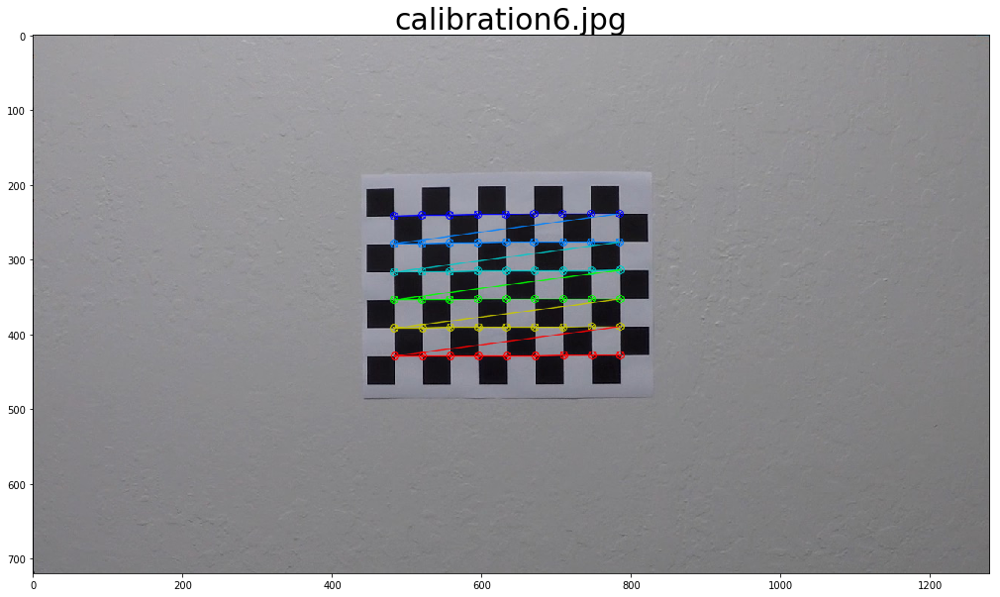

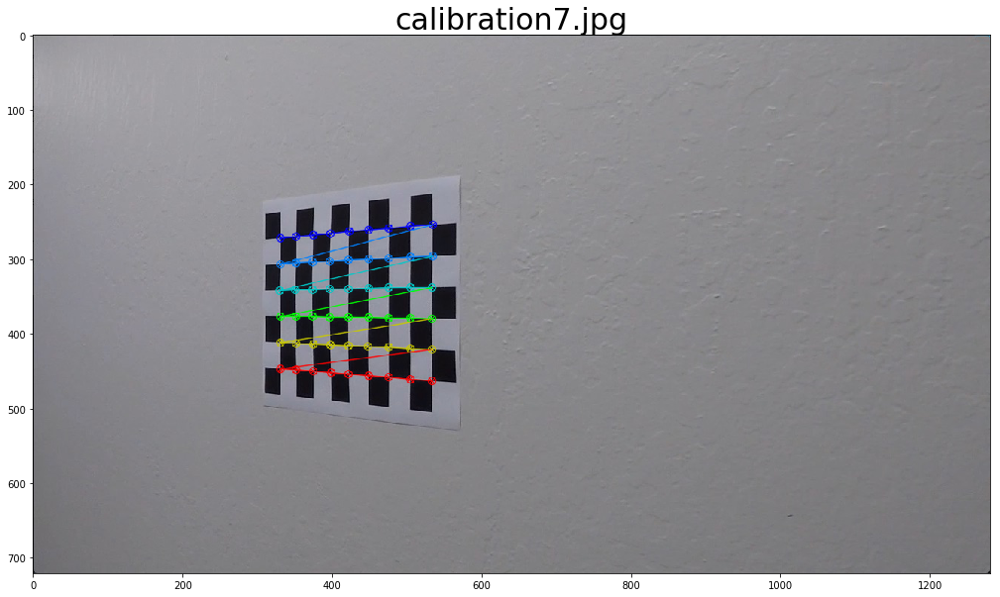

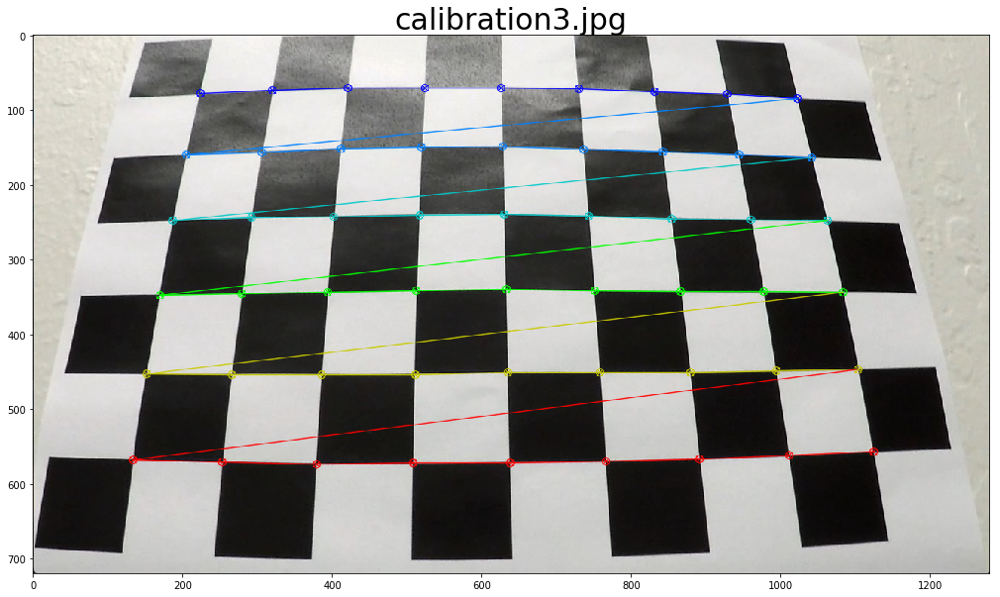

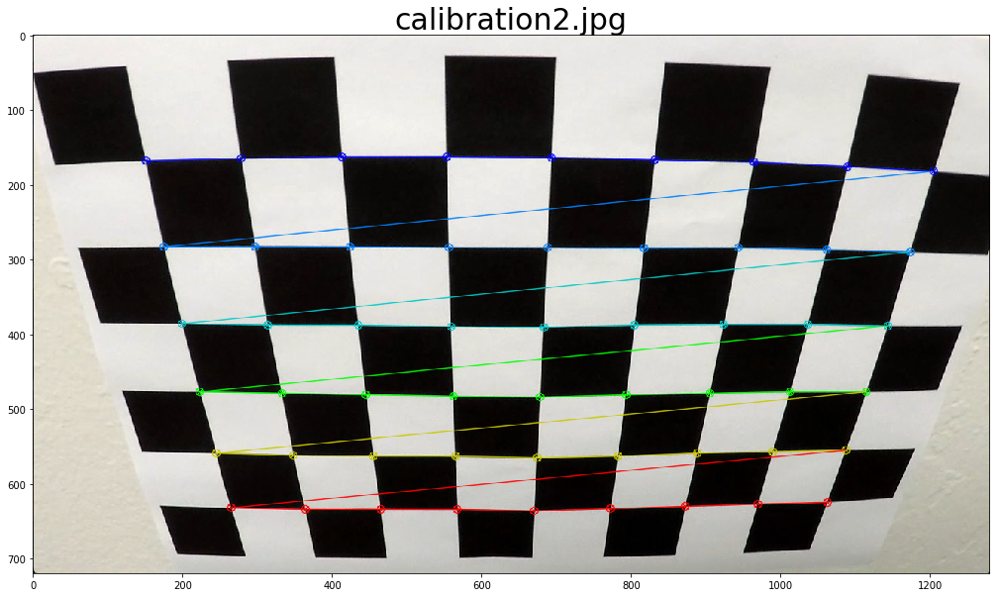

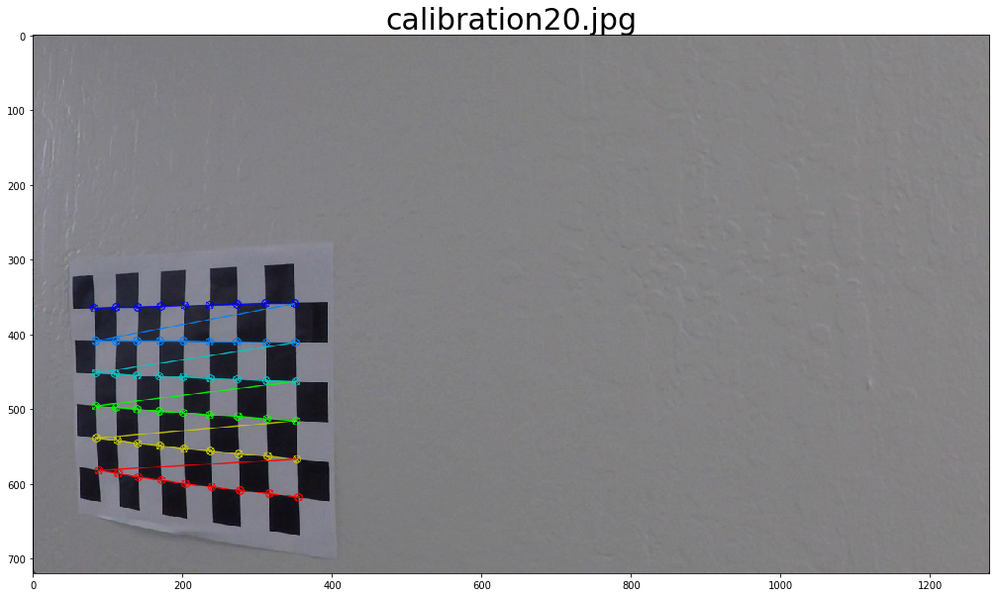

...

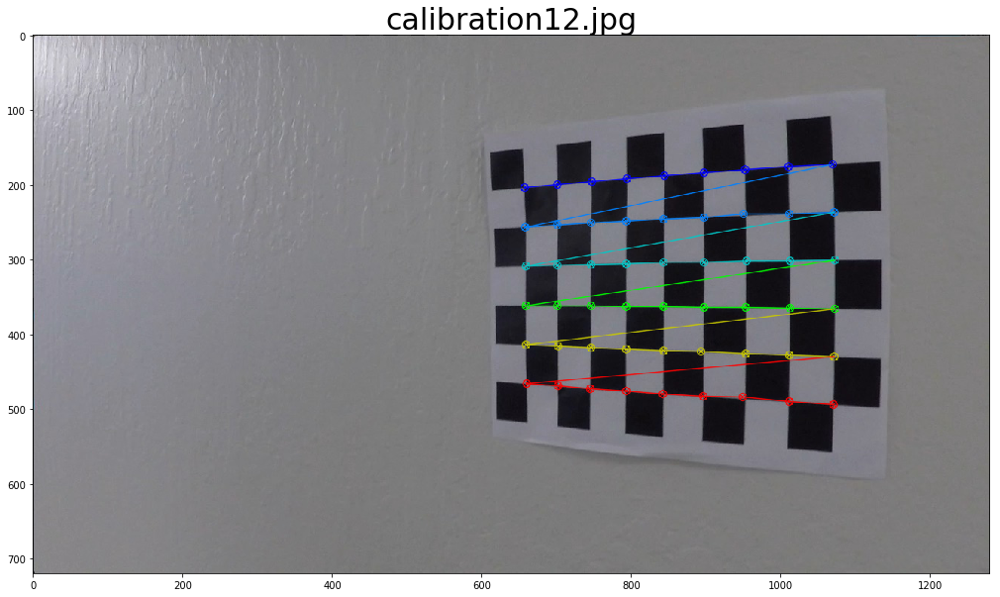

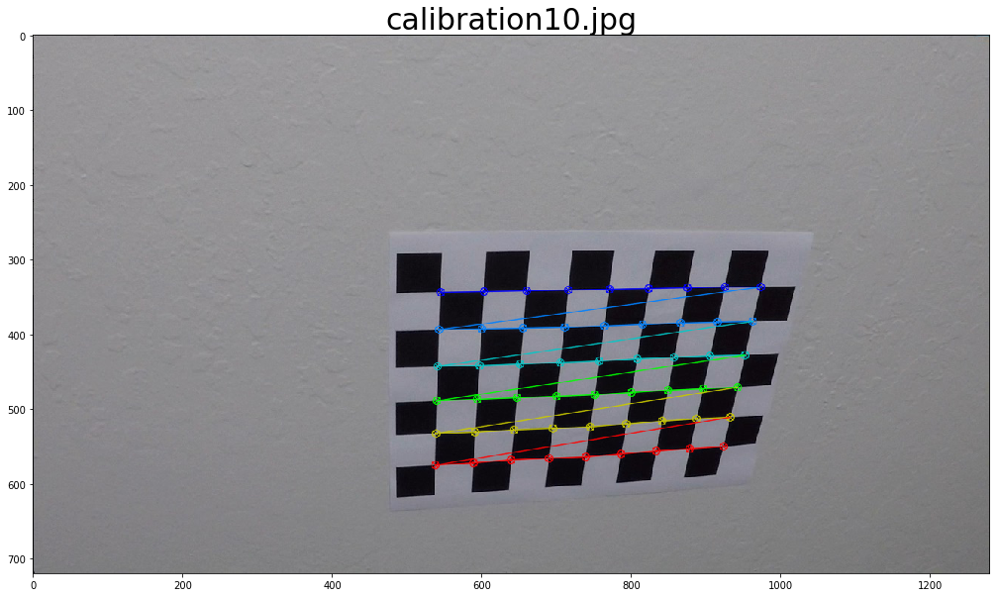

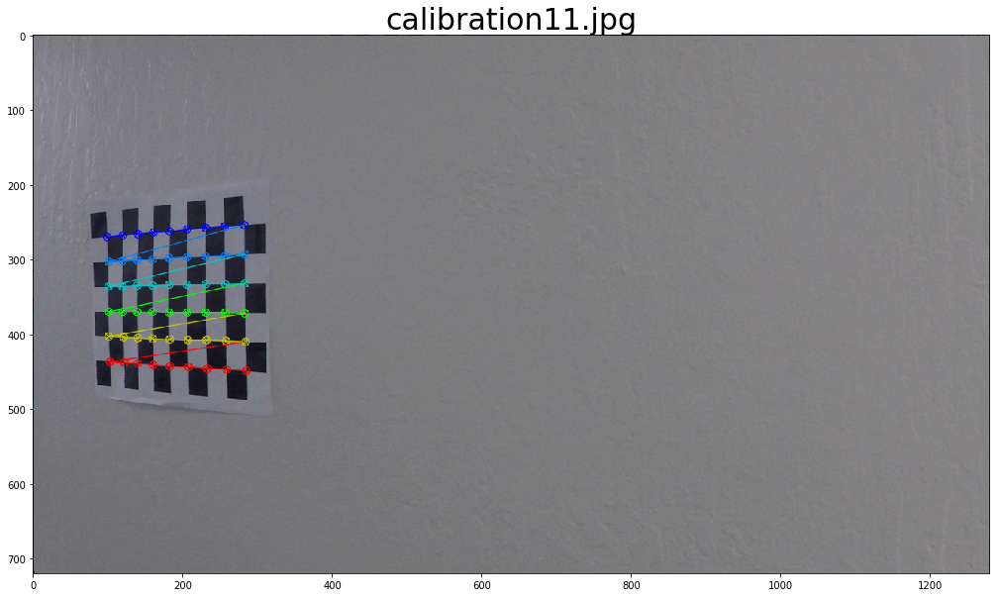

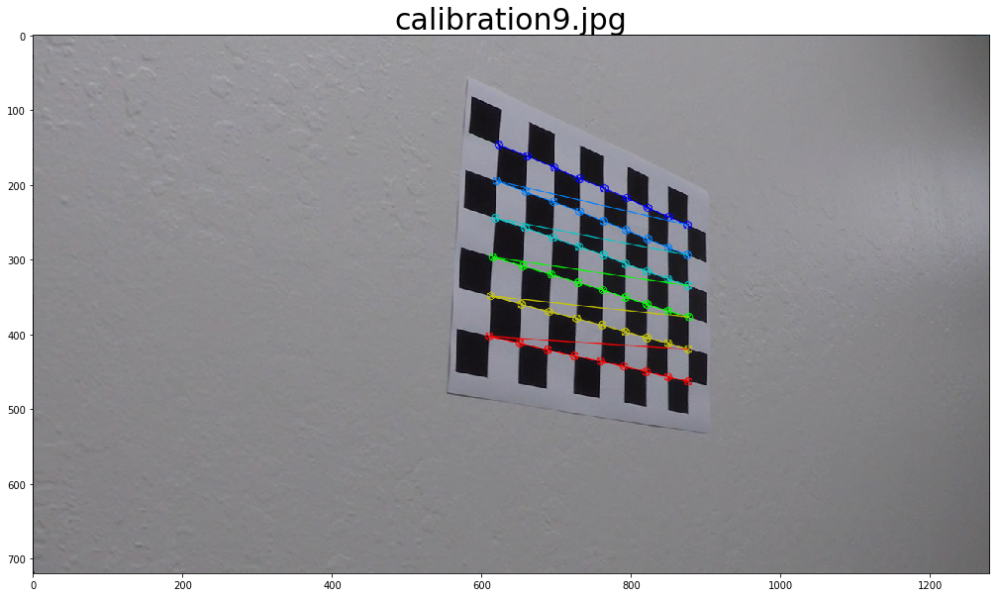

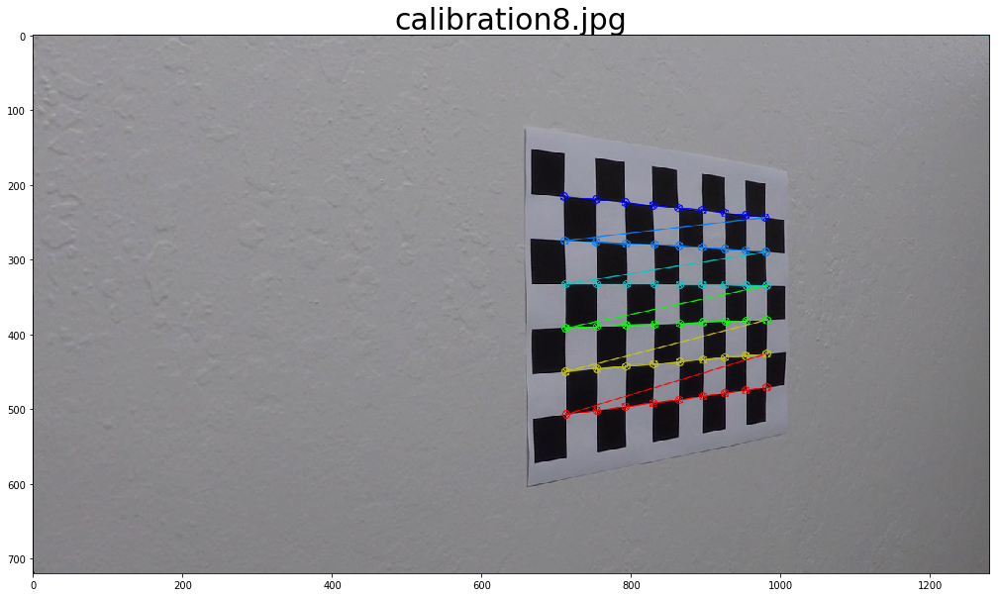

In [2]:
def calibrateCamera(images, verbose=True):
    # Array to store object and image points from all the images
    objpoints = []
    imgpoints = []
    m = 9
    n = 6
    objp = np.zeros((m * n, 3), np.float32)
    objp[:, :2] = np.mgrid[0:m, 0:n].T.reshape(-1, 2)

    for i, fname in enumerate(images):
        img = mpimg.imread(fname)
        # Convert image to grayscale
        gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

        # Find the corners of chess board
        ret, corners = cv2.findChessboardCorners(gray, (m, n), None)

        # if corners are found, add points to object and img points
        if ret == True:
            imgpoints.append(corners)
            objpoints.append(objp)
            img = cv2.drawChessboardCorners(img, (m, n), corners, ret)
            if verbose:
                f, ax1 = plt.subplots(1, 1, figsize=(20, 10))
                f.subplots_adjust(hspace=.2, wspace=.05)
                ax1.imshow(img)
                ax1.set_title(fname[11:], fontsize=30)
#                 plt.show()

    # Do camera calibration given object points and image points
    img = cv2.imread('camera_cal/calibration1.jpg')
    img_size = (img.shape[1], img.shape[0])

    ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, img_size, None, None)

    # Save the camera calibration result for later use (we won't worry about rvecs / tvecs)
    dist_pickle = {}
    dist_pickle["mtx"] = mtx
    dist_pickle["dist"] = dist
    pickle.dump(dist_pickle, open("calibration.p", "wb"))
    return mtx, dist

images = glob.glob("camera_cal/calibration*.jpg")
mtx, dist = calibrateCamera(images, verbose=True)

# Distortion Correction

- Apply a distortion correction to raw images.

- Before applying the undistort function on the image, we refine the camera matrix based on a free scaling parameter using cv2.getOptimalNewCameraMatrix(). If the scaling parameter alpha=0, it returns undistorted image with minimum unwanted pixels. So it may even remove some pixels at image corners. If alpha=1, all pixels are retained with some extra black images. It also returns an image ROI which can be used to crop the result.

- Notice that without the use of getOptimalNewCameraMatrix function to obtain the camera matrix of the distorted image, a large number of image pixels were being cropped out. This ensures we don't lose out any information from the original image.

- The function transforms an image to compensate radial and tangential lens distortion

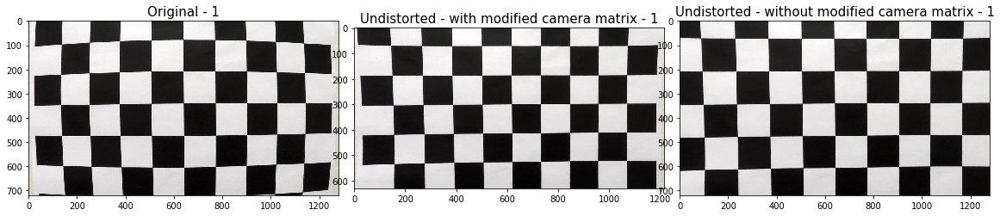

In [3]:
def cal_undistort(img, mtx, dist, fname=None, nameRemove = 0, verbose=False, compareUndist=True):
    h,  w = img.shape[:2]
    newcameramtx, roi = cv2.getOptimalNewCameraMatrix(cameraMatrix = mtx, 
                                                      distCoeffs = dist,imageSize = (w,h),
                                                      alpha = 1, newImgSize =(w,h))
    dst = cv2.undistort(img, mtx, dist, None, mtx)
    dst1 = cv2.undistort(img, mtx, dist, None, newcameramtx)
    x,y,w,h = roi
    dst1 = dst1[y:y+h, x:x+w]
    if verbose:
        if compareUndist:
            f, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(20,10))
            ax3.imshow(dst)
            ax3.set_title('Undistorted - without modified camera matrix - '+ fname[nameRemove:-4], fontsize=15)
        else:
            f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
        f.subplots_adjust(hspace = .2, wspace=.05)
        ax1.imshow(img)
        ax1.set_title('Original - ' + fname[nameRemove:-4], fontsize=15)
        ax2.imshow(dst1)
        ax2.set_title('Undistorted - with modified camera matrix - '+ fname[nameRemove:-4], fontsize=15)
    return dst1

images = glob.glob("camera_cal/calibration*.jpg")
for fname in images:
    img = mpimg.imread(fname)
    undist = cal_undistort(img, mtx, dist, fname, nameRemove = len("camera_cal/calibration"), 
                           verbose = True if "calibration1.jpg" in fname else False)
    

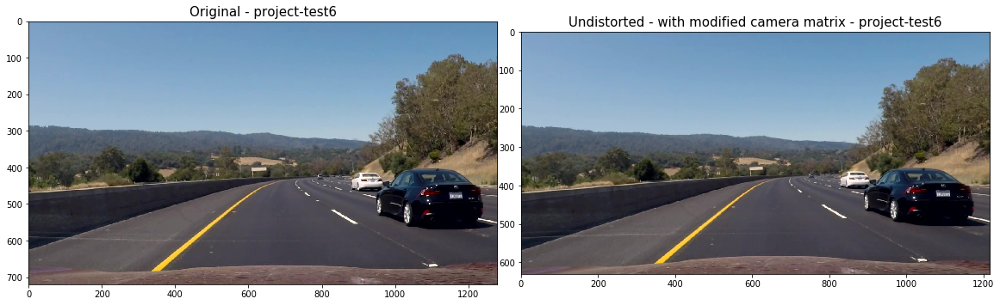

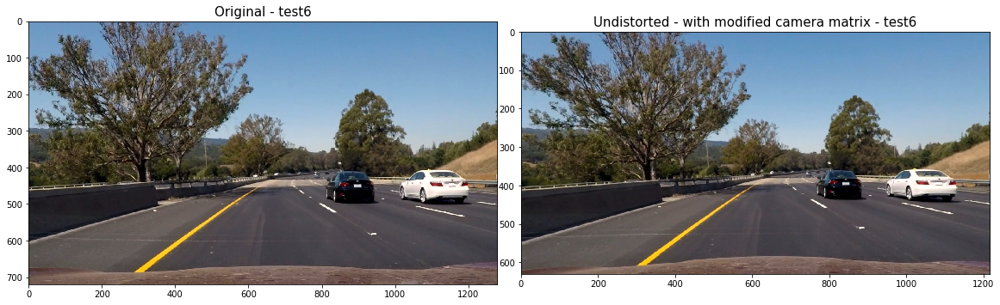

In [4]:
# Test undistortion on an image
test_images = glob.glob("test_images/*")

for fname in test_images:
    img = mpimg.imread(fname)
    n= len("test_images/")
    undist = cal_undistort(img, mtx, dist, fname, nameRemove= n, 
                           verbose= True if "test6.jpg" in fname else False, 
                           compareUndist= False)
    cv2.imwrite("undist_images/" + fname[n:],cv2.cvtColor(undist, cv2.COLOR_BGR2RGB))

# Thresholded binary image

Use color transforms, gradients, etc., to create a thresholded binary image

0.8286049049401556
1.9503567189680584
0.8882115358697117
1.1794081204105855
0.9268802198136628
0.9948768113106651
5.234888028067979
7.176574802293783
8.840840735088886
5.390008825588119
1.2784203501541218
3.9791385704286277
5.470701221235322
2.1485150839300386
0.8615152187050297


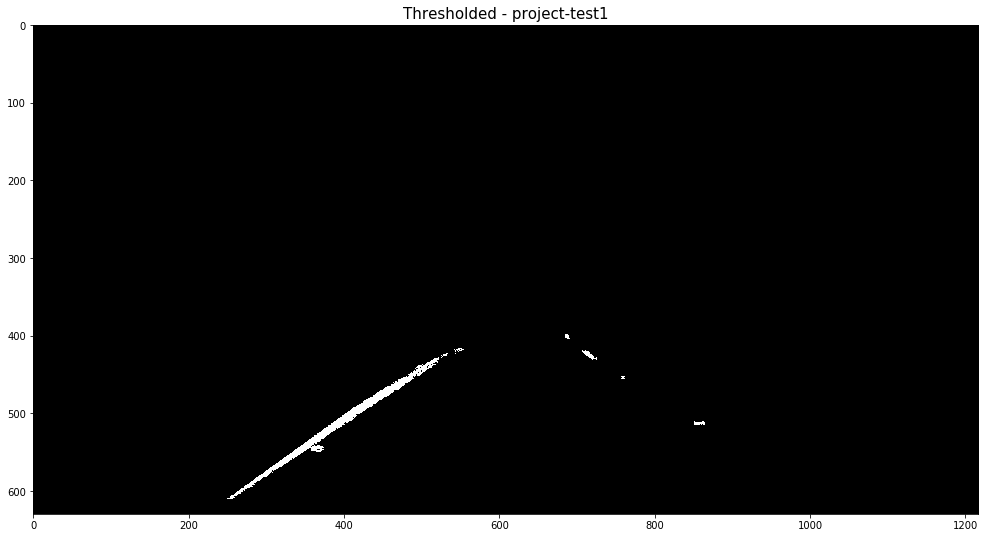

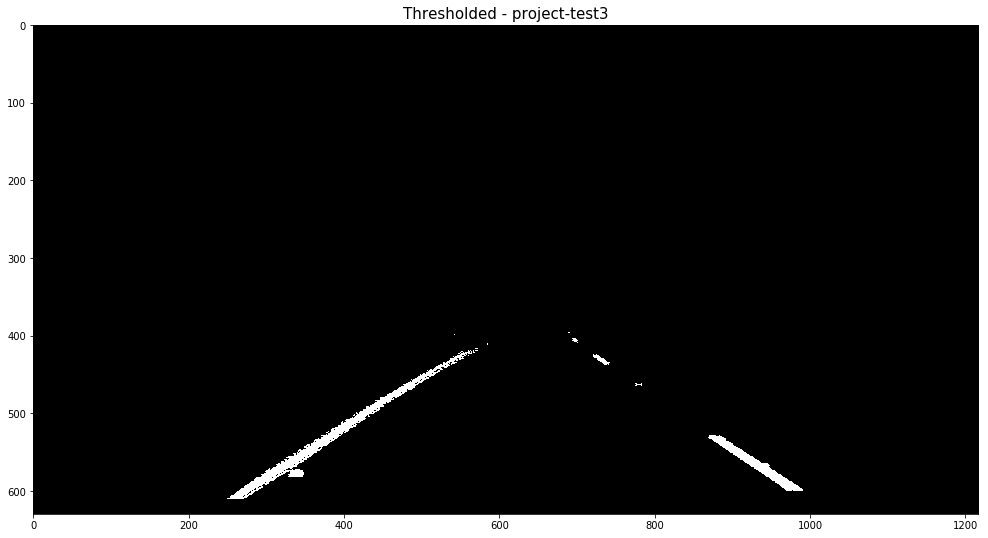

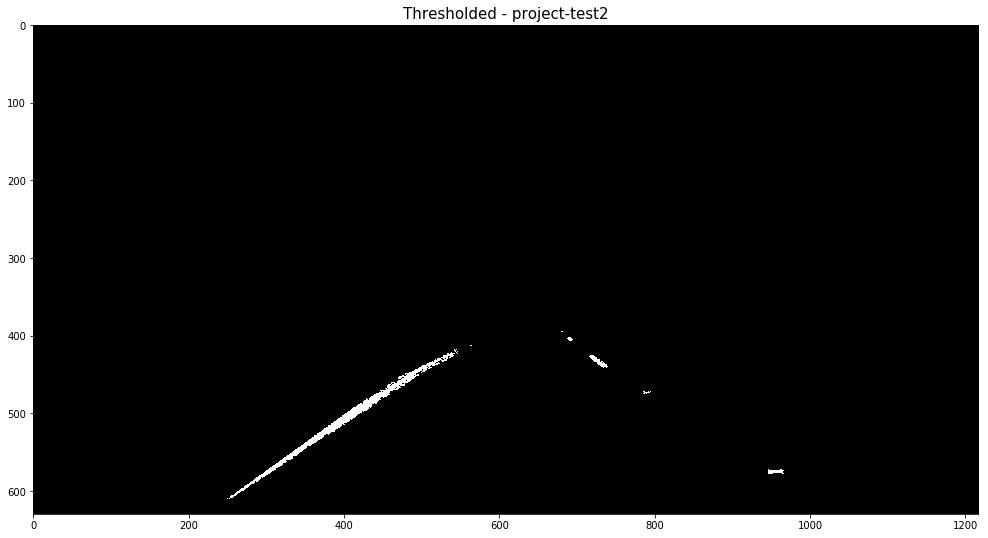

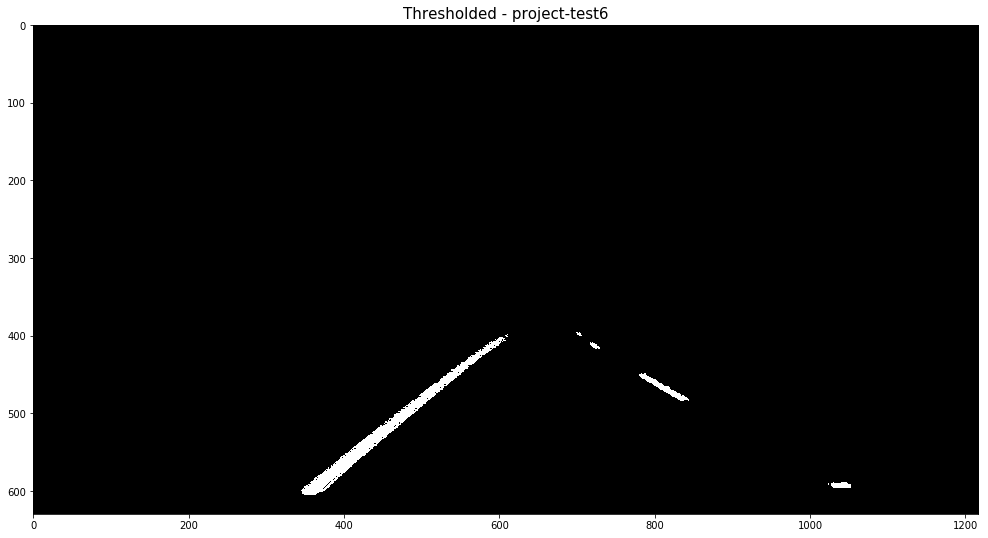

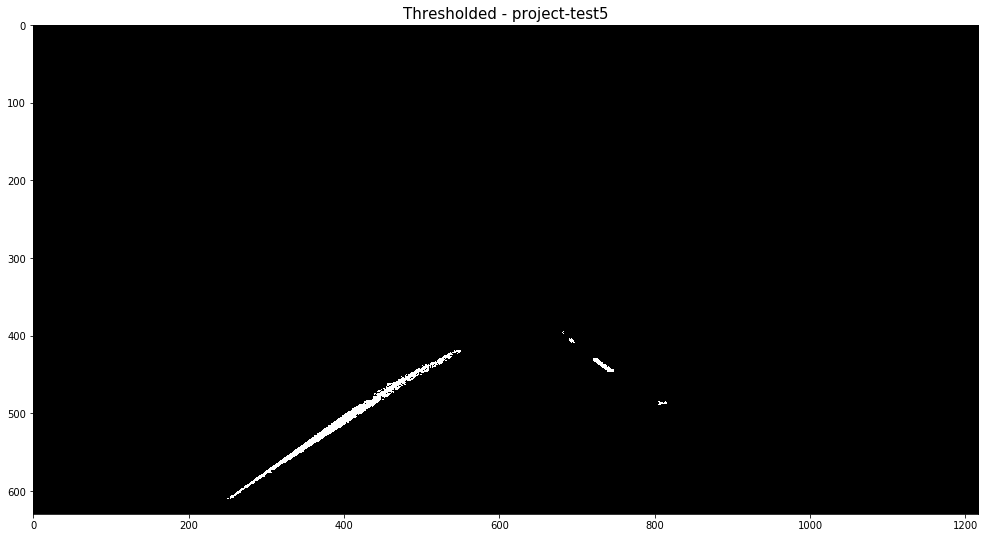

...

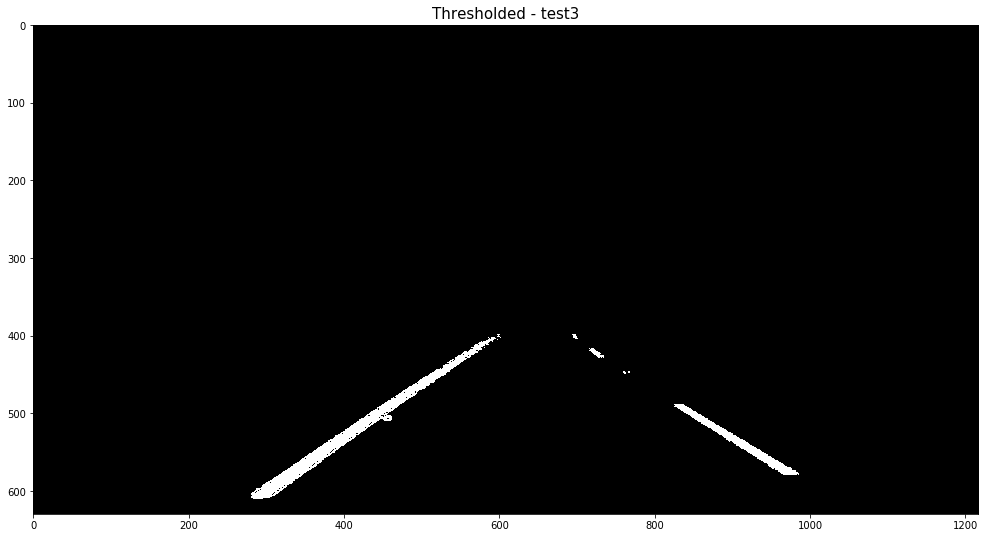

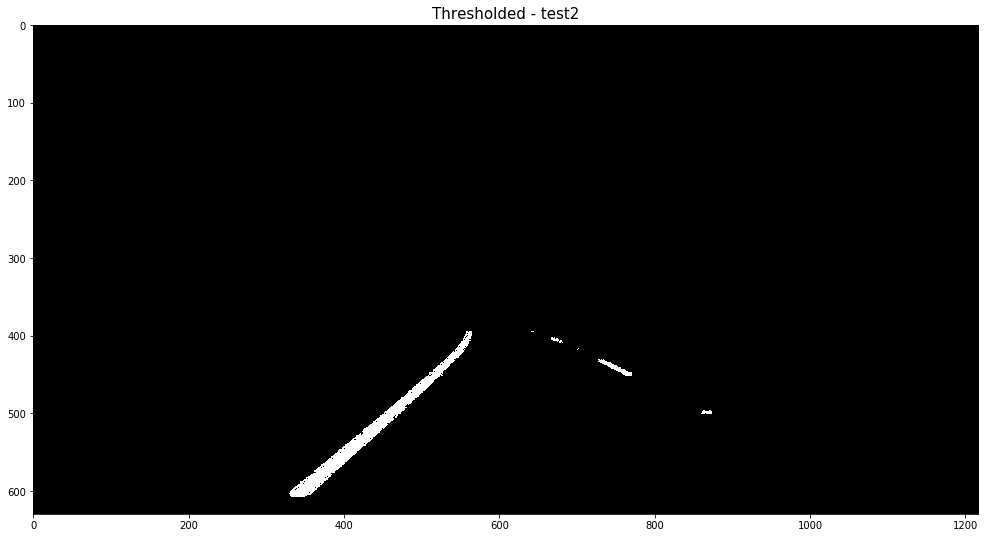

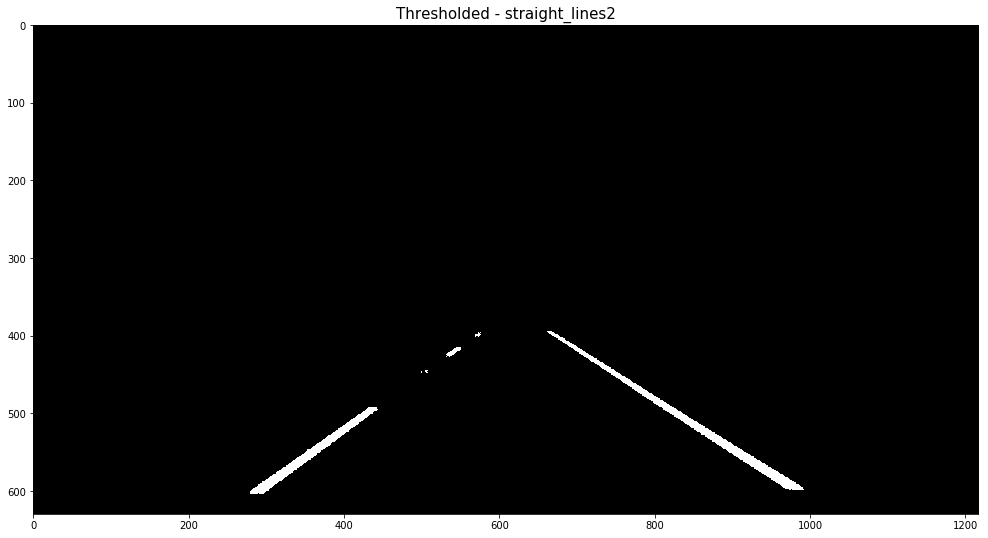

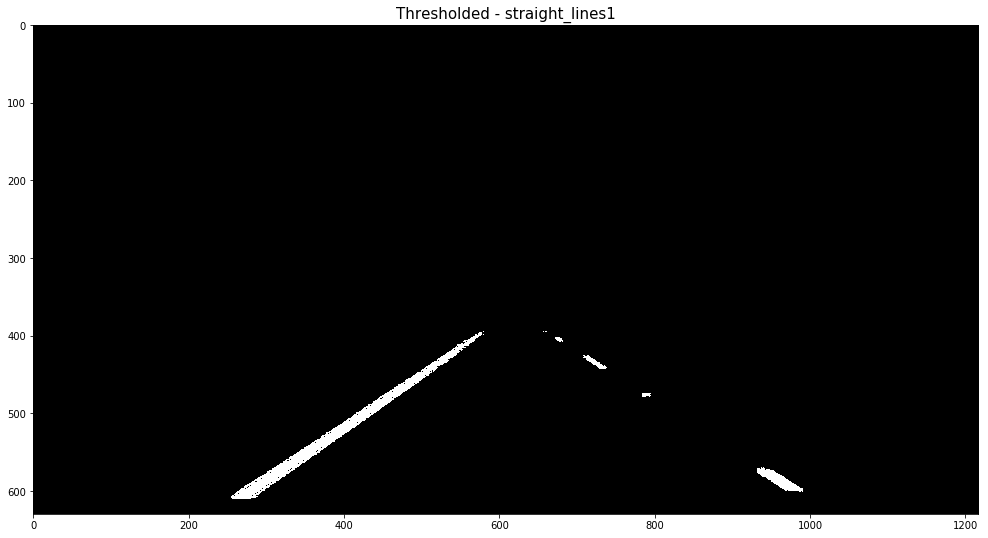

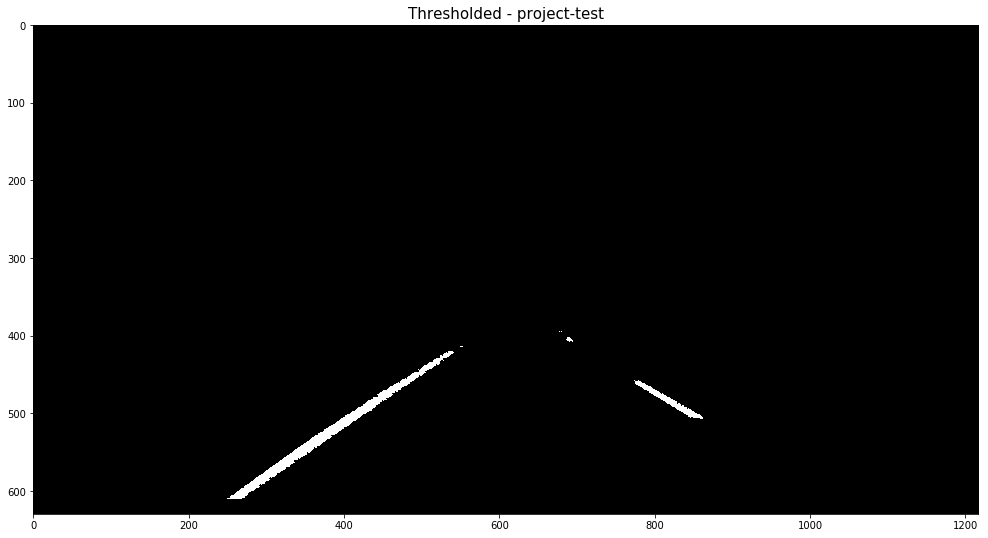

In [121]:
def hls_s_layer(image):
    hls = cv2.cvtColor(image, cv2.COLOR_RGB2HLS)
    return hls

def abs_sobel_thresh(gray, orient='x', thresh_min=0, thresh_max=255):
    sobel = cv2.Sobel(gray, cv2.CV_64F, 1 if orient == 'x' else 0, 0 if orient == 'x' else 1)
    abs_sobel = np.absolute(sobel)
    scaled_sobel = np.uint8(255*abs_sobel/np.max(abs_sobel))
    binary_output = np.zeros_like(scaled_sobel)
    binary_output[(scaled_sobel > thresh_min) & (scaled_sobel < thresh_max)] = 1
    return binary_output

def mag_thresh(gray, sobel_kernel=3, mag_thresh=(0, 255)):
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1)
    abs_sobelxy = np.sqrt(sobelx**2 + sobely**2)
    scaled_sobel = np.uint8(255*abs_sobelxy/np.max(abs_sobelxy))
    binary_output = np.zeros_like(scaled_sobel)
    binary_output[(scaled_sobel > mag_thresh[0]) & (scaled_sobel < mag_thresh[1])] = 1
    
    return binary_output

def dir_threshold(gray, sobel_kernel=3, thresh=(0, np.pi/2)):
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize = sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize = sobel_kernel)
    abs_sobelx = np.sqrt(sobelx**2)
    abs_sobely = np.sqrt(sobely**2) 
    grad = np.arctan2(abs_sobely, abs_sobelx)
    binary_output = np.zeros_like(grad)
    binary_output[(grad > thresh[0]) & (grad < thresh[1])] = 1
    return binary_output

def region_of_interest(img, vertices):
    #defining a blank mask to start with
    mask = np.zeros_like(img)   
    
    #defining a 3 channel or 1 channel color to fill the mask with depending on the input image
    if len(img.shape) > 2:
        channel_count = img.shape[2]  # i.e. 3 or 4 depending on your image
        ignore_mask_color = (255,) * channel_count
    else:
        ignore_mask_color = 255
        
    #filling pixels inside the polygon defined by "vertices" with the fill color    
    cv2.fillPoly(mask, vertices, ignore_mask_color)
    
    #returning the image only where mask pixels are nonzero
    masked_image = cv2.bitwise_and(img, mask)
    return masked_image

def getThresholdImage(image, verbose=False):
    
    hls = hls_s_layer(image)
    H = hls[:,:,0]
    L = hls[:,:,1]
    S = hls[:,:,2]
    H_thresh = (10, 40)
    H_binary = np.zeros_like(H)
    H_binary[(H > H_thresh[0]) & (H <= H_thresh[1])] = 1
    
    S_thresh = (100, 255)
    S_binary = np.zeros_like(S)
    S_binary[(S > S_thresh[0]) & (S <= S_thresh[1])] = 1
    
    L_thresh = (200, 255)
    L_binary = np.zeros_like(L)
    L_binary[(L > L_thresh[0]) & (L <= L_thresh[1])] = 1
    
    thresh = (150, 255)
    R = image[:,:,0]
    R_binary = np.zeros_like(R)
    R_binary[(R > thresh[0]) & (R <= thresh[1])] = 1

    mag_binary = mag_thresh(S, sobel_kernel=3, mag_thresh=(50, 200))
    dir_binary1 = dir_threshold(L_binary, sobel_kernel=3, thresh=(np.pi/6, np.pi/2))
    dir_binary2 = dir_threshold(R_binary, sobel_kernel=3, thresh=(np.pi/6, np.pi/2))
    dir_binary3 = dir_threshold(S_binary, sobel_kernel=3, thresh=(np.pi/6, np.pi/2))
    dir_binary = (((dir_binary1 == 1) | ((dir_binary2 == 1) & (dir_binary3 == 1))) 
                  | ((dir_binary2 == 1) & ((dir_binary1 == 1) | (dir_binary3 == 1))) 
                  | ((dir_binary3 == 1) | ((dir_binary1 == 1) & (dir_binary2 == 1))))
    
    combined = np.zeros_like(R)
    
    gradx = abs_sobel_thresh(S, orient='x', thresh_min=10, thresh_max=100)
    grady = abs_sobel_thresh(S_binary, orient='y', thresh_min=5, thresh_max=200)    
    
#     combined[((gradx == 1) | ((mag_binary == 1) | (dir_binary == 1)) & (L_binary == 1)) | (SSeq_binary == 1)] = 1
    combined[((mag_binary == 1) | (dir_binary == 1))| ((R_binary == 1) & (S_binary == 1)) | (L_binary == 1)] = 1
#     combined[(gradx == 1)] = 1
    h, w = combined.shape
    vertices = np.array([[(250, h-20),
                          ((w - 120) / 2, (h + 160) / 2),
                          ((w + 200) / 2, (h + 160) / 2),
                          (w -120, h-20)]],
                        dtype=np.int32)

    v = vertices[0]
    x = [v[0][0], v[1][0], v[2][0], v[3][0]]
    y = [v[0][1], v[1][1], v[2][1], v[3][1]]
    
    masked_image = region_of_interest(combined, vertices)
#     cv2.polylines(image,[v],True,(255,0,0), thickness=5)
    
    if verbose:
        f, (ax11, ax12, ax13) = plt.subplots(1, 3, figsize=(24, 9))
        f.tight_layout()
        ax11.imshow(image)
        ax11.set_title('Original - ' + fname[nameRemove:-4], fontsize=15)    

        ax12.imshow(hls, cmap='gray')
        ax12.set_title('HLS', fontsize=15) 

        ax13.imshow(mag_binary, cmap='gray')
        ax13.set_title('Mag', fontsize=15)  

        f, (ax21, ax22, ax23) = plt.subplots(1, 3, figsize=(24, 9))
        ax21.imshow(dir_binary, cmap='gray')
        ax21.set_title('Dir', fontsize=15)

#         inv_dir = np.ones_like(dir_binary)
#         inv_dir = np.subtract(inv_dir, dir_binary)
        ax22.imshow(gradx, cmap='gray')
        ax22.set_title('gradx', fontsize=15)

        ax23.imshow(grady, cmap='gray')
        ax23.set_title('grady', fontsize=15)

        f, (ax31, ax32, ax33) = plt.subplots(1, 3, figsize=(24, 9))
        ax33.imshow(L, cmap='gray')
        ax33.set_title('L', fontsize=15)

        ax31.imshow(S_binary, cmap='gray')
        ax31.set_title('S_binary', fontsize=15) 

        ax32.imshow(R, cmap='gray')
        ax32.set_title('R', fontsize=15) 

        f, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(24, 9))
        ax1.imshow(combined, cmap='gray')
        n= len("undist_images/") 
        ax1.set_title('R_binary', fontsize=15) 
        ax1.imshow(R_binary, cmap='gray')
        ax2.set_title('Combined', fontsize=15)
        ax2.imshow(combined, cmap = 'gray')
        ax3.set_title('Masked', fontsize=15)
        ax3.imshow(masked_image, cmap='gray')


    return masked_image

nameRemove= len("undist_images/") 
test_images = glob.glob("undist_images/*")
for fname in test_images:
    image = mpimg.imread(fname)
    thresholded = getThresholdImage(image)
    f, ax1 = plt.subplots(1, 1, figsize=(24, 9))
    ax1.imshow(thresholded, cmap = 'gray')
    ax1.set_title('Thresholded - ' + fname[nameRemove:-4], fontsize=15)   
    
# image = mpimg.imread("undist_images/project-test1.jpg")
# thresholded = getThresholdImage(image, verbose=True)

# Helper functions from Project 1
Since we obtained very good results in lane dection using hough lanes in project 1, we will use this principle in mapping a trapezoid that can be used to warp the image for perspective transform. For this purpose we re-included some of the functions used in project 1 here


In [122]:
import math

def grayscale(img):
    return cv2.cvtColor(img, cv2.COLOR_BGR2HLS)
    
def canny(img, low_threshold, high_threshold):
    """Applies the Canny transform"""
    return cv2.Canny(img, low_threshold, high_threshold)

def gaussian_blur(img, kernel_size):
    """Applies a Gaussian Noise kernel"""
    return cv2.GaussianBlur(img, (kernel_size, kernel_size), 0)

def getIntercepts(lines, min_y, max_y, color=[255, 0, 0], thickness=10):
    l = []
    if lines is not None:
        slope_left, intercept_left, slope_right, intercept_right = avgLines(lines=lines)

        if slope_left != 0:
            x11 = int((min_y - intercept_left)/slope_left)
            x12 = int((max_y - intercept_left) / slope_left)
            l += [(x11, min_y, x12, max_y)]
            
        if slope_right != 0:
            x21 = int((min_y - intercept_right) / slope_right)
            x22 = int((max_y - intercept_right) / slope_right)
            l += [(x21, min_y, x22, max_y)]
    return l


def hough_lines(img, rho, theta, threshold, min_line_len, max_line_gap, min_y, max_y):
    lines = cv2.HoughLinesP(img, rho, theta, threshold, np.array([]), minLineLength=min_line_len, maxLineGap=max_line_gap)
    l = getIntercepts(lines, min_y=min_y, max_y=max_y)
    return l

def avgLines(lines):
    left_slope = 0
    left_weights = 0
    left_intercept = 0
    right_slope = 0
    right_weights = 0
    right_intercept = 0
    for line in lines:
        for x1, y1, x2, y2 in line:
            if x2 == x1 and abs(slope) < 0.05:
                continue  # ignore a vertical line
            slope = (y2 - y1)*1.0 / (x2 - x1)
            intercept = y1 - slope * x1
            weight = np.sqrt((y2-y1)**2+(x2-x1)**2)
            if slope < 0:
                left_slope += slope*weight
                left_intercept += intercept*weight
                left_weights += weight
            else:
                right_slope += slope * weight
                right_intercept += intercept * weight
                right_weights += weight
                
    if left_weights != 0:
        left_slope = left_slope/left_weights
        left_intercept = left_intercept/left_weights
    if right_weights != 0:
        right_intercept = right_intercept/right_weights
        right_slope = right_slope/right_weights

    return left_slope, left_intercept, right_slope, right_intercept

def selectLaneColor(img):
    #     hsv = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)
    ## mask of white (200, 200, 200) ~ (255, 255,255)
    mask1 = cv2.inRange(img, np.array([0, 200, 0]), np.array([255, 255,255]))

    ## mask of yellow (190, 190, 0) ~ (255, 255, 255)
    mask2 = cv2.inRange(img, np.array([10,   0, 100]), np.array([40, 255, 255]))

    ## final mask and masked
    mask = cv2.bitwise_or(mask1, mask2)
    target = cv2.bitwise_and(img, img, mask=mask)
    # plt.imshow(target)
    return target

def detectLanes(img):

    img.astype('uint8')
    conv_img1 = cv2.cvtColor(img, cv2.COLOR_RGB2HLS_FULL)
    masked_img = selectLaneColor(conv_img1)
    conv_img2 = cv2.cvtColor(masked_img, cv2.COLOR_HLS2RGB)
    conv_img3 = cv2.cvtColor(conv_img2, cv2.COLOR_RGB2GRAY)
    kernel_size = 7  # Must be an odd number (3, 5, 7...)
    blur_gray = gaussian_blur(conv_img3, kernel_size)
    canny_img = canny(blur_gray, 50, 150)

    imshape = img.shape
    vertices = np.array([[(50, imshape[0]),
                          ((imshape[1] - 100) / 2, (imshape[0] + 100) / 2),
                          ((imshape[1] + 100) / 2, (imshape[0] + 100) / 2),
                          (imshape[1] - 50, imshape[0])]],
                        dtype=np.int32)
    v = vertices[0]
    x = [v[0][0], v[1][0], v[2][0], v[3][0]]
    y = [v[0][1], v[1][1], v[2][1], v[3][1]]
    masked_edges = region_of_interest(canny_img, vertices=vertices)

    rho = 1
    theta = np.pi / 180
    threshold = 30
    min_line_length = 10
    max_line_gap = 10
    lines = hough_lines(img=masked_edges, rho=rho, theta=theta, threshold=threshold, min_line_len=min_line_length,
                             max_line_gap=max_line_gap, min_y=int((imshape[0] + 200) / 2), max_y=imshape[0])

    return lines

# Perspective Transform
Apply a perspective transform to rectify binary image ("birds-eye view").


0.8286049049401556
1.9503567189680584
0.8882115358697117
1.1794081204105855
0.9268802198136628
0.9948768113106651
5.234888028067979
7.176574802293783
8.840840735088886
5.390008825588119
1.2784203501541218
3.9791385704286277
5.470701221235322
2.1485150839300386
0.8615152187050297


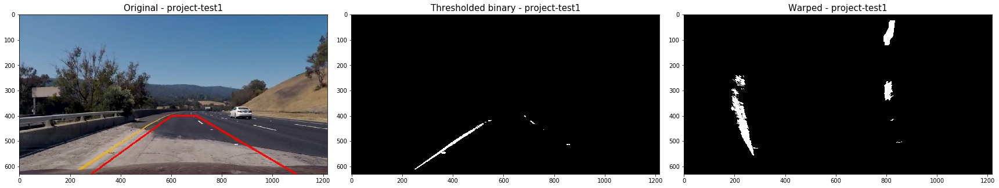

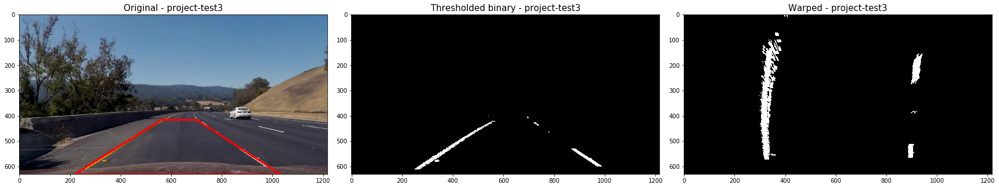

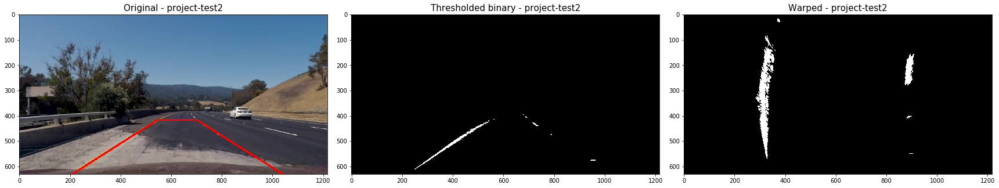

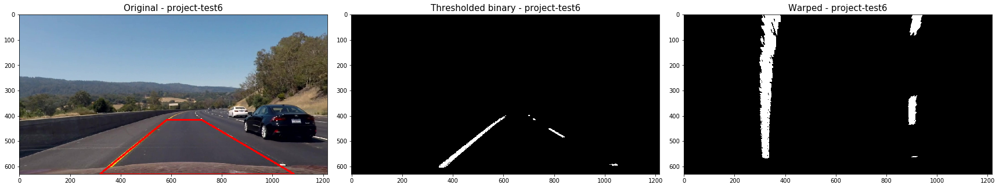

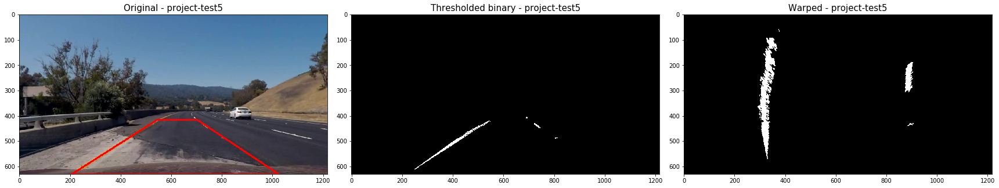

...

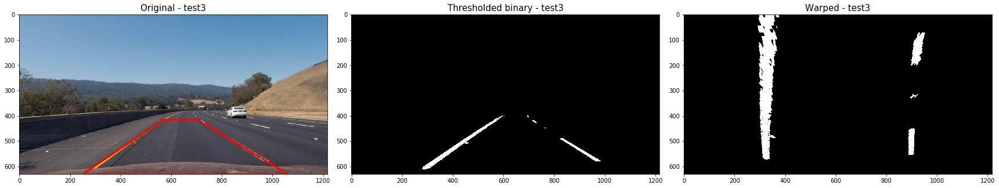

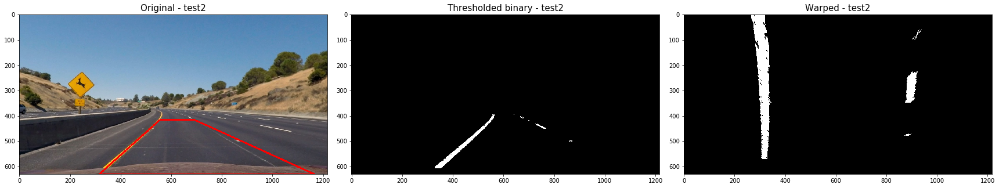

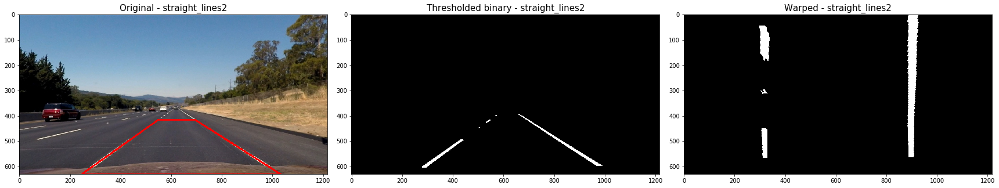

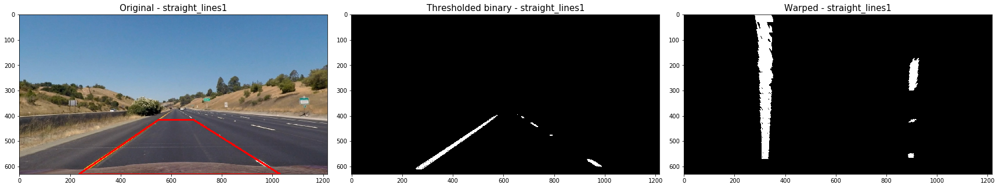

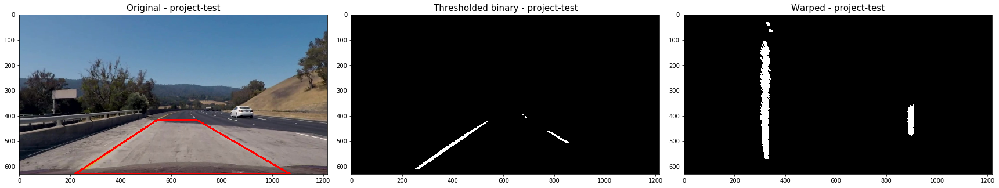

In [123]:
import matplotlib.cm as cm
def perspectiveTransform(img, thresholded):
    # Vertices extracted manually for performing a perspective transform
    
    lines = detectLanes(img)
    if len(lines) >1:
        left_line = lines[0]
        right_line = lines[1]
        
        bottom_left = left_line[2:]
        bottom_right = right_line[2:]
        top_left = left_line[:2]
        top_right = right_line[:2]
    else:
        bottom_left = [160,720]
        bottom_right = [1250, 720]
        top_left = [600, 400]
        top_right = [700, 400]
    h, w, b = img.shape
    source = np.float32([bottom_left,bottom_right,top_right,top_left])
    pts = np.array([bottom_left,bottom_right,top_right,top_left], np.int32)
    pts = pts.reshape((-1,1,2))
    copy = img.copy()
    cv2.polylines(copy,[pts],True,(255,0,0), thickness=5)

    dst = np.float32([(450,0),
                  (w-450,0),
                  (450,h),
                  (w-450,h)])
    
#     bottom_left = [320,720]
#     bottom_right = [920, 720]
#     top_left = [320, 1]
#     top_right = [920, 1]
    
    bottom_left = [320, h-50]
    bottom_right = [w-320, h-50]
    top_left = [320, 50]
    top_right = [w-320, 50]

    dst = np.float32([bottom_left,bottom_right,top_right,top_left])
    M = cv2.getPerspectiveTransform(source, dst)
    M_inv = cv2.getPerspectiveTransform(dst, source)
    image_shape = img.shape
    img_size = (image_shape[1], image_shape[0])

    warped = cv2.warpPerspective(thresholded, M, img_size , flags=cv2.INTER_LINEAR)
    
    unwarped = cv2.warpPerspective(warped, M_inv, img_size , flags=cv2.INTER_LINEAR)
    
    return copy, warped, unwarped, M, M_inv

nameRemove= len("undist_images/") 
test_images = glob.glob("undist_images/*")
for fname in test_images:
    image = mpimg.imread(fname)
    
    thresholded = getThresholdImage(image)
    img, warped, unwarped, M, M_inv = perspectiveTransform(image, thresholded)
    
    warped.astype('uint8')
    plt.imsave("warped_images/" + fname[nameRemove:], warped, cmap=cm.gray)
#     cv2.imwrite("warped_images/" + fname[nameRemove:], warped*255)
    
    f, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(24, 9))
    f.tight_layout()
    ax1.imshow(img)
    ax1.set_title('Original - ' + fname[nameRemove:-4], fontsize=15)    
    ax2.imshow(thresholded, cmap='gray')
    ax2.set_title('Thresholded binary - ' + fname[nameRemove:-4], fontsize=15)
    ax3.imshow(warped, cmap='gray')
    ax3.set_title('Warped - ' + fname[nameRemove:-4], fontsize=15)

# Find lane boundary
Detect lane pixels and fit to find the lane boundary.

In [ ]:
n=10
class Line():
    def __init__(self, recent_xfitted, bestx, best_fit, current_fit, radius_of_curvature):
        # x values of the last n fits of the line
        self.recent_xfitted = [] 
        #average x values of the fitted line over the last n iterations
        self.bestx = None     
        #polynomial coefficients averaged over the last n iterations
        self.best_fit = None 

        # was the line detected in the last iteration?
        self.detected = False  
        #polynomial coefficients for the most recent fit
        self.current_fit = [np.array([False])]  
        #difference in fit coefficients between last and new fits
        self.diffs = np.array([0,0,0], dtype='float') 
        #x values for detected line pixels
        self.allx = None  
    
    def compareToBestFit(best_fit, threshold):
        diff = np.mod(best_fit - self.current_fit)
        m1 = np.max(diff)
        m2 = np.min(diff)
        if m1-m2 < threshold { #Good 
            count = len(self.recent_xfitted)
            if count == n{
                self.recent_xfitted = self.recent_xfitted[:, 1:]
                count . = n-1
            }
            if len(self.recent_xfitted) < n{
                self.best_fit = np.add(count*self.best_fit, self.current_fit)/(count + 1)
                self.recent_xfitted.append(self.allx)
                self.bestx = np.mean(self.recent_xfitted, axis=0)
            }
        }
        return self.recent_xfitted, self.best_fit, self.bestx
    
    def parallelCheck(self, l, threshold):
        diff = np.mod(self.bestx - l.bestx)
        m1 = np.max(diff)
        m2 = np.min(diff)
        
        return (m1-m2 < threshold ? True : False)
    
    def distanceCheck(self, l, expectedDistance, threshold):
        diff = np.mod(self.bestx - l.bestx)
        avg = np.mod(np.mean(diff))
        v = np.mod(expectedDistance - avg)
        return (v < threshold ? True : False)
    
    def curvatureCheck(self, l, threshold):
        diff = np.mod(self.radius_of_curvature - l.radius_of_curvature)
        return (diff < threshold ? True : False)



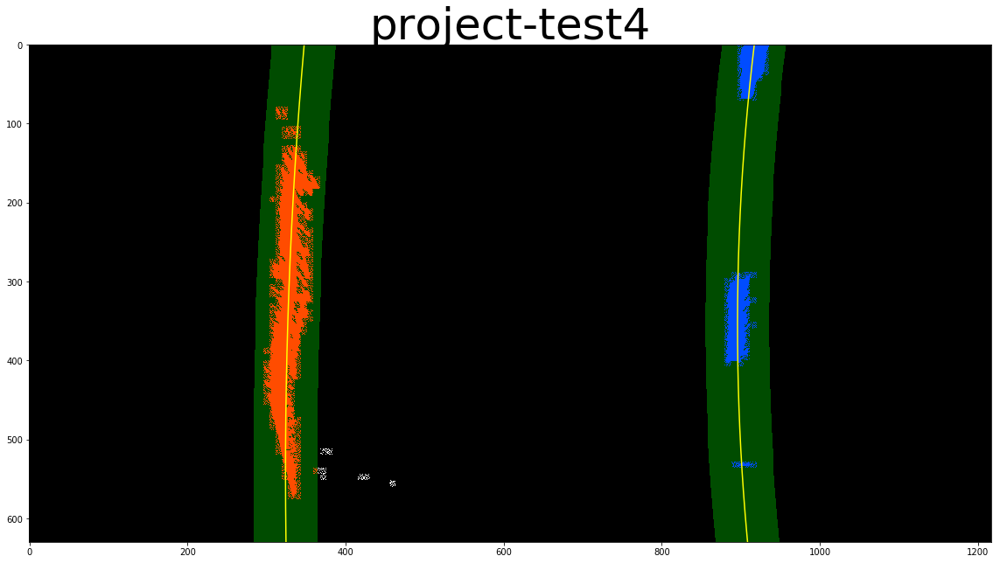

In [124]:
def plotHistogram(binary_warped):
    histogram = np.sum(binary_warped[binary_warped.shape[0] // 2:, :], axis=0)
    midpoint = np.int(histogram.shape[0] // 2)
    leftx_base = np.argmax(histogram[:midpoint])
    rightx_base = np.argmax(histogram[midpoint:]) + midpoint
    return histogram, leftx_base, rightx_base


def find_lane_pixels(binary_warped):
    # Take a histogram of the bottom half of the image
    histogram = np.sum(binary_warped[binary_warped.shape[0] // 2:, :], axis=0)
    # Create an output image to draw on and visualize the result
    out_img = np.dstack((binary_warped, binary_warped, binary_warped))
    # Find the peak of the left and right halves of the histogram
    # These will be the starting point for the left and right lines
    midpoint = np.int(histogram.shape[0] // 2)
    leftx_base = np.argmax(histogram[:midpoint])
    rightx_base = np.argmax(histogram[midpoint:]) + midpoint

    # HYPERPARAMETERS
    # Choose the number of sliding windows
    nwindows = 10
    # Set the width of the windows +/- margin
    margin = 40
    # Set minimum number of pixels found to recenter window
    minpix = 100

    # Set height of windows - based on nwindows above and image shape
    window_height = np.int(binary_warped.shape[0] // nwindows)
    # Identify the x and y positions of all nonzero pixels in the image
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    # Current positions to be updated later for each window in nwindows
    leftx_current = leftx_base
    rightx_current = rightx_base

    # Create empty lists to receive left and right lane pixel indices
    left_lane_inds = []
    right_lane_inds = []

    # Step through the windows one by one
    for window in range(nwindows):
        # Identify window boundaries in x and y (and right and left)
        win_y_low = binary_warped.shape[0] - (window + 1) * window_height
        win_y_high = binary_warped.shape[0] - window * window_height
        win_xleft_low = leftx_current - margin
        win_xleft_high = leftx_current + margin
        win_xright_low = rightx_current - margin
        win_xright_high = rightx_current + margin

        # Draw the windows on the visualization image
        cv2.rectangle(out_img, (win_xleft_low, win_y_low),
                      (win_xleft_high, win_y_high), (0, 255, 0), 2)
        cv2.rectangle(out_img, (win_xright_low, win_y_low),
                      (win_xright_high, win_y_high), (0, 255, 0), 2)

        # Identify the nonzero pixels in x and y within the window #
        good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) &
                          (nonzerox >= win_xleft_low) & (nonzerox < win_xleft_high)).nonzero()[0]
        good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) &
                           (nonzerox >= win_xright_low) & (nonzerox < win_xright_high)).nonzero()[0]

        # Append these indices to the lists
        left_lane_inds.append(good_left_inds)
        right_lane_inds.append(good_right_inds)

        # If you found > minpix pixels, recenter next window on their mean position
        if len(good_left_inds) > minpix:
            leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
        if len(good_right_inds) > minpix:
            rightx_current = np.int(np.mean(nonzerox[good_right_inds]))

    # Concatenate the arrays of indices (previously was a list of lists of pixels)
    try:
        left_lane_inds = np.concatenate(left_lane_inds)
        right_lane_inds = np.concatenate(right_lane_inds)
    except ValueError:
        # Avoids an error if the above is not implemented fully
        pass

    # Extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds]
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds]

    return leftx, lefty, rightx, righty, out_img


def fit_poly(binary_warped, leftx=None, lefty=None, rightx=None, righty=None):
    #     print(leftx, lefty, rightx, righty)
    img_shape = binary_warped.shape
    if leftx is None or lefty is None or rightx is None or righty is None:
        leftx, lefty, rightx, righty, _ = find_lane_pixels(binary_warped)
        ### Fit a second order polynomial to each with np.polyfit() ###
    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)

    # Generate x and y values for plotting
    ploty = np.linspace(0, img_shape[0] - 1, img_shape[0])

    ### Calc both polynomials using ploty, left_fit and right_fit ###
    try:
        left_fitx = left_fit[0] * ploty ** 2 + left_fit[1] * ploty + left_fit[2]
        right_fitx = right_fit[0] * ploty ** 2 + right_fit[1] * ploty + right_fit[2]
    except TypeError:
        # Avoids an error if `left` and `right_fit` are still none or incorrect
        print('The function failed to fit a line!')
        left_fitx = 1 * ploty ** 2 + 1 * ploty
        right_fitx = 1 * ploty ** 2 + 1 * ploty

    return left_fit, right_fit, left_fitx, right_fitx, ploty


def search_around_poly(binary_warped, left_fit=None, right_fit=None):
    # HYPERPARAMETER
    margin = 40

    # Grab activated pixels
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])

    if left_fit is None and right_fit is None:
        fit = fit_poly(binary_warped, None, None, None, None)
        left_fit = fit[0]
        right_fit = fit[1]

    ### Set the area of search based on activated x-values within the +/- margin of our polynomial function ###
    left_currentx = (left_fit[0] * (nonzeroy ** 2) + left_fit[1] * nonzeroy + left_fit[2])
    left_lane_inds = ((nonzerox > (left_currentx - margin)) & (nonzerox < (left_currentx + margin)))

    right_currentx = (right_fit[0] * (nonzeroy ** 2) + right_fit[1] * nonzeroy + right_fit[2])
    right_lane_inds = ((nonzerox > (right_currentx - margin)) & (nonzerox < (right_currentx + margin)))

    # Again, extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds]
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds]

    # Fit new polynomials
    left_fit, right_fit, left_fitx, right_fitx, ploty = fit_poly(binary_warped, leftx, lefty, rightx, righty)

    
    ## Visualization ##
    # Create an image to draw on and an image to show the selection window
    out_img = np.dstack((binary_warped, binary_warped, binary_warped)) * 255
    window_img = np.zeros_like(out_img)
    # Color in left and right line pixels
    out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0]
    out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0, 0, 255]

    # Generate a polygon to illustrate the search window area
    # And recast the x and y points into usable format for cv2.fillPoly()
    left_line_window1 = np.array([np.transpose(np.vstack([left_fitx - margin, ploty]))])
    left_line_window2 = np.array([np.flipud(np.transpose(np.vstack([left_fitx + margin,
                                                                    ploty])))])
    left_line_pts = np.hstack((left_line_window1, left_line_window2))
    right_line_window1 = np.array([np.transpose(np.vstack([right_fitx - margin, ploty]))])
    right_line_window2 = np.array([np.flipud(np.transpose(np.vstack([right_fitx + margin,
                                                                     ploty])))])
    right_line_pts = np.hstack((right_line_window1, right_line_window2))

    # Draw the lane onto the warped blank image
    cv2.fillPoly(window_img, np.int_([left_line_pts]), (0, 255, 0))
    cv2.fillPoly(window_img, np.int_([right_line_pts]), (0, 255, 0))
    result = cv2.addWeighted(out_img, 1, window_img, 0.3, 0)

    return result, left_fit, right_fit, left_fitx, right_fitx

nameRemove= len("warped_images/") 
# test_images = glob.glob("warped_images/*")
left_fit = None
right_fit = None
fname = "warped_images/project-test4.jpg"
image = mpimg.imread(fname)
binary_warped = image[:, :, 0]
img_shape = binary_warped.shape
result, left_fit, right_fit, left_fitx, right_fitx = search_around_poly(binary_warped, left_fit, right_fit)

f, ax1 = plt.subplots(1, 1, figsize=(16, 9))
f.tight_layout()
ax1.imshow(result)
ax1.set_title(fname[nameRemove:-4], fontsize=50)
#     ax2.imshow(mapped)
ploty = np.linspace(0, img_shape[0] - 1, img_shape[0])
plt.plot(left_fitx, ploty, color='yellow')
plt.plot(right_fitx, ploty, color='yellow')
# for fname in test_images:
   

# Lane Curvature

In [125]:
def measure_curvature_real(ploty, leftx, rightx):
    # Define conversions in x and y from pixels space to meters
    ym_per_pix = 30 / 720  # meters per pixel in y dimension
    xm_per_pix = 3.7 / 700  # meters per pixel in x dimension

    # Fit new polynomials to x,y in world space
    left_fit_cr = np.polyfit(ploty * ym_per_pix, leftx * xm_per_pix, 2)
    right_fit_cr = np.polyfit(ploty * ym_per_pix, rightx * xm_per_pix, 2)

    # Define y-value where we want radius of curvature
    y_eval = np.max(ploty)

    # Calculation of R_curve (radius of curvature)
    left_curverad = ((1 + (2 * left_fit_cr[0] * y_eval * ym_per_pix + left_fit_cr[1]) ** 2) ** 1.5) / np.absolute(
        2 * left_fit_cr[0])
    right_curverad = ((1 + (2 * right_fit_cr[0] * y_eval * ym_per_pix + right_fit_cr[1]) ** 2) ** 1.5) / np.absolute(
        2 * right_fit_cr[0])

    return left_curverad, right_curverad


def distance_from_center(img_shape, left_fitx, right_fitx):
    # compute the offset from the center
    lane_center = (right_fitx[0] + left_fitx[0]) / 2
    xm_per_pix = 3.7 / 700  # meters per pixel in x dimension
    center_offset_pixels = abs(img_shape[0] / 2 - lane_center)
    center_offset_mtrs = xm_per_pix * center_offset_pixels
    offset_string = "Center offset: %.2f m" % center_offset_mtrs
    return center_offset_mtrs

In [126]:
def warp_lane(warped, img, ploty, left_fitx, right_fitx, M_inv):
    img_shape = img.shape
    img_size = (img_shape[1], img_shape[0])
    out_img = np.dstack((warped, warped, warped)) * 255

    left_line_window = np.array(np.transpose(np.vstack([left_fitx, ploty])))

    right_line_window = np.array(np.flipud(np.transpose(np.vstack([right_fitx, ploty]))))

    line_points = np.vstack((left_line_window, right_line_window))

    cv2.fillPoly(out_img, np.int_([line_points]), [0, 255, 0])

    unwarped = cv2.warpPerspective(out_img, M_inv, img_size, flags=cv2.INTER_LINEAR)
    unwarped = unwarped.astype('uint8')
    result = cv2.addWeighted(img, 1, unwarped, 0.3, 0)

    return result

# nameRemove= len("warped_images/") 
# test_images = glob.glob("warped_images/*")
# left_fit = None
# right_fit = None
# for fname in test_images:
#     image = mpimg.imread(fname)
#     binary_warped = image[:, :, 0]
#     img_shape = binary_warped.shape
#     result, left_fit, right_fit, left_fitx, right_fitx = search_around_poly(binary_warped, left_fit, right_fit)
#     ploty = np.linspace(0, img_shape[0]-1, img_shape[0] )
#     left_curverad, right_curverad = measure_curvature_real(ploty, left_fitx, right_fitx)
#     center_distance = distance_from_center(img_shape, left_fitx, right_fitx)
#     average_curve_rad = (left_curverad + right_curverad)/2
    
# #     mapped = warp_lane(fname[nameRemove:], ploty, left_fitx, right_fitx, M_inv, img_shape)
    
#     print(fname[nameRemove:-4], "Curvature", average_curve_rad, 'm', "Offset", center_distance, "m")
#     f, ax1 = plt.subplots(1, 1, figsize=(16, 9))
#     f.tight_layout()
#     ax1.imshow(result)
#     ax1.set_title(fname[nameRemove:-4], fontsize=50)
# #     ax2.imshow(mapped)
    
#     plt.plot(left_fitx, ploty, color='yellow')
#     plt.plot(right_fitx, ploty, color='yellow')
    

Warp the detected lane boundaries back onto the original image.

0.9067513575319656


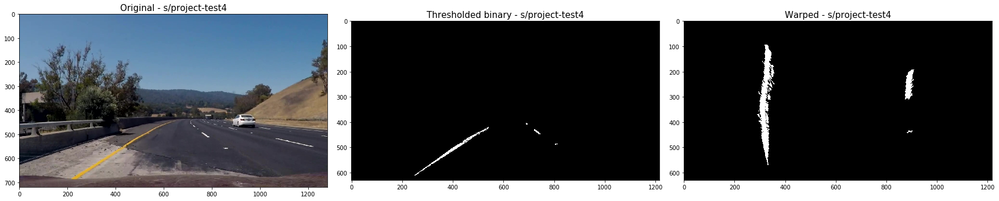

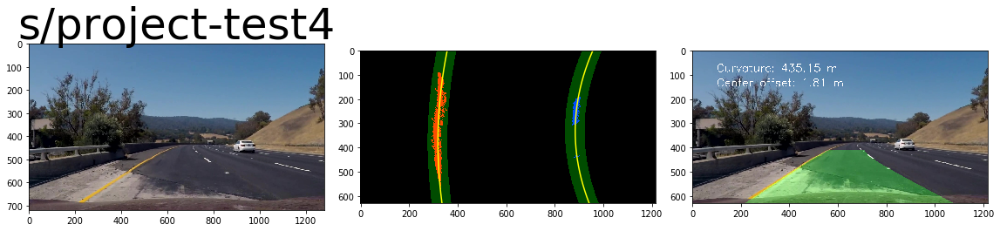

In [127]:
def plotPerspectiveTransform(fname, img, thresholded, warped):
    f, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(24, 9))
    f.tight_layout()
    ax1.imshow(img)
    ax1.set_title('Original - ' + fname, fontsize=15)
    ax2.imshow(thresholded, cmap='gray')
    ax2.set_title('Thresholded binary - ' + fname, fontsize=15)
    ax3.imshow(warped, cmap='gray')
    ax3.set_title('Warped - ' + fname, fontsize=15)


def plotFinal(original, result, mapped, left_fitx, right_fitx, ploty, fname):
    f, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(16, 9))
    f.tight_layout()
    result = result.astype(int)
    ax1.imshow(original)
    ax1.set_title(fname, fontsize=50)
    ax2.imshow(result)
    ax2.plot(left_fitx, ploty, color='yellow')
    ax2.plot(right_fitx, ploty, color='yellow')
    ax3.imshow(mapped)
    

In [ ]:

def final_pipeline(img=None, fname=None, nameRemove=0, verbose=False, left_fit=None, right_fit=None):
    if img is None:
        img = mpimg.imread(fname)
        
    undist = cal_undistort(img, mtx, dist, fname, nameRemove=nameRemove, verbose=False, compareUndist=False)
    # cv2.imwrite("undist_images/" + fname[n:],cv2.cvtColor(undist, cv2.COLOR_BGR2RGB))
    thresholded = getThresholdImage(undist)
#     plt.imshow(thresholded)
    
    image, warped, unwarped, M, M_inv = perspectiveTransform(undist, thresholded)
    warped.astype('uint8')
    
    if verbose:
#         plt.imshow(warped)
        plotPerspectiveTransform(fname[nameRemove:-4], img, thresholded, warped)

    result, left_fit, right_fit, left_fitx, right_fitx = search_around_poly(warped, left_fit, right_fit)

    warped = warped * 255
    img_shape = warped.shape
    ploty = np.linspace(0, img_shape[0] - 1, img_shape[0])
    left_curverad, right_curverad = measure_curvature_real(ploty, left_fitx, right_fitx)
    offset = distance_from_center(img_shape, left_fitx, right_fitx)
    average_curve_rad = (left_curverad + right_curverad) / 2

    mapped = warp_lane(warped, undist, ploty, left_fitx, right_fitx, M_inv)
    
    curv_str = "Curvature: %.2f m" % average_curve_rad  
    offset_str = "Center offset: %.2f m" % offset
    
    cv2.putText(mapped, curv_str , (100, 90), cv2.FONT_HERSHEY_SIMPLEX, 1.5, (255,255,255), thickness=2)
    cv2.putText(mapped, offset_str, (100, 150), cv2.FONT_HERSHEY_SIMPLEX, 1.5, (255,255,255), thickness=2)

    if verbose:
#         print(fname[nameRemove:-4], "Curvature", average_curve_rad, 'm', "Offset", offset, "m")
        plotFinal(img, result, mapped, left_fitx, right_fitx, ploty, fname[nameRemove:-4])
    
    return mapped

test_images = glob.glob("test_images/*")

img = mpimg.imread("test_images/project-test5.jpg")
n = len("test_images/")
mapped = final_pipeline(img, fname, nameRemove=n, verbose=True)
# cv2.imwrite("final_images/" + fname[n:], cv2.cvtColor(mapped, cv2.COLOR_BGR2RGB))

# for fname in test_images:
#     img = mpimg.imread(fname)
#     n = len("test_images/")
#     mapped = final_pipeline(img, fname, nameRemove=n, verbose=True)
#     cv2.imwrite("final_images/" + fname[n:], cv2.cvtColor(mapped, cv2.COLOR_BGR2RGB))
    

Output visual display of the lane boundaries and numerical estimation of lane curvature and vehicle position

In [128]:
from moviepy.editor import VideoFileClip

output = 'test_videos_output/project_video.mp4'
## To speed up the testing process you may want to try your pipeline on a shorter subclip of the video
## To do so add .subclip(start_second,end_second) to the end of the line below
## Where start_second and end_second are integer values representing the start and end of the subclip
## You may also uncomment the following line for a subclip of the first 5 seconds
##clip1 = VideoFileClip("test_videos/solidWhiteRight.mp4").subclip(0,5)
clip1 = VideoFileClip("project_video.mp4")
clip = clip1.fl_image(final_pipeline) #NOTE: this function expects color images!!
%time clip.write_videofile(output, audio=False)

1.6420767521835722
[MoviePy] >>>> Building video test_videos_output/project_video.mp4
[MoviePy] Writing video test_videos_output/project_video.mp4


  0%|          | 0/1261 [00:00<?, ?it/s]

1.6420767521835722


  0%|          | 1/1261 [00:00<06:26,  3.26it/s]

1.7017125119015013


  0%|          | 2/1261 [00:00<06:23,  3.28it/s]

1.8084595218531125


  0%|          | 3/1261 [00:00<06:34,  3.19it/s]

1.8212196701925543


  0%|          | 4/1261 [00:01<06:13,  3.37it/s]

1.7189650150208902


  0%|          | 6/1261 [00:01<06:08,  3.41it/s]

1.6086086438592602


  1%|          | 7/1261 [00:02<05:43,  3.65it/s]

1.5119023707355672


  1%|          | 8/1261 [00:02<05:29,  3.81it/s]

1.3656619408468218
1.38995752413994


  1%|          | 9/1261 [00:02<05:54,  3.54it/s]

1.420106689621891


  1%|          | 11/1261 [00:03<05:43,  3.64it/s]

1.4656467243155822


  1%|          | 12/1261 [00:03<05:21,  3.89it/s]

1.4936281862329521


  1%|          | 13/1261 [00:03<05:12,  3.99it/s]

1.4741623299552633


  1%|          | 14/1261 [00:03<05:07,  4.05it/s]

1.4859534026337642


  1%|          | 15/1261 [00:04<04:56,  4.21it/s]

1.529288779329864


  1%|▏         | 16/1261 [00:04<04:54,  4.23it/s]

1.569380861081765


  1%|▏         | 17/1261 [00:04<04:47,  4.33it/s]

1.6293257337628744


  1%|▏         | 18/1261 [00:04<04:42,  4.40it/s]

1.5421763117736824


  2%|▏         | 19/1261 [00:04<04:46,  4.33it/s]

1.484654345623943


  2%|▏         | 20/1261 [00:05<04:50,  4.27it/s]

1.3720254942111967


  2%|▏         | 21/1261 [00:05<04:45,  4.34it/s]

1.3199075704416707


  2%|▏         | 22/1261 [00:05<04:42,  4.38it/s]

1.2908087803732833


  2%|▏         | 23/1261 [00:05<04:39,  4.43it/s]

1.2797276675666158


  2%|▏         | 24/1261 [00:06<04:38,  4.44it/s]

1.3005082321434005


  2%|▏         | 25/1261 [00:06<04:39,  4.43it/s]

1.3313517062079099


  2%|▏         | 26/1261 [00:06<04:39,  4.42it/s]

1.3416650363240339


  2%|▏         | 27/1261 [00:06<04:36,  4.47it/s]

1.402099446553021


  2%|▏         | 28/1261 [00:06<04:35,  4.47it/s]

1.4890397499271781


  2%|▏         | 29/1261 [00:07<04:43,  4.34it/s]

1.628919234999761


  2%|▏         | 30/1261 [00:07<04:42,  4.35it/s]

1.663122084403925


  2%|▏         | 31/1261 [00:07<04:44,  4.32it/s]

1.6563459456639407


  3%|▎         | 32/1261 [00:07<04:36,  4.44it/s]

1.6050514536134914


  3%|▎         | 33/1261 [00:08<04:31,  4.52it/s]

1.5283344854421272


  3%|▎         | 34/1261 [00:08<04:29,  4.55it/s]

1.6059366209735972


  3%|▎         | 35/1261 [00:08<04:26,  4.60it/s]

1.6502554203458066


  3%|▎         | 36/1261 [00:08<04:28,  4.56it/s]

1.7297287544617044


  3%|▎         | 37/1261 [00:08<04:24,  4.64it/s]

1.7890549664584177


  3%|▎         | 38/1261 [00:09<04:21,  4.68it/s]

1.8233538973884085


  3%|▎         | 39/1261 [00:09<04:22,  4.66it/s]

1.8757996287166379


  3%|▎         | 40/1261 [00:09<04:25,  4.60it/s]

1.94139418206797


  3%|▎         | 41/1261 [00:09<04:32,  4.47it/s]

2.0470147339498204


  3%|▎         | 42/1261 [00:10<04:30,  4.50it/s]

2.1650797998374003
2.112085403868477


  3%|▎         | 44/1261 [00:10<04:39,  4.36it/s]

1.9745588292835623
1.8473381939281692


  4%|▎         | 46/1261 [00:10<04:20,  4.66it/s]

1.7030133079434642
1.7376039615152188


  4%|▍         | 48/1261 [00:11<04:23,  4.61it/s]

1.6776664797207115


  4%|▍         | 49/1261 [00:11<04:23,  4.59it/s]

1.5608596035876232


  4%|▍         | 50/1261 [00:11<04:28,  4.50it/s]

1.4595096798876586


  4%|▍         | 51/1261 [00:12<04:28,  4.51it/s]

1.3348571602474644


  4%|▍         | 52/1261 [00:12<04:41,  4.29it/s]

1.22438644772252


  4%|▍         | 53/1261 [00:12<04:41,  4.29it/s]

1.2079347689043662


  4%|▍         | 54/1261 [00:12<04:38,  4.34it/s]

1.2929282257959334


  4%|▍         | 55/1261 [00:13<04:41,  4.28it/s]

1.3463773786699014


  4%|▍         | 56/1261 [00:13<05:12,  3.86it/s]

1.2623882128401438


  5%|▍         | 57/1261 [00:13<05:02,  3.98it/s]

1.1495467647480795
0.9685952533117693


  5%|▍         | 59/1261 [00:14<05:08,  3.90it/s]

0.9371483350941033


  5%|▍         | 60/1261 [00:14<05:04,  3.94it/s]

0.863656836787486


  5%|▍         | 61/1261 [00:14<04:59,  4.01it/s]

0.8506919174133636


  5%|▍         | 62/1261 [00:14<04:53,  4.08it/s]

0.8629347036906609


  5%|▍         | 63/1261 [00:15<04:48,  4.15it/s]

0.8428601861633908


  5%|▌         | 64/1261 [00:15<04:53,  4.08it/s]

0.8862620808389091


  5%|▌         | 65/1261 [00:15<04:45,  4.19it/s]

0.9541247668610036


  5%|▌         | 66/1261 [00:15<04:43,  4.22it/s]

1.0504927982331433


  5%|▌         | 67/1261 [00:16<04:38,  4.29it/s]

1.1966054092594767


  5%|▌         | 68/1261 [00:16<04:41,  4.24it/s]

1.136381856677666


  5%|▌         | 69/1261 [00:16<04:41,  4.24it/s]

1.0594722906966128


  6%|▌         | 70/1261 [00:16<04:37,  4.29it/s]

0.9366740140774652


  6%|▌         | 71/1261 [00:16<04:34,  4.34it/s]

0.8364514179633326


  6%|▌         | 72/1261 [00:17<04:46,  4.15it/s]

0.856820266680579


  6%|▌         | 73/1261 [00:17<04:45,  4.15it/s]

0.884610435062366


  6%|▌         | 74/1261 [00:17<04:38,  4.26it/s]

0.9136874872289827


  6%|▌         | 75/1261 [00:17<04:37,  4.28it/s]

0.9544425749848922


  6%|▌         | 76/1261 [00:18<04:41,  4.22it/s]

0.9699456117697696


  6%|▌         | 77/1261 [00:18<04:39,  4.23it/s]

1.0167320977509966


  6%|▌         | 78/1261 [00:18<04:36,  4.28it/s]

1.0933182037537008


  6%|▋         | 79/1261 [00:18<04:39,  4.22it/s]

1.2259802706803529


  6%|▋         | 80/1261 [00:19<04:38,  4.24it/s]

1.3186998126192868


  6%|▋         | 81/1261 [00:19<04:37,  4.25it/s]

1.2566763617708565


  7%|▋         | 82/1261 [00:19<04:35,  4.28it/s]

1.1876580888906278


  7%|▋         | 83/1261 [00:19<04:38,  4.23it/s]

1.0434892810406369


  7%|▋         | 84/1261 [00:20<04:35,  4.27it/s]

0.9871994191632647


  7%|▋         | 85/1261 [00:20<04:31,  4.33it/s]

1.010343763178603


  7%|▋         | 86/1261 [00:20<04:34,  4.28it/s]

1.010716350814954


  7%|▋         | 87/1261 [00:20<04:40,  4.18it/s]

1.0276806093568625


  7%|▋         | 88/1261 [00:20<04:37,  4.22it/s]

1.0242216744270976


  7%|▋         | 89/1261 [00:21<04:33,  4.29it/s]

1.0249468508301705


  7%|▋         | 90/1261 [00:21<04:34,  4.26it/s]

1.0634398925278137


  7%|▋         | 91/1261 [00:21<04:42,  4.14it/s]

1.1118936755748587


  7%|▋         | 92/1261 [00:21<04:39,  4.19it/s]

1.2362779495072018


  7%|▋         | 93/1261 [00:22<04:35,  4.24it/s]

1.2542651937064426


  7%|▋         | 94/1261 [00:22<04:35,  4.23it/s]

1.1875507036558803


  8%|▊         | 95/1261 [00:22<04:38,  4.19it/s]

1.056628973144996


  8%|▊         | 96/1261 [00:22<04:37,  4.20it/s]

0.9193336898349224


  8%|▊         | 97/1261 [00:23<04:30,  4.30it/s]

0.951319273258468


  8%|▊         | 98/1261 [00:23<04:29,  4.32it/s]

0.9668362223004787


  8%|▊         | 99/1261 [00:23<04:32,  4.26it/s]

0.9877693869476942


  8%|▊         | 100/1261 [00:23<04:32,  4.27it/s]

1.033425067278806


  8%|▊         | 101/1261 [00:24<04:31,  4.27it/s]

1.0565176750879297


  8%|▊         | 102/1261 [00:24<04:29,  4.30it/s]

1.1055488168060066


  8%|▊         | 103/1261 [00:24<04:37,  4.17it/s]

1.1756278992926488


  8%|▊         | 104/1261 [00:24<04:36,  4.18it/s]

1.3096264124201675


  8%|▊         | 105/1261 [00:24<04:34,  4.22it/s]

1.434375448344224


  8%|▊         | 106/1261 [00:25<04:30,  4.27it/s]

1.3724993804697996


  8%|▊         | 107/1261 [00:25<04:38,  4.15it/s]

1.3199158308443435


  9%|▊         | 108/1261 [00:25<04:35,  4.18it/s]

1.1973953646098263


  9%|▊         | 109/1261 [00:25<04:30,  4.27it/s]

1.1515727371931153


  9%|▊         | 110/1261 [00:26<04:27,  4.31it/s]

1.1851869242173267


  9%|▉         | 111/1261 [00:26<04:38,  4.14it/s]

1.2546686491633081


  9%|▉         | 112/1261 [00:26<04:35,  4.17it/s]

1.2902870707307847
1.3466825788107628


  9%|▉         | 113/1261 [00:26<05:02,  3.79it/s]

1.3738806067483142


  9%|▉         | 115/1261 [00:27<05:25,  3.52it/s]

1.4559477073035003
1.5651937064426793


  9%|▉         | 116/1261 [00:27<05:26,  3.50it/s]

1.7145278745114407


  9%|▉         | 117/1261 [00:28<05:51,  3.26it/s]

1.8340815519122833


  9%|▉         | 118/1261 [00:28<06:05,  3.13it/s]

1.7960210944598785


  9%|▉         | 119/1261 [00:28<06:27,  2.95it/s]

1.704418011155891


 10%|▉         | 120/1261 [00:29<06:34,  2.90it/s]

1.4930951728815327


 10%|▉         | 121/1261 [00:29<06:39,  2.85it/s]

1.4584627825383782


 10%|▉         | 123/1261 [00:30<06:14,  3.04it/s]

1.504639737753953
1.525771152065318


 10%|▉         | 124/1261 [00:30<06:16,  3.02it/s]

1.5498702247264284


 10%|▉         | 125/1261 [00:31<07:25,  2.55it/s]

1.5592414341798073


 10%|▉         | 126/1261 [00:31<07:37,  2.48it/s]

1.5955693808610818


 10%|█         | 127/1261 [00:32<07:45,  2.44it/s]

1.5458434958024112


 10%|█         | 128/1261 [00:32<07:44,  2.44it/s]

1.57690608791677


 10%|█         | 129/1261 [00:32<07:21,  2.56it/s]

1.6726950215857364


 10%|█         | 130/1261 [00:33<07:03,  2.67it/s]

1.6296335424519484


 10%|█         | 131/1261 [00:33<07:04,  2.66it/s]

1.5287022907400887


 10%|█         | 132/1261 [00:33<06:33,  2.87it/s]

1.4393442979309865


 11%|█         | 134/1261 [00:34<05:56,  3.16it/s]

1.3255520340154687


 11%|█         | 135/1261 [00:34<05:46,  3.25it/s]

1.3545625682026667
1.3451939672975006


 11%|█         | 136/1261 [00:34<05:54,  3.18it/s]

1.3498063152952224


 11%|█         | 138/1261 [00:35<05:25,  3.45it/s]

1.3411959324038207


 11%|█         | 139/1261 [00:35<05:25,  3.44it/s]

1.330123949515897
1.4128844891375705


 11%|█         | 140/1261 [00:36<05:35,  3.34it/s]

1.499990435323221


 11%|█▏        | 142/1261 [00:36<05:24,  3.45it/s]

1.6480607617830296


 11%|█▏        | 143/1261 [00:36<05:18,  3.51it/s]

1.7025655071669863


 11%|█▏        | 144/1261 [00:37<05:18,  3.50it/s]

1.6472516770791217
1.5834678909452944


 12%|█▏        | 146/1261 [00:37<05:10,  3.59it/s]

1.4486946389986652
1.4289031489524504


 12%|█▏        | 148/1261 [00:38<05:08,  3.61it/s]

1.467697912726672
1.5241599387860687


 12%|█▏        | 149/1261 [00:38<05:09,  3.59it/s]

1.5573224122114837


 12%|█▏        | 150/1261 [00:39<05:51,  3.16it/s]

1.5413420111037202


 12%|█▏        | 151/1261 [00:39<06:26,  2.87it/s]

1.6036032745975228


 12%|█▏        | 152/1261 [00:39<06:50,  2.70it/s]

1.6928125801585128


 12%|█▏        | 153/1261 [00:40<07:16,  2.54it/s]

1.7833078999882614


 12%|█▏        | 154/1261 [00:40<06:52,  2.69it/s]

1.9120788824979458


 12%|█▏        | 155/1261 [00:41<06:44,  2.74it/s]

1.926780225465517


 12%|█▏        | 156/1261 [00:41<06:18,  2.92it/s]

1.868152234873681


 12%|█▏        | 157/1261 [00:41<06:01,  3.06it/s]

1.7712059753144387


 13%|█▎        | 159/1261 [00:42<05:44,  3.20it/s]

1.6580758478868585
1.7014681778855978


 13%|█▎        | 161/1261 [00:42<05:29,  3.34it/s]

1.7527535400173033


 13%|█▎        | 162/1261 [00:43<05:08,  3.56it/s]

1.7717042080230248
1.8566250603226775


 13%|█▎        | 164/1261 [00:43<05:02,  3.63it/s]

1.9278692943442328


 13%|█▎        | 165/1261 [00:43<04:57,  3.69it/s]

2.032039493419937


 13%|█▎        | 166/1261 [00:44<04:45,  3.84it/s]

2.163227730606531


 13%|█▎        | 167/1261 [00:44<04:47,  3.81it/s]

2.3157908466043224


 13%|█▎        | 168/1261 [00:44<04:38,  3.93it/s]

2.4441127240634226


 13%|█▎        | 169/1261 [00:44<04:32,  4.00it/s]

2.455477733867216


 13%|█▎        | 170/1261 [00:45<04:27,  4.08it/s]

2.3826075047932074


 14%|█▎        | 171/1261 [00:45<04:31,  4.02it/s]

2.2320021042288913


 14%|█▎        | 172/1261 [00:45<04:27,  4.07it/s]

2.246474764469834


 14%|█▎        | 173/1261 [00:45<04:22,  4.14it/s]

2.2697821427484532


 14%|█▍        | 174/1261 [00:46<04:19,  4.19it/s]

2.2963888997578397


 14%|█▍        | 175/1261 [00:46<04:36,  3.92it/s]

2.3141913717920293


 14%|█▍        | 176/1261 [00:46<04:52,  3.71it/s]

2.3331872546334336


 14%|█▍        | 177/1261 [00:46<04:49,  3.75it/s]

2.412854490833127


 14%|█▍        | 178/1261 [00:47<04:42,  3.84it/s]

2.4973953646098264
2.606429636585758


 14%|█▍        | 180/1261 [00:47<05:11,  3.47it/s]

2.7216666014529616


 14%|█▍        | 181/1261 [00:48<05:02,  3.57it/s]

2.6935981879285085


 14%|█▍        | 182/1261 [00:48<04:50,  3.72it/s]

2.637700477799081


 15%|█▍        | 183/1261 [00:48<04:56,  3.63it/s]

2.4743684052640504
2.383693530365675


 15%|█▍        | 185/1261 [00:49<04:50,  3.70it/s]

2.3826444592262175


 15%|█▍        | 186/1261 [00:49<04:45,  3.76it/s]

2.4213861825201186
2.443288422828275


 15%|█▍        | 188/1261 [00:49<04:50,  3.69it/s]

2.445316134305452


 15%|█▍        | 189/1261 [00:50<04:44,  3.77it/s]

2.4705703590666617
2.5137561789985785


 15%|█▌        | 191/1261 [00:50<04:43,  3.77it/s]

2.647260806997865
2.7455913361418705


 15%|█▌        | 193/1261 [00:51<04:36,  3.86it/s]

2.683527887554182
2.5929225739414727


 15%|█▌        | 194/1261 [00:51<04:39,  3.82it/s]

2.451797507097425


 16%|█▌        | 196/1261 [00:52<04:45,  3.73it/s]

2.3472012451470134


 16%|█▌        | 197/1261 [00:52<04:43,  3.76it/s]

2.338347397755779
2.3374226674144505


 16%|█▌        | 198/1261 [00:52<05:14,  3.38it/s]

2.355431649515462


 16%|█▌        | 199/1261 [00:53<05:46,  3.07it/s]

2.3877098250968425


 16%|█▌        | 200/1261 [00:53<06:01,  2.94it/s]

2.447722954789512


 16%|█▌        | 201/1261 [00:53<06:27,  2.74it/s]

2.4957558920582747


 16%|█▌        | 202/1261 [00:54<05:59,  2.95it/s]

2.5652745714372664


 16%|█▌        | 203/1261 [00:54<06:03,  2.91it/s]

2.660994378578602


 16%|█▌        | 204/1261 [00:54<05:41,  3.09it/s]

2.6647911205018846


 16%|█▋        | 205/1261 [00:55<05:50,  3.02it/s]

2.6039684713472715


 16%|█▋        | 206/1261 [00:55<06:16,  2.80it/s]

2.4714833509410337


 16%|█▋        | 207/1261 [00:55<06:29,  2.70it/s]

2.3185963402068577


 17%|█▋        | 209/1261 [00:56<05:54,  2.96it/s]

2.3146117828122756
2.326464591131806


 17%|█▋        | 210/1261 [00:56<05:37,  3.12it/s]

2.3362579506375725


 17%|█▋        | 211/1261 [00:57<05:38,  3.11it/s]

2.3457161116980343


 17%|█▋        | 212/1261 [00:57<05:30,  3.17it/s]

2.3435201488611512


 17%|█▋        | 213/1261 [00:57<05:44,  3.05it/s]

2.386664232021668


 17%|█▋        | 215/1261 [00:58<05:21,  3.25it/s]

2.4781490611400225
2.5850086734228066


 17%|█▋        | 217/1261 [00:58<05:01,  3.46it/s]

2.6589601457308936


 17%|█▋        | 218/1261 [00:59<04:46,  3.64it/s]

2.611240669005665


 17%|█▋        | 219/1261 [00:59<04:45,  3.65it/s]

2.505989661453918


 17%|█▋        | 220/1261 [00:59<04:39,  3.73it/s]

2.374745775238791


 18%|█▊        | 221/1261 [00:59<04:29,  3.86it/s]

2.3255824670779477


 18%|█▊        | 222/1261 [01:00<04:20,  4.00it/s]

2.3334041988931062


 18%|█▊        | 223/1261 [01:00<04:24,  3.92it/s]

2.3515640420324067


 18%|█▊        | 224/1261 [01:00<04:20,  3.98it/s]

2.3906722663501627


 18%|█▊        | 225/1261 [01:00<04:17,  4.02it/s]

2.4379061183498325


 18%|█▊        | 226/1261 [01:01<04:15,  4.05it/s]

2.4806180520231464


 18%|█▊        | 227/1261 [01:01<04:27,  3.86it/s]

2.5686561194367274


 18%|█▊        | 228/1261 [01:01<04:22,  3.93it/s]

2.6663127736258385


 18%|█▊        | 229/1261 [01:01<04:21,  3.95it/s]

2.813306639189959


 18%|█▊        | 230/1261 [01:02<04:16,  4.02it/s]

2.7553951298404873


 18%|█▊        | 231/1261 [01:02<04:18,  3.98it/s]

2.7070109080791087


 18%|█▊        | 232/1261 [01:02<04:15,  4.03it/s]

2.590157947594266


 18%|█▊        | 233/1261 [01:02<04:11,  4.08it/s]

2.5273867129249217


 19%|█▊        | 234/1261 [01:03<04:09,  4.12it/s]

2.5414198327920596


 19%|█▊        | 235/1261 [01:03<04:16,  4.00it/s]

2.5586314686561193


 19%|█▊        | 236/1261 [01:03<04:13,  4.04it/s]

2.5852930051779683


 19%|█▉        | 237/1261 [01:03<04:11,  4.07it/s]

2.620397977505619


 19%|█▉        | 238/1261 [01:04<04:08,  4.11it/s]

2.6556442461947802


 19%|█▉        | 239/1261 [01:04<04:15,  3.99it/s]

2.710255072539378


 19%|█▉        | 240/1261 [01:04<04:12,  4.04it/s]

2.820357979766361


 19%|█▉        | 241/1261 [01:04<04:09,  4.09it/s]

3.0013820957945856


 19%|█▉        | 242/1261 [01:05<04:06,  4.13it/s]

2.982081012812319


 19%|█▉        | 243/1261 [01:05<04:14,  3.99it/s]

2.9469660410498535


 19%|█▉        | 244/1261 [01:05<04:12,  4.03it/s]

2.7944816162564723


 19%|█▉        | 245/1261 [01:05<04:10,  4.05it/s]

2.6764374187545923


 20%|█▉        | 246/1261 [01:06<04:08,  4.09it/s]

2.790708786025138


 20%|█▉        | 247/1261 [01:06<04:14,  3.99it/s]

2.886701621212714


 20%|█▉        | 248/1261 [01:06<04:14,  3.98it/s]

2.8342689326255472


 20%|█▉        | 249/1261 [01:06<04:10,  4.04it/s]

2.8093433849391123


 20%|█▉        | 250/1261 [01:07<04:06,  4.09it/s]

2.8873928864890246


 20%|█▉        | 251/1261 [01:07<04:16,  3.94it/s]

2.9045466995343743


 20%|█▉        | 252/1261 [01:07<04:14,  3.96it/s]

2.930039171698991


 20%|██        | 253/1261 [01:07<04:16,  3.94it/s]

3.081747988157191


 20%|██        | 254/1261 [01:08<04:13,  3.98it/s]

3.110168990448366


 20%|██        | 255/1261 [01:08<04:16,  3.93it/s]

2.9651363183820045


 20%|██        | 256/1261 [01:08<04:16,  3.92it/s]

2.8156882437079642


 20%|██        | 257/1261 [01:08<04:13,  3.96it/s]

2.6050314547438624


 20%|██        | 258/1261 [01:09<04:09,  4.03it/s]

2.612290609661193


 21%|██        | 259/1261 [01:09<04:13,  3.95it/s]

2.617815514775252


 21%|██        | 260/1261 [01:09<04:10,  4.00it/s]

2.65198575732676


 21%|██        | 261/1261 [01:09<04:07,  4.05it/s]

2.6499371774638827


 21%|██        | 262/1261 [01:10<04:06,  4.05it/s]

2.6748157712824927


 21%|██        | 263/1261 [01:10<04:12,  3.95it/s]

2.7107554790381414


 21%|██        | 264/1261 [01:10<04:12,  3.95it/s]

2.7659254042162833


 21%|██        | 265/1261 [01:10<04:10,  3.97it/s]

2.822070491667862


 21%|██        | 266/1261 [01:11<04:07,  4.03it/s]

2.830053083956124


 21%|██        | 267/1261 [01:11<04:14,  3.91it/s]

2.754862986005139


 21%|██▏       | 268/1261 [01:11<04:11,  3.95it/s]

2.688083282249264


 21%|██▏       | 269/1261 [01:11<04:10,  3.96it/s]

2.528274923591275


 21%|██▏       | 270/1261 [01:12<04:10,  3.96it/s]

2.37525226835005
2.3208362136053178


 22%|██▏       | 272/1261 [01:12<04:11,  3.93it/s]

2.3485511688469782


 22%|██▏       | 273/1261 [01:12<04:06,  4.00it/s]

2.397262763409025


 22%|██▏       | 274/1261 [01:13<04:10,  3.94it/s]

2.4009538591297015


 22%|██▏       | 275/1261 [01:13<04:22,  3.76it/s]

2.427922769582589


 22%|██▏       | 276/1261 [01:13<04:27,  3.68it/s]

2.528057979331603


 22%|██▏       | 277/1261 [01:14<04:14,  3.86it/s]

2.671923326072874


 22%|██▏       | 278/1261 [01:14<04:08,  3.96it/s]

2.728011025463778


 22%|██▏       | 279/1261 [01:14<04:13,  3.87it/s]

2.634595435910144


 22%|██▏       | 280/1261 [01:14<04:10,  3.92it/s]

2.4935486255124713


 22%|██▏       | 281/1261 [01:15<04:07,  3.95it/s]

2.2817184246107827


 22%|██▏       | 282/1261 [01:15<04:02,  4.04it/s]

2.217843774047554


 22%|██▏       | 283/1261 [01:15<04:08,  3.94it/s]

2.1650111080678047


 23%|██▎       | 284/1261 [01:15<04:08,  3.93it/s]

2.1874954893853826


 23%|██▎       | 285/1261 [01:16<04:06,  3.96it/s]

2.2301339489507113
2.233251598822675


 23%|██▎       | 286/1261 [01:16<04:08,  3.92it/s]

2.268205710112037


 23%|██▎       | 288/1261 [01:16<04:25,  3.67it/s]

2.3367709651193627


 23%|██▎       | 289/1261 [01:17<04:15,  3.80it/s]

2.4052431819071094


 23%|██▎       | 290/1261 [01:17<04:11,  3.86it/s]

2.443631012160182


 23%|██▎       | 291/1261 [01:17<04:12,  3.84it/s]

2.362153878259055
2.2685439518635904


 23%|██▎       | 293/1261 [01:18<04:15,  3.79it/s]

2.116129523113911


 23%|██▎       | 294/1261 [01:18<04:10,  3.85it/s]

2.1396068917843776


 23%|██▎       | 295/1261 [01:18<04:08,  3.89it/s]

2.1903396764530703


 23%|██▎       | 296/1261 [01:18<04:06,  3.92it/s]

2.162717324672953


 24%|██▎       | 297/1261 [01:19<04:02,  3.98it/s]

2.198987013777482


 24%|██▎       | 298/1261 [01:19<04:00,  4.00it/s]

2.2136987909379036


 24%|██▎       | 299/1261 [01:19<03:57,  4.06it/s]

2.2686878567733126


 24%|██▍       | 300/1261 [01:19<03:53,  4.11it/s]

2.3308143452761367


 24%|██▍       | 301/1261 [01:20<03:52,  4.13it/s]

2.444695299830879


 24%|██▍       | 302/1261 [01:20<04:02,  3.96it/s]

2.471185106928739


 24%|██▍       | 303/1261 [01:20<04:00,  3.98it/s]

2.3985826888045456


 24%|██▍       | 304/1261 [01:20<03:55,  4.06it/s]

2.3073204558003244


 24%|██▍       | 305/1261 [01:21<03:54,  4.08it/s]

2.1238043067130987


 24%|██▍       | 306/1261 [01:21<04:01,  3.96it/s]

2.163851608387352


 24%|██▍       | 307/1261 [01:21<03:57,  4.01it/s]

2.181846243473195


 24%|██▍       | 308/1261 [01:21<03:54,  4.06it/s]

2.2051879676366117


 25%|██▍       | 309/1261 [01:22<03:52,  4.09it/s]

2.241293752961789


 25%|██▍       | 310/1261 [01:22<04:00,  3.95it/s]

2.2099676974779685


 25%|██▍       | 311/1261 [01:22<04:01,  3.93it/s]

2.2265502384647826


 25%|██▍       | 312/1261 [01:22<03:59,  3.95it/s]

2.247865555425128


 25%|██▍       | 313/1261 [01:23<03:56,  4.00it/s]

2.3117319455856844


 25%|██▍       | 314/1261 [01:23<04:00,  3.94it/s]

2.2984118288966275


 25%|██▍       | 315/1261 [01:23<03:59,  3.94it/s]

2.2070109080791087


 25%|██▌       | 316/1261 [01:23<03:58,  3.96it/s]

2.097391017029472


 25%|██▌       | 317/1261 [01:24<03:56,  3.98it/s]

1.9496658884497833


 25%|██▌       | 318/1261 [01:24<04:01,  3.90it/s]

1.9556381595822845


 25%|██▌       | 319/1261 [01:24<04:00,  3.91it/s]

1.9982966180172426


 25%|██▌       | 320/1261 [01:24<03:57,  3.96it/s]

2.0863329463986817


 25%|██▌       | 321/1261 [01:25<03:54,  4.01it/s]

2.137190941381574
2.159285344741384


 26%|██▌       | 323/1261 [01:25<03:59,  3.91it/s]

2.245897840556838


 26%|██▌       | 324/1261 [01:25<03:55,  3.98it/s]

2.345785672983701


 26%|██▌       | 325/1261 [01:26<03:56,  3.96it/s]

2.4636224909026883
2.5147791646559106


 26%|██▌       | 327/1261 [01:26<04:01,  3.87it/s]

2.5215066104959285


 26%|██▌       | 328/1261 [01:26<03:54,  3.98it/s]

2.449846747792516


 26%|██▌       | 329/1261 [01:27<03:54,  3.98it/s]

2.3174455356871135


 26%|██▌       | 330/1261 [01:27<03:59,  3.88it/s]

2.364108985144318


 26%|██▌       | 331/1261 [01:27<03:55,  3.95it/s]

2.301508175624856


 26%|██▋       | 332/1261 [01:27<03:58,  3.90it/s]

2.2785333872433298


 26%|██▋       | 333/1261 [01:28<03:52,  3.99it/s]

2.2803489367992245


 26%|██▋       | 334/1261 [01:28<03:55,  3.94it/s]

2.2615726067657045


 27%|██▋       | 335/1261 [01:28<03:51,  4.00it/s]

2.3434284149156785


 27%|██▋       | 336/1261 [01:28<03:48,  4.04it/s]

2.454133896779747


 27%|██▋       | 337/1261 [01:29<03:46,  4.07it/s]

2.5332485555164275


 27%|██▋       | 338/1261 [01:29<03:52,  3.98it/s]

2.587703303726311


 27%|██▋       | 339/1261 [01:29<03:50,  4.01it/s]

2.4652284870855126


 27%|██▋       | 340/1261 [01:29<03:48,  4.02it/s]

2.343610578532518


 27%|██▋       | 341/1261 [01:30<03:45,  4.08it/s]

2.1878072108967754


 27%|██▋       | 342/1261 [01:30<03:53,  3.93it/s]

2.1582497511010246


 27%|██▋       | 343/1261 [01:30<03:52,  3.94it/s]

2.179182480990205


 27%|██▋       | 344/1261 [01:30<03:51,  3.95it/s]

2.1571911152847885


 27%|██▋       | 345/1261 [01:31<03:53,  3.93it/s]

2.1810858516692533


 27%|██▋       | 346/1261 [01:31<04:04,  3.74it/s]

2.1502628112324085


 28%|██▊       | 347/1261 [01:31<04:00,  3.80it/s]

2.2177281284101333


 28%|██▊       | 348/1261 [01:32<03:55,  3.88it/s]

2.326136348815067


 28%|██▊       | 349/1261 [01:32<03:54,  3.89it/s]

2.394814206153565
2.4382939225174227


 28%|██▊       | 351/1261 [01:32<04:06,  3.69it/s]

2.412133662010408
2.368989578849891


 28%|██▊       | 352/1261 [01:33<04:30,  3.36it/s]

2.2715981270623833


 28%|██▊       | 353/1261 [01:33<04:41,  3.22it/s]

2.3280079821575304


 28%|██▊       | 354/1261 [01:33<05:06,  2.96it/s]

2.3626442853230034


 28%|██▊       | 355/1261 [01:34<05:26,  2.77it/s]

2.45449778925539


 28%|██▊       | 356/1261 [01:34<05:35,  2.69it/s]

2.5476629581806245


 28%|██▊       | 357/1261 [01:35<05:40,  2.66it/s]

2.587979809836835


 28%|██▊       | 358/1261 [01:35<05:54,  2.55it/s]

2.5722637416146044


 28%|██▊       | 359/1261 [01:36<06:01,  2.50it/s]

2.609431206062266


 29%|██▊       | 360/1261 [01:36<05:55,  2.53it/s]

2.668541778073413


 29%|██▊       | 361/1261 [01:36<05:30,  2.72it/s]

2.7294526831092156


 29%|██▊       | 362/1261 [01:37<05:39,  2.65it/s]

2.664439401251234


 29%|██▉       | 363/1261 [01:37<05:16,  2.83it/s]

2.569756926782399


 29%|██▉       | 364/1261 [01:37<05:10,  2.89it/s]

2.4090694873768004


 29%|██▉       | 365/1261 [01:38<05:03,  2.95it/s]

2.467178811632386


 29%|██▉       | 366/1261 [01:38<05:06,  2.92it/s]

2.508187363322943


 29%|██▉       | 367/1261 [01:38<05:10,  2.88it/s]

2.5803719789751014


 29%|██▉       | 368/1261 [01:39<05:25,  2.74it/s]

2.6321451396225433


 29%|██▉       | 369/1261 [01:39<05:53,  2.52it/s]

2.6600726915435216


 29%|██▉       | 370/1261 [01:40<06:12,  2.39it/s]

2.7397951420137123


 29%|██▉       | 371/1261 [01:40<05:42,  2.60it/s]

2.8580097646654754


 30%|██▉       | 372/1261 [01:40<05:43,  2.59it/s]

2.963589014533961


 30%|██▉       | 373/1261 [01:41<05:22,  2.75it/s]

2.9737523531278667


 30%|██▉       | 374/1261 [01:41<05:56,  2.49it/s]

2.8504049771099895


 30%|██▉       | 375/1261 [01:42<06:08,  2.40it/s]

2.6751074939242563


 30%|██▉       | 376/1261 [01:42<06:14,  2.36it/s]

2.470659484463922


 30%|██▉       | 377/1261 [01:42<05:41,  2.59it/s]

2.4157678044284454


 30%|██▉       | 378/1261 [01:43<05:59,  2.45it/s]

2.490040128166669


 30%|███       | 379/1261 [01:43<06:24,  2.29it/s]

2.4852934399360036


 30%|███       | 380/1261 [01:44<06:41,  2.19it/s]

2.538937799167873


 30%|███       | 381/1261 [01:44<06:38,  2.21it/s]

2.4799250477146946


 30%|███       | 382/1261 [01:45<06:12,  2.36it/s]

2.43021090112298


 30%|███       | 383/1261 [01:45<06:11,  2.36it/s]

2.3942959745753503


 30%|███       | 384/1261 [01:45<05:42,  2.56it/s]

2.4564894158156276


 31%|███       | 385/1261 [01:46<05:33,  2.63it/s]

2.549631977323021


 31%|███       | 386/1261 [01:46<05:30,  2.65it/s]

2.452053144822249


 31%|███       | 387/1261 [01:46<05:27,  2.67it/s]

2.339423423893432


 31%|███       | 388/1261 [01:47<05:10,  2.81it/s]

2.1889228000156513


 31%|███       | 389/1261 [01:47<05:29,  2.65it/s]

2.1116441244625306


 31%|███       | 390/1261 [01:47<05:18,  2.74it/s]

2.0709838139583416


 31%|███       | 391/1261 [01:48<05:20,  2.71it/s]

2.0681148456826355


 31%|███       | 392/1261 [01:48<05:03,  2.86it/s]

2.055557294587697


 31%|███       | 394/1261 [01:49<04:44,  3.05it/s]

2.018567211418485
2.0217526835439736


 31%|███▏      | 395/1261 [01:49<04:33,  3.17it/s]

2.0995443735788846


 31%|███▏      | 397/1261 [01:50<04:13,  3.41it/s]

2.253513931821245


 32%|███▏      | 398/1261 [01:50<04:10,  3.45it/s]

2.3529722233091173


 32%|███▏      | 399/1261 [01:50<03:59,  3.60it/s]

2.2929577893423416


 32%|███▏      | 400/1261 [01:50<03:53,  3.70it/s]

2.2097903161995194


 32%|███▏      | 401/1261 [01:51<03:48,  3.77it/s]

2.061317403798916
2.0759561416093875


 32%|███▏      | 403/1261 [01:51<03:46,  3.78it/s]

2.0541538956493763


 32%|███▏      | 404/1261 [01:51<03:39,  3.91it/s]

2.041728076239169


 32%|███▏      | 405/1261 [01:52<03:36,  3.95it/s]

2.1290048823327377


 32%|███▏      | 406/1261 [01:52<03:42,  3.85it/s]

2.1549155917274243


 32%|███▏      | 407/1261 [01:52<03:42,  3.83it/s]

2.173439762100403


 32%|███▏      | 408/1261 [01:52<03:39,  3.88it/s]

2.236219257172421


 32%|███▏      | 409/1261 [01:53<03:37,  3.91it/s]

2.4111511088503694


 33%|███▎      | 410/1261 [01:53<03:45,  3.77it/s]

2.4815080017216418


 33%|███▎      | 411/1261 [01:53<03:42,  3.82it/s]

2.4397086251646645


 33%|███▎      | 412/1261 [01:53<03:37,  3.90it/s]

2.303101129066618


 33%|███▎      | 413/1261 [01:54<03:35,  3.93it/s]

2.1112767539226045


 33%|███▎      | 414/1261 [01:54<03:41,  3.82it/s]

2.1045593075174014


 33%|███▎      | 415/1261 [01:54<03:38,  3.87it/s]

2.174974892723455


 33%|███▎      | 416/1261 [01:55<03:39,  3.85it/s]

2.1855951620125817


 33%|███▎      | 417/1261 [01:55<03:35,  3.92it/s]

2.1549716755139925


 33%|███▎      | 418/1261 [01:55<03:40,  3.83it/s]

2.149922830448714


 33%|███▎      | 419/1261 [01:55<03:35,  3.91it/s]

2.150781477568659


 33%|███▎      | 420/1261 [01:56<03:31,  3.98it/s]

2.141606343989253


 33%|███▎      | 421/1261 [01:56<03:34,  3.91it/s]

2.240455974227544
2.232682065796281


 33%|███▎      | 422/1261 [01:56<03:51,  3.63it/s]

2.1124888593253424


 34%|███▎      | 423/1261 [01:57<04:20,  3.21it/s]

1.991544390969206


 34%|███▎      | 424/1261 [01:57<04:32,  3.07it/s]

1.7976240473364549


 34%|███▎      | 425/1261 [01:57<04:22,  3.18it/s]

1.7872085490820084


 34%|███▍      | 426/1261 [01:57<04:17,  3.24it/s]

1.810412889706234


 34%|███▍      | 427/1261 [01:58<04:20,  3.20it/s]

1.7791990017955508


 34%|███▍      | 428/1261 [01:58<04:14,  3.28it/s]

1.7663501628168843


 34%|███▍      | 430/1261 [01:59<04:04,  3.40it/s]

1.7765791498741375


 34%|███▍      | 431/1261 [01:59<03:55,  3.53it/s]

1.856174650997987


 34%|███▍      | 432/1261 [01:59<03:49,  3.60it/s]

1.9285444735732329


 34%|███▍      | 433/1261 [01:59<03:47,  3.63it/s]

2.054685169968654
2.091500480407629


 34%|███▍      | 435/1261 [02:00<03:48,  3.62it/s]

2.047502097707521
1.9387908509519027


 35%|███▍      | 437/1261 [02:01<03:39,  3.76it/s]

1.727100207379583


 35%|███▍      | 438/1261 [02:01<03:41,  3.71it/s]

1.741016377335194


 35%|███▍      | 439/1261 [02:01<03:40,  3.72it/s]

1.7300787346802138


 35%|███▍      | 440/1261 [02:01<03:34,  3.82it/s]

1.737170942511945


 35%|███▍      | 441/1261 [02:02<03:29,  3.91it/s]

1.777826035919709
1.7815210444627043


 35%|███▌      | 443/1261 [02:02<03:30,  3.89it/s]

1.8381869720407107


 35%|███▌      | 444/1261 [02:02<03:29,  3.90it/s]

1.9362366474938373


 35%|███▌      | 445/1261 [02:03<03:28,  3.92it/s]

2.1342671935934057


 35%|███▌      | 446/1261 [02:03<03:35,  3.78it/s]

2.1422589158004115


 35%|███▌      | 447/1261 [02:03<03:32,  3.84it/s]

2.0604496267602266


 36%|███▌      | 448/1261 [02:03<03:28,  3.89it/s]

1.9450257159377948


 36%|███▌      | 449/1261 [02:04<03:24,  3.96it/s]

1.7991639602978962


 36%|███▌      | 450/1261 [02:04<03:27,  3.91it/s]

1.8078221665731937


 36%|███▌      | 451/1261 [02:04<03:24,  3.96it/s]

1.8236047527748431


 36%|███▌      | 452/1261 [02:04<03:21,  4.01it/s]

1.8714450922339172


 36%|███▌      | 453/1261 [02:05<03:19,  4.04it/s]

1.9146713446631278


 36%|███▌      | 454/1261 [02:05<03:27,  3.90it/s]

1.9849173742353694


 36%|███▌      | 455/1261 [02:05<03:26,  3.90it/s]

2.06041136805311


 36%|███▌      | 456/1261 [02:05<03:24,  3.93it/s]

2.1531713424893377


 36%|███▌      | 457/1261 [02:06<03:23,  3.94it/s]

2.2577567354888637


 36%|███▋      | 458/1261 [02:06<03:28,  3.85it/s]

2.201302100316069


 36%|███▋      | 459/1261 [02:06<03:26,  3.88it/s]

2.09115615204358


 36%|███▋      | 460/1261 [02:06<03:23,  3.94it/s]

1.984338276532196


 37%|███▋      | 461/1261 [02:07<03:20,  3.99it/s]

1.8325729415293919


 37%|███▋      | 462/1261 [02:07<03:27,  3.86it/s]

1.8261859112311043


 37%|███▋      | 463/1261 [02:07<03:24,  3.90it/s]

1.8715059583588753


 37%|███▋      | 464/1261 [02:07<03:22,  3.93it/s]

1.871839417772039


 37%|███▋      | 465/1261 [02:08<03:21,  3.95it/s]

1.8866594496832787
1.878929451813593


 37%|███▋      | 467/1261 [02:08<03:29,  3.79it/s]

1.9444840074256673


 37%|███▋      | 468/1261 [02:08<03:24,  3.87it/s]

2.0566733184646084


 37%|███▋      | 469/1261 [02:09<03:22,  3.91it/s]

2.25667505749675


 37%|███▋      | 470/1261 [02:09<03:30,  3.76it/s]

2.292718672422863


 37%|███▋      | 471/1261 [02:09<03:28,  3.80it/s]

2.2114080508493


 37%|███▋      | 472/1261 [02:10<03:25,  3.85it/s]

2.019031967758344


 38%|███▊      | 473/1261 [02:10<03:22,  3.90it/s]

1.8263928560559621


 38%|███▊      | 474/1261 [02:10<03:24,  3.84it/s]

1.7785164316799484


 38%|███▊      | 475/1261 [02:10<03:22,  3.88it/s]

1.7295813714876984


 38%|███▊      | 476/1261 [02:11<03:22,  3.87it/s]

1.7134644563568147


 38%|███▊      | 477/1261 [02:11<03:22,  3.86it/s]

1.7004591044853987


 38%|███▊      | 478/1261 [02:11<03:22,  3.87it/s]

1.6994074247977289


 38%|███▊      | 479/1261 [02:11<03:20,  3.89it/s]

1.7374874463617274


 38%|███▊      | 480/1261 [02:12<03:19,  3.92it/s]

1.8101189932742932


 38%|███▊      | 481/1261 [02:12<03:19,  3.90it/s]

1.9105115797802732
1.884074378404699


 38%|███▊      | 483/1261 [02:12<03:21,  3.86it/s]

1.7796402812014973


 38%|███▊      | 484/1261 [02:13<03:19,  3.90it/s]

1.6511901501219497
1.541667210114211


 38%|███▊      | 485/1261 [02:13<03:41,  3.50it/s]

1.5709164264628521


 39%|███▊      | 486/1261 [02:13<03:44,  3.46it/s]

1.5980066344076205


 39%|███▊      | 488/1261 [02:14<03:39,  3.53it/s]

1.637335281049332


 39%|███▉      | 489/1261 [02:14<03:31,  3.64it/s]

1.6955954663432067


 39%|███▉      | 490/1261 [02:14<03:33,  3.61it/s]

1.751703599361775


 39%|███▉      | 491/1261 [02:15<03:28,  3.69it/s]

1.7777777777777777


 39%|███▉      | 492/1261 [02:15<03:27,  3.70it/s]

1.8196819310212902


 39%|███▉      | 493/1261 [02:15<03:24,  3.76it/s]

1.9455148187276372


 39%|███▉      | 494/1261 [02:15<03:26,  3.71it/s]

1.9340019911918023


 39%|███▉      | 495/1261 [02:16<03:23,  3.76it/s]

1.8007099598718332


 39%|███▉      | 496/1261 [02:16<03:24,  3.74it/s]

1.6714150939294736


 39%|███▉      | 497/1261 [02:16<03:22,  3.77it/s]

1.6003243294944198


 39%|███▉      | 498/1261 [02:16<03:24,  3.73it/s]

1.6027094120767087


 40%|███▉      | 499/1261 [02:17<03:22,  3.76it/s]

1.658243664488529


 40%|███▉      | 500/1261 [02:17<03:20,  3.80it/s]

1.7041588953667837


 40%|███▉      | 501/1261 [02:17<03:15,  3.89it/s]

1.7568698290966163


 40%|███▉      | 502/1261 [02:18<03:19,  3.81it/s]

1.8438240447279066


 40%|███▉      | 503/1261 [02:18<03:18,  3.82it/s]

1.9418041588953667
2.108186928564907


 40%|███▉      | 504/1261 [02:18<03:22,  3.73it/s]

2.323879954611261


 40%|████      | 505/1261 [02:18<03:24,  3.70it/s]

2.391180933251599


 40%|████      | 506/1261 [02:19<03:34,  3.51it/s]

2.2706381813201864


 40%|████      | 507/1261 [02:19<03:32,  3.54it/s]

2.188963232512945


 40%|████      | 508/1261 [02:19<04:01,  3.12it/s]

2.1053044827901033


 40%|████      | 509/1261 [02:20<04:16,  2.93it/s]

2.101356445070496


 40%|████      | 510/1261 [02:20<04:38,  2.69it/s]

1.9934038510866776


 41%|████      | 511/1261 [02:21<04:49,  2.59it/s]

1.9579097703173298


 41%|████      | 512/1261 [02:21<04:55,  2.53it/s]

2.01004725819845


 41%|████      | 513/1261 [02:21<04:57,  2.51it/s]

1.999043532322086


 41%|████      | 514/1261 [02:22<04:44,  2.63it/s]

1.9238851717076861


 41%|████      | 515/1261 [02:22<04:42,  2.64it/s]

1.9605426649798054


 41%|████      | 516/1261 [02:22<04:28,  2.77it/s]

2.1361731728206665


 41%|████      | 517/1261 [02:23<04:35,  2.70it/s]

2.141122893053871


 41%|████      | 518/1261 [02:23<04:36,  2.69it/s]

2.0752531378661208


 41%|████      | 519/1261 [02:24<04:19,  2.86it/s]

1.9678113845739154


 41%|████      | 520/1261 [02:24<04:12,  2.93it/s]

1.82473164560264


 41%|████▏     | 521/1261 [02:24<04:01,  3.07it/s]

1.7893062566028877


 41%|████▏     | 523/1261 [02:25<03:56,  3.13it/s]

1.8473247164290714
1.892199571328577


 42%|████▏     | 524/1261 [02:25<04:00,  3.06it/s]

1.9480646746053485


 42%|████▏     | 525/1261 [02:26<04:23,  2.79it/s]

1.9478838152626157


 42%|████▏     | 526/1261 [02:26<04:51,  2.52it/s]

1.9669236086655972


 42%|████▏     | 527/1261 [02:27<05:10,  2.37it/s]

2.1270849908483433


 42%|████▏     | 528/1261 [02:27<05:08,  2.38it/s]

2.345853929995261


 42%|████▏     | 529/1261 [02:27<04:47,  2.55it/s]

2.3943281466699706


 42%|████▏     | 530/1261 [02:28<04:53,  2.49it/s]

2.3458126279818967


 42%|████▏     | 531/1261 [02:28<04:56,  2.46it/s]

2.222794363796829


 42%|████▏     | 532/1261 [02:29<05:09,  2.36it/s]

2.0976588279792883


 42%|████▏     | 533/1261 [02:29<05:25,  2.24it/s]

1.9345615247833818


 42%|████▏     | 534/1261 [02:30<05:54,  2.05it/s]

1.9502962876011356


 42%|████▏     | 535/1261 [02:30<06:03,  2.00it/s]

1.9283901344706604


 43%|████▎     | 536/1261 [02:30<05:22,  2.25it/s]

1.8133609839443858


 43%|████▎     | 537/1261 [02:31<05:09,  2.34it/s]

1.7943737962636894


 43%|████▎     | 538/1261 [02:31<05:12,  2.31it/s]

1.688792807363062


 43%|████▎     | 539/1261 [02:32<05:02,  2.38it/s]

1.754918635033672


 43%|████▎     | 540/1261 [02:32<04:47,  2.51it/s]

1.750420193641229


 43%|████▎     | 541/1261 [02:32<04:51,  2.47it/s]

1.6908070413411416


 43%|████▎     | 542/1261 [02:33<05:20,  2.25it/s]

1.5631599083530061


 43%|████▎     | 543/1261 [02:33<05:06,  2.34it/s]

1.4824283844826163


 43%|████▎     | 544/1261 [02:34<05:01,  2.38it/s]

1.3336372292000886


 43%|████▎     | 545/1261 [02:34<04:38,  2.57it/s]

1.3246055657723694


 43%|████▎     | 546/1261 [02:34<04:24,  2.70it/s]

1.294182937486142


 43%|████▎     | 547/1261 [02:35<04:26,  2.68it/s]

1.3105067974418838


 43%|████▎     | 548/1261 [02:35<04:08,  2.87it/s]

1.333497237112685


 44%|████▎     | 550/1261 [02:36<03:41,  3.20it/s]

1.438725202488555
1.4784433923299987


 44%|████▎     | 551/1261 [02:36<03:35,  3.30it/s]

1.7029459204479747


 44%|████▍     | 553/1261 [02:37<03:29,  3.38it/s]

1.697939246912131


 44%|████▍     | 554/1261 [02:37<03:24,  3.47it/s]

1.5863129475290527


 44%|████▍     | 555/1261 [02:37<03:19,  3.54it/s]

1.3901196888871499


 44%|████▍     | 556/1261 [02:37<03:20,  3.52it/s]

1.3823166516675145


 44%|████▍     | 557/1261 [02:38<03:16,  3.59it/s]

1.352406603105042


 44%|████▍     | 558/1261 [02:38<03:13,  3.63it/s]

1.3078673814088768


 44%|████▍     | 559/1261 [02:38<03:12,  3.65it/s]

1.3565507166986215


 44%|████▍     | 560/1261 [02:38<03:13,  3.62it/s]

1.3765335002804189


 44%|████▍     | 561/1261 [02:39<03:10,  3.68it/s]

1.4920608835152795


 45%|████▍     | 562/1261 [02:39<03:11,  3.65it/s]

1.547888597601005


 45%|████▍     | 563/1261 [02:39<03:08,  3.71it/s]

1.4293309508592993


 45%|████▍     | 564/1261 [02:40<03:10,  3.65it/s]

1.292050884080465


 45%|████▍     | 565/1261 [02:40<03:07,  3.71it/s]

1.1348958537126161


 45%|████▍     | 566/1261 [02:40<03:04,  3.77it/s]

1.073162386473808


 45%|████▍     | 567/1261 [02:40<03:00,  3.85it/s]

1.0782273175863972


 45%|████▌     | 568/1261 [02:41<03:04,  3.75it/s]

1.0933734180241987


 45%|████▌     | 569/1261 [02:41<03:04,  3.76it/s]

1.0686926391117024


 45%|████▌     | 570/1261 [02:41<03:01,  3.81it/s]

1.0516179520287983


 45%|████▌     | 571/1261 [02:41<02:57,  3.88it/s]

1.03179646367814


 45%|████▌     | 572/1261 [02:42<03:00,  3.82it/s]

1.0696308469521287


 45%|████▌     | 573/1261 [02:42<02:59,  3.83it/s]

1.1459265345871754


 46%|████▌     | 574/1261 [02:42<03:00,  3.81it/s]

1.1308804284975198


 46%|████▌     | 575/1261 [02:42<03:01,  3.78it/s]

1.0835748414220066


 46%|████▌     | 576/1261 [02:43<03:08,  3.64it/s]

0.9966288861933891
0.8803532843795785


 46%|████▌     | 577/1261 [02:43<03:12,  3.55it/s]

0.8825718546343033


 46%|████▌     | 579/1261 [02:44<03:06,  3.66it/s]

0.847172551116676


 46%|████▌     | 580/1261 [02:44<03:09,  3.60it/s]

0.8682665762369953


 46%|████▌     | 581/1261 [02:44<03:07,  3.64it/s]

0.8530009173394547


 46%|████▌     | 582/1261 [02:44<03:03,  3.70it/s]

0.8787029428771417


 46%|████▌     | 583/1261 [02:45<02:57,  3.81it/s]

0.8622651763161213
0.901582519248912


 46%|████▋     | 585/1261 [02:45<03:01,  3.72it/s]

0.9755122536552282


 46%|████▋     | 586/1261 [02:45<02:58,  3.78it/s]

0.9534495876320034


 47%|████▋     | 587/1261 [02:46<02:57,  3.79it/s]

0.9221839635151057
0.850957119814967


 47%|████▋     | 589/1261 [02:46<03:02,  3.67it/s]

0.7997682739671236


 47%|████▋     | 590/1261 [02:47<02:58,  3.75it/s]

0.8389473638446523


 47%|████▋     | 591/1261 [02:47<02:57,  3.78it/s]

0.8645985226921956
0.8868346571715512


 47%|████▋     | 593/1261 [02:47<03:06,  3.57it/s]

0.9107880858907975


 47%|████▋     | 594/1261 [02:48<03:01,  3.68it/s]

0.9401229495724155


 47%|████▋     | 595/1261 [02:48<03:00,  3.70it/s]

0.965781499306561
1.0596274993152561


 47%|████▋     | 596/1261 [02:48<03:04,  3.60it/s]

1.15805106667884


 47%|████▋     | 598/1261 [02:49<02:58,  3.72it/s]

1.113609230782608


 48%|████▊     | 599/1261 [02:49<02:54,  3.79it/s]

1.0690560968293097


 48%|████▊     | 600/1261 [02:49<02:56,  3.74it/s]

0.9588753679139874


 48%|████▊     | 601/1261 [02:49<02:54,  3.78it/s]

0.9307630438279576


 48%|████▊     | 602/1261 [02:50<02:51,  3.85it/s]

0.9261602605070148


 48%|████▊     | 603/1261 [02:50<02:49,  3.87it/s]

0.905112754496485


 48%|████▊     | 604/1261 [02:50<02:55,  3.75it/s]

0.9213592275219227


 48%|████▊     | 605/1261 [02:51<02:52,  3.81it/s]

0.9316116915130884


 48%|████▊     | 606/1261 [02:51<02:49,  3.86it/s]

0.9367200984292192


 48%|████▊     | 607/1261 [02:51<02:50,  3.84it/s]

0.9707916509066878


 48%|████▊     | 608/1261 [02:51<02:54,  3.75it/s]

0.9945203097216244


 48%|████▊     | 609/1261 [02:52<02:53,  3.76it/s]

1.0774843161038723


 48%|████▊     | 610/1261 [02:52<02:52,  3.77it/s]

1.0346102176833483


 48%|████▊     | 611/1261 [02:52<02:49,  3.84it/s]

0.9982414037467447


 49%|████▊     | 612/1261 [02:52<02:54,  3.71it/s]

0.9413885302135097


 49%|████▊     | 613/1261 [02:53<02:52,  3.75it/s]

0.9085182141878937


 49%|████▊     | 614/1261 [02:53<02:51,  3.78it/s]

0.9108885149969784


 49%|████▉     | 615/1261 [02:53<02:48,  3.83it/s]

0.9653371765943664


 49%|████▉     | 616/1261 [02:53<02:52,  3.73it/s]

0.9693552103576755


 49%|████▉     | 617/1261 [02:54<02:51,  3.75it/s]

1.0156086829874833


 49%|████▉     | 618/1261 [02:54<02:51,  3.75it/s]

1.0456104654954286


 49%|████▉     | 619/1261 [02:54<02:47,  3.84it/s]

1.0625708112150183


 49%|████▉     | 620/1261 [02:55<02:51,  3.73it/s]

1.0620895340698135


 49%|████▉     | 621/1261 [02:55<02:51,  3.74it/s]

1.0954098246620843


 49%|████▉     | 622/1261 [02:55<02:51,  3.73it/s]

1.2081399746970822


 49%|████▉     | 623/1261 [02:55<02:49,  3.76it/s]

1.4072874141896328


 49%|████▉     | 624/1261 [02:56<02:53,  3.68it/s]

1.58216535587119
1.7743401459917483


 50%|████▉     | 626/1261 [02:56<02:47,  3.78it/s]

1.9759961393486456


 50%|████▉     | 627/1261 [02:56<02:46,  3.81it/s]

2.114859160134427


 50%|████▉     | 628/1261 [02:57<02:51,  3.69it/s]

2.061042201962498


 50%|████▉     | 629/1261 [02:57<02:50,  3.71it/s]

1.9927473664532005
1.9931834287627221


 50%|████▉     | 630/1261 [02:57<02:50,  3.70it/s]

2.0434710212031493


 50%|█████     | 631/1261 [02:58<03:04,  3.41it/s]

2.1040654223891693


 50%|█████     | 632/1261 [02:58<03:33,  2.95it/s]

2.0082573593666444


 50%|█████     | 633/1261 [02:58<03:57,  2.64it/s]

2.0016707751301013


 50%|█████     | 634/1261 [02:59<04:04,  2.57it/s]

2.11573606709186


 50%|█████     | 635/1261 [02:59<04:05,  2.55it/s]

2.137899596979301


 50%|█████     | 636/1261 [03:00<03:53,  2.68it/s]

2.0955693808610816


 51%|█████     | 637/1261 [03:00<04:00,  2.59it/s]

2.145377435188446


 51%|█████     | 638/1261 [03:00<03:50,  2.71it/s]

2.062133879389426


 51%|█████     | 639/1261 [03:01<03:41,  2.81it/s]

1.924193849912831


 51%|█████     | 640/1261 [03:01<03:54,  2.64it/s]

1.790002738975623


 51%|█████     | 641/1261 [03:01<03:47,  2.73it/s]

1.6538591297013647


 51%|█████     | 642/1261 [03:02<03:33,  2.89it/s]

1.5822079621586607


 51%|█████     | 643/1261 [03:02<03:29,  2.95it/s]

1.4874367970506015


 51%|█████     | 644/1261 [03:02<03:32,  2.90it/s]

1.48766547977723


 51%|█████     | 645/1261 [03:03<03:37,  2.83it/s]

1.3623264771991148


 51%|█████     | 646/1261 [03:03<03:45,  2.73it/s]

1.1268080499797837


 51%|█████▏    | 647/1261 [03:04<03:55,  2.61it/s]

1.0744040554229544


 51%|█████▏    | 648/1261 [03:04<04:08,  2.47it/s]

1.069855182098403


 51%|█████▏    | 649/1261 [03:04<04:02,  2.52it/s]

1.1601918152452253


 52%|█████▏    | 650/1261 [03:05<03:58,  2.56it/s]

1.2008364744601392


 52%|█████▏    | 651/1261 [03:05<03:50,  2.64it/s]

1.218736767052297


 52%|█████▏    | 652/1261 [03:06<03:51,  2.64it/s]

1.1558064109419903


 52%|█████▏    | 653/1261 [03:06<03:57,  2.56it/s]

1.0292931269102181


 52%|█████▏    | 654/1261 [03:06<03:44,  2.70it/s]

1.0418663292944312


 52%|█████▏    | 655/1261 [03:07<03:42,  2.72it/s]

1.0286644667910074


 52%|█████▏    | 656/1261 [03:07<03:44,  2.70it/s]

1.0196688882802276


 52%|█████▏    | 657/1261 [03:07<03:41,  2.73it/s]

1.0339606891784376


 52%|█████▏    | 658/1261 [03:08<03:37,  2.78it/s]

1.0233869389991002


 52%|█████▏    | 659/1261 [03:08<03:28,  2.89it/s]

1.047157769343472


 52%|█████▏    | 660/1261 [03:08<03:43,  2.69it/s]

1.123895605900536


 52%|█████▏    | 662/1261 [03:09<03:22,  2.95it/s]

1.1805219704973198


 53%|█████▎    | 663/1261 [03:09<03:10,  3.14it/s]

1.2955724241673297
1.2398264445922622


 53%|█████▎    | 665/1261 [03:10<03:02,  3.27it/s]

1.1683013568798286


 53%|█████▎    | 666/1261 [03:10<02:52,  3.44it/s]

1.0573932777712565


 53%|█████▎    | 667/1261 [03:10<02:47,  3.54it/s]

0.9668727419754536


 53%|█████▎    | 668/1261 [03:11<02:48,  3.51it/s]

0.9572585027802777


 53%|█████▎    | 669/1261 [03:11<02:46,  3.55it/s]

0.9419032837274415


 53%|█████▎    | 670/1261 [03:11<02:43,  3.61it/s]

0.9458926234604131


 53%|█████▎    | 671/1261 [03:12<02:39,  3.70it/s]

0.9207218722420037
0.9432219048488564


 53%|█████▎    | 673/1261 [03:12<02:46,  3.54it/s]

0.9853212644502702


 53%|█████▎    | 674/1261 [03:12<02:40,  3.65it/s]

1.035801889458422


 54%|█████▎    | 675/1261 [03:13<02:38,  3.70it/s]

1.1381843634924982
1.1872128966623625


 54%|█████▎    | 676/1261 [03:13<02:43,  3.58it/s]

1.1488876715663898


 54%|█████▍    | 678/1261 [03:14<02:37,  3.71it/s]

1.0957854556046833


 54%|█████▍    | 679/1261 [03:14<02:33,  3.80it/s]

1.0114980457626308


 54%|█████▍    | 680/1261 [03:14<02:39,  3.64it/s]

1.048416828614035


 54%|█████▍    | 681/1261 [03:14<02:36,  3.70it/s]

1.042329781360184


 54%|█████▍    | 682/1261 [03:15<02:33,  3.78it/s]

1.0374500571706817


 54%|█████▍    | 683/1261 [03:15<02:31,  3.82it/s]

1.0408537778299487


 54%|█████▍    | 684/1261 [03:15<02:35,  3.72it/s]

1.0534634998891368


 54%|█████▍    | 685/1261 [03:15<02:35,  3.71it/s]

1.0807036993561234


 54%|█████▍    | 686/1261 [03:16<02:33,  3.75it/s]

1.1175377043906214


 54%|█████▍    | 687/1261 [03:16<02:32,  3.77it/s]

1.2107963462934703
1.289139309517288


 55%|█████▍    | 689/1261 [03:16<02:29,  3.82it/s]

1.2834305017542487


 55%|█████▍    | 690/1261 [03:17<02:32,  3.73it/s]

1.2263172081577998


 55%|█████▍    | 691/1261 [03:17<02:31,  3.76it/s]

1.0664884158721464


 55%|█████▍    | 692/1261 [03:17<02:32,  3.73it/s]

1.0388638903018526


 55%|█████▍    | 693/1261 [03:17<02:28,  3.82it/s]

1.0343380591531783


 55%|█████▌    | 694/1261 [03:18<02:26,  3.88it/s]

1.0540108602557248


 55%|█████▌    | 695/1261 [03:18<02:25,  3.90it/s]

1.084266976214388


 55%|█████▌    | 696/1261 [03:18<02:28,  3.79it/s]

1.0907083512671023


 55%|█████▌    | 697/1261 [03:19<02:26,  3.85it/s]

1.1291661775638768
1.1652232699890877


 55%|█████▌    | 699/1261 [03:19<02:27,  3.80it/s]

1.258848847673827


 56%|█████▌    | 700/1261 [03:19<02:29,  3.74it/s]

1.3340580749783708


 56%|█████▌    | 701/1261 [03:20<02:29,  3.74it/s]

1.280509797272328


 56%|█████▌    | 702/1261 [03:20<02:29,  3.75it/s]

1.222119619325864


 56%|█████▌    | 703/1261 [03:20<02:26,  3.80it/s]

1.0900531709077312
1.070457756735489


 56%|█████▌    | 704/1261 [03:21<02:44,  3.39it/s]

1.0776856090742697


 56%|█████▌    | 705/1261 [03:21<03:05,  2.99it/s]

1.1102872446339989


 56%|█████▌    | 706/1261 [03:21<03:13,  2.87it/s]

1.1238151756639843


 56%|█████▌    | 707/1261 [03:22<03:03,  3.02it/s]

1.13730702177703


 56%|█████▌    | 708/1261 [03:22<03:11,  2.89it/s]

1.1515157838904757


 56%|█████▌    | 709/1261 [03:22<03:11,  2.89it/s]

1.2137383539191262


 56%|█████▋    | 710/1261 [03:23<03:00,  3.05it/s]

1.2892653893475585


 56%|█████▋    | 711/1261 [03:23<03:04,  2.99it/s]

1.4277193028220143


 56%|█████▋    | 712/1261 [03:23<03:06,  2.95it/s]

1.3865807584788685


 57%|█████▋    | 713/1261 [03:24<03:03,  2.99it/s]

1.317175116189085


 57%|█████▋    | 714/1261 [03:24<03:03,  2.99it/s]

1.1820236247516445


 57%|█████▋    | 716/1261 [03:25<03:03,  2.97it/s]

1.1148287270719481
1.1567076643494063


 57%|█████▋    | 717/1261 [03:25<02:57,  3.06it/s]

1.1406955259050575


 57%|█████▋    | 719/1261 [03:26<02:47,  3.24it/s]

1.1697112771886806
1.1847465143274512


 57%|█████▋    | 720/1261 [03:26<02:58,  3.02it/s]

1.1787938073065436


 57%|█████▋    | 721/1261 [03:26<02:55,  3.08it/s]

1.2218457217635526


 57%|█████▋    | 722/1261 [03:27<02:47,  3.21it/s]

1.2941285927317152


 57%|█████▋    | 723/1261 [03:27<02:54,  3.08it/s]

1.415076539152135


 57%|█████▋    | 724/1261 [03:27<03:02,  2.95it/s]

1.4531648211188064


 57%|█████▋    | 725/1261 [03:28<02:53,  3.09it/s]

1.4019559764013338


 58%|█████▊    | 726/1261 [03:28<02:59,  2.99it/s]

1.3086195128101454


 58%|█████▊    | 727/1261 [03:28<02:53,  3.07it/s]

1.180387195506341


 58%|█████▊    | 728/1261 [03:29<02:57,  3.00it/s]

1.2342224135157578


 58%|█████▊    | 729/1261 [03:29<03:06,  2.86it/s]

1.2734328059718363


 58%|█████▊    | 730/1261 [03:29<02:56,  3.01it/s]

1.2793863825088148


 58%|█████▊    | 731/1261 [03:30<02:59,  2.95it/s]

1.2643076695665028


 58%|█████▊    | 732/1261 [03:30<03:07,  2.82it/s]

1.1438062196484546


 58%|█████▊    | 733/1261 [03:30<03:09,  2.78it/s]

1.1604544090986162


 58%|█████▊    | 734/1261 [03:31<03:02,  2.88it/s]

1.2103446326946738


 58%|█████▊    | 735/1261 [03:31<02:58,  2.95it/s]

1.3259780968901758


 58%|█████▊    | 736/1261 [03:31<03:03,  2.86it/s]

1.3708494737253982


 58%|█████▊    | 737/1261 [03:32<02:56,  2.97it/s]

1.3382287088121105


 59%|█████▊    | 738/1261 [03:32<03:00,  2.89it/s]

1.2333081173672793


 59%|█████▊    | 739/1261 [03:32<02:51,  3.05it/s]

1.073997556659841


 59%|█████▊    | 740/1261 [03:33<02:56,  2.95it/s]

1.0779034228500128


 59%|█████▉    | 741/1261 [03:33<02:52,  3.01it/s]

1.084256542021538


 59%|█████▉    | 742/1261 [03:33<02:55,  2.95it/s]

1.1188158930147427


 59%|█████▉    | 743/1261 [03:34<02:58,  2.90it/s]

1.1575306613104477


 59%|█████▉    | 745/1261 [03:34<02:55,  2.94it/s]

1.1643107128727506
1.1965045453952603


 59%|█████▉    | 746/1261 [03:35<02:50,  3.03it/s]

1.2630481755379044


 59%|█████▉    | 747/1261 [03:35<02:44,  3.13it/s]

1.3956745923056524


 59%|█████▉    | 748/1261 [03:35<02:54,  2.94it/s]

1.4277184333059436


 59%|█████▉    | 749/1261 [03:36<03:09,  2.71it/s]

1.3794094246846917


 59%|█████▉    | 750/1261 [03:36<03:20,  2.55it/s]

1.3140844213153169


 60%|█████▉    | 751/1261 [03:37<03:08,  2.71it/s]

1.1777816906000964


 60%|█████▉    | 752/1261 [03:37<03:05,  2.75it/s]

1.201479046836483


 60%|█████▉    | 753/1261 [03:37<03:15,  2.59it/s]

1.2345832626851525


 60%|█████▉    | 754/1261 [03:38<03:02,  2.78it/s]

1.2627499315256094


 60%|█████▉    | 755/1261 [03:38<03:03,  2.76it/s]

1.3140135557555443


 60%|█████▉    | 756/1261 [03:38<03:00,  2.80it/s]

1.3409811619343255


 60%|██████    | 757/1261 [03:39<03:15,  2.57it/s]

1.3426149826314164


 60%|██████    | 758/1261 [03:39<03:12,  2.61it/s]

1.4181241929803967


 60%|██████    | 759/1261 [03:40<03:21,  2.50it/s]

1.5310212901009943


 60%|██████    | 760/1261 [03:40<03:37,  2.30it/s]

1.5860990465756284


 60%|██████    | 761/1261 [03:41<03:45,  2.22it/s]

1.5479777229982654


 60%|██████    | 762/1261 [03:41<03:30,  2.37it/s]

1.460423976036137


 61%|██████    | 763/1261 [03:41<03:22,  2.46it/s]

1.3892362605591857


 61%|██████    | 764/1261 [03:42<03:27,  2.39it/s]

1.4414846117393365


 61%|██████    | 765/1261 [03:42<03:22,  2.45it/s]

1.5222800450409324


 61%|██████    | 766/1261 [03:43<03:09,  2.62it/s]

1.5563450761478699


 61%|██████    | 767/1261 [03:43<03:04,  2.67it/s]

1.6213357505880102


 61%|██████    | 768/1261 [03:43<03:05,  2.66it/s]

1.6062574724037337


 61%|██████    | 769/1261 [03:44<02:58,  2.75it/s]

1.6583471369009577


 61%|██████    | 770/1261 [03:44<02:59,  2.74it/s]

1.7519331516044745


 61%|██████    | 771/1261 [03:44<02:53,  2.83it/s]

1.8881932760322242


 61%|██████    | 772/1261 [03:45<02:50,  2.87it/s]

1.96582236656189


 61%|██████▏   | 773/1261 [03:45<02:49,  2.88it/s]

1.9398877454752557


 61%|██████▏   | 774/1261 [03:45<02:43,  2.98it/s]

1.8777156073787133


 61%|██████▏   | 775/1261 [03:46<02:42,  2.98it/s]

1.7375965706286167


 62%|██████▏   | 776/1261 [03:46<02:53,  2.79it/s]

1.752020537969593


 62%|██████▏   | 777/1261 [03:46<02:50,  2.84it/s]

1.759109267737041


 62%|██████▏   | 778/1261 [03:47<02:54,  2.77it/s]

1.7585984270454278


 62%|██████▏   | 779/1261 [03:47<03:08,  2.56it/s]

1.7186911174585784


 62%|██████▏   | 780/1261 [03:48<03:28,  2.31it/s]

1.7006238777808211


 62%|██████▏   | 781/1261 [03:48<03:32,  2.25it/s]

1.7324816423419547


 62%|██████▏   | 782/1261 [03:49<03:28,  2.29it/s]

1.8056583758309313


 62%|██████▏   | 783/1261 [03:49<03:26,  2.32it/s]

1.9501515131753422


 62%|██████▏   | 784/1261 [03:49<03:21,  2.37it/s]

2.0367109685104756


 62%|██████▏   | 785/1261 [03:50<03:12,  2.47it/s]

2.009945090060127


 62%|██████▏   | 786/1261 [03:50<03:02,  2.61it/s]

1.9196571498132715


 62%|██████▏   | 787/1261 [03:51<02:56,  2.68it/s]

1.7802932877706912


 62%|██████▏   | 788/1261 [03:51<02:52,  2.75it/s]

1.794495963271641


 63%|██████▎   | 789/1261 [03:51<03:07,  2.52it/s]

1.8182602722454817


 63%|██████▎   | 790/1261 [03:52<02:54,  2.69it/s]

1.807165247181681


 63%|██████▎   | 791/1261 [03:52<02:55,  2.67it/s]

1.7577397799254826


 63%|██████▎   | 792/1261 [03:52<02:49,  2.77it/s]

1.6851160586575542


 63%|██████▎   | 793/1261 [03:53<02:51,  2.73it/s]

1.6443096694534656


 63%|██████▎   | 794/1261 [03:53<03:12,  2.43it/s]

1.6582210570706872


 63%|██████▎   | 795/1261 [03:54<03:20,  2.32it/s]

1.745340915513471


 63%|██████▎   | 796/1261 [03:54<03:32,  2.19it/s]

1.7021220539708626


 63%|██████▎   | 797/1261 [03:55<03:33,  2.17it/s]

1.6435927534530657


 63%|██████▎   | 798/1261 [03:55<03:20,  2.30it/s]

1.5291566128870977


 63%|██████▎   | 799/1261 [03:55<03:14,  2.37it/s]

1.444680518057675


 63%|██████▎   | 800/1261 [03:56<03:04,  2.49it/s]

1.4834870202988526


 64%|██████▎   | 801/1261 [03:56<03:23,  2.27it/s]

1.563733354201719


 64%|██████▎   | 802/1261 [03:57<03:26,  2.22it/s]

1.6047397321020986


 64%|██████▎   | 803/1261 [03:57<03:32,  2.15it/s]

1.610736349684583


 64%|██████▍   | 804/1261 [03:58<03:49,  1.99it/s]

1.6643398416611235


 64%|██████▍   | 805/1261 [03:58<03:57,  1.92it/s]

1.7692539117354236


 64%|██████▍   | 806/1261 [03:59<03:57,  1.91it/s]

1.9190397934029815


 64%|██████▍   | 807/1261 [04:00<03:52,  1.95it/s]

2.120282766626234


 64%|██████▍   | 808/1261 [04:00<03:41,  2.05it/s]

2.1566437549182003


 64%|██████▍   | 809/1261 [04:00<03:20,  2.25it/s]

2.0719928873585407


 64%|██████▍   | 810/1261 [04:01<03:12,  2.34it/s]

2.03623925604205


 64%|██████▍   | 811/1261 [04:01<02:56,  2.55it/s]

2.0466234517179465


 64%|██████▍   | 813/1261 [04:02<02:35,  2.89it/s]

2.210815910405064
2.352287479403338


 65%|██████▍   | 814/1261 [04:02<02:30,  2.97it/s]

2.4943955341654602


 65%|██████▍   | 815/1261 [04:02<02:23,  3.10it/s]

2.6038297835339743


 65%|██████▍   | 816/1261 [04:02<02:20,  3.16it/s]

2.6606157043297554


 65%|██████▍   | 818/1261 [04:03<02:19,  3.17it/s]

2.7768095716329078


 65%|██████▍   | 819/1261 [04:03<02:12,  3.33it/s]

3.008507345237008


 65%|██████▌   | 820/1261 [04:04<02:10,  3.37it/s]

3.2162703847173857
3.3517479446813874


 65%|██████▌   | 821/1261 [04:04<02:08,  3.42it/s]

3.4234860638311746


 65%|██████▌   | 823/1261 [04:05<02:02,  3.56it/s]

3.35085538643468


 65%|██████▌   | 824/1261 [04:05<01:58,  3.69it/s]

3.4915291744379666


 65%|██████▌   | 825/1261 [04:05<01:58,  3.66it/s]

3.560648745940447


 66%|██████▌   | 826/1261 [04:05<02:00,  3.60it/s]

3.7085951663601624


 66%|██████▌   | 827/1261 [04:06<01:59,  3.63it/s]

3.835059757491968


 66%|██████▌   | 828/1261 [04:06<01:58,  3.64it/s]

3.932015146969954


 66%|██████▌   | 829/1261 [04:06<01:57,  3.66it/s]

4.0211883676140046


 66%|██████▌   | 830/1261 [04:06<01:59,  3.61it/s]

4.121337054862116


 66%|██████▌   | 831/1261 [04:07<01:58,  3.63it/s]

4.3333872433297245


 66%|██████▌   | 832/1261 [04:07<01:57,  3.64it/s]

4.494928112758844


 66%|██████▌   | 833/1261 [04:07<01:56,  3.68it/s]

4.527341063331203


 66%|██████▌   | 834/1261 [04:08<01:57,  3.62it/s]

4.511079808532561


 66%|██████▌   | 835/1261 [04:08<01:56,  3.64it/s]

4.372414167894858


 66%|██████▋   | 836/1261 [04:08<01:55,  3.67it/s]

4.40166425375957


 66%|██████▋   | 837/1261 [04:08<01:56,  3.63it/s]

4.449251129283997


 66%|██████▋   | 838/1261 [04:09<01:57,  3.60it/s]

4.502472034189372


 67%|██████▋   | 839/1261 [04:09<01:55,  3.66it/s]

4.472603722398299


 67%|██████▋   | 840/1261 [04:09<01:53,  3.71it/s]

4.412521466177998
4.081219322386126


 67%|██████▋   | 842/1261 [04:10<01:55,  3.64it/s]

4.085152578332529


 67%|██████▋   | 843/1261 [04:10<01:55,  3.62it/s]

4.259300126514589


 67%|██████▋   | 844/1261 [04:10<01:52,  3.70it/s]

4.257499358731898


 67%|██████▋   | 845/1261 [04:11<01:50,  3.75it/s]

4.24161330011782


 67%|██████▋   | 846/1261 [04:11<01:52,  3.70it/s]

4.059688800198249


 67%|██████▋   | 847/1261 [04:11<01:53,  3.66it/s]

3.9413794002947657


 67%|██████▋   | 848/1261 [04:11<01:50,  3.74it/s]

3.939596022833492


 67%|██████▋   | 849/1261 [04:12<01:49,  3.76it/s]

3.905671418571994


 67%|██████▋   | 850/1261 [04:12<01:52,  3.67it/s]

3.9037110945903057


 67%|██████▋   | 851/1261 [04:12<01:51,  3.67it/s]

3.896268037023994


 68%|██████▊   | 852/1261 [04:12<01:49,  3.75it/s]

3.8726563281205846


 68%|██████▊   | 853/1261 [04:13<01:48,  3.77it/s]

3.9151504480181556
3.983499193523844


 68%|██████▊   | 854/1261 [04:13<01:53,  3.60it/s]

4.17959550112385


 68%|██████▊   | 856/1261 [04:14<01:50,  3.67it/s]

4.0780255898579645


 68%|██████▊   | 857/1261 [04:14<01:48,  3.74it/s]

3.9012560159643153


 68%|██████▊   | 858/1261 [04:14<01:50,  3.65it/s]

3.6676044397490575


 68%|██████▊   | 859/1261 [04:14<01:50,  3.64it/s]

3.4170955554686038


 68%|██████▊   | 860/1261 [04:15<01:50,  3.61it/s]

3.4064909374687518


 68%|██████▊   | 861/1261 [04:15<01:50,  3.61it/s]

3.4241021159673584
3.4019464117245546


 68%|██████▊   | 863/1261 [04:15<01:47,  3.71it/s]

3.2935155839017796


 69%|██████▊   | 864/1261 [04:16<01:45,  3.77it/s]

3.181771899849139


 69%|██████▊   | 865/1261 [04:16<01:46,  3.71it/s]

3.1529700495189403
3.110723741701556


 69%|██████▉   | 867/1261 [04:16<01:45,  3.75it/s]

3.163895518948929


 69%|██████▉   | 868/1261 [04:17<01:44,  3.77it/s]

3.023436501415137


 69%|██████▉   | 869/1261 [04:17<01:45,  3.71it/s]

2.9336307078295576


 69%|██████▉   | 870/1261 [04:17<01:47,  3.64it/s]

2.7336902696804093


 69%|██████▉   | 871/1261 [04:18<01:45,  3.71it/s]

2.6453204818858063


 69%|██████▉   | 872/1261 [04:18<01:45,  3.69it/s]

2.6879045966967086


 69%|██████▉   | 873/1261 [04:18<01:44,  3.72it/s]

2.764778947276893


 69%|██████▉   | 874/1261 [04:18<01:45,  3.68it/s]

2.8114893506019225


 69%|██████▉   | 875/1261 [04:19<01:44,  3.71it/s]

2.7744479659845314


 69%|██████▉   | 876/1261 [04:19<01:43,  3.74it/s]

2.7529639629064446


 70%|██████▉   | 877/1261 [04:19<01:42,  3.75it/s]

2.801850330198728
2.957804124114724


 70%|██████▉   | 879/1261 [04:20<01:45,  3.63it/s]

2.954833857216766


 70%|██████▉   | 880/1261 [04:20<01:43,  3.69it/s]

2.8158769286953347


 70%|██████▉   | 881/1261 [04:20<01:41,  3.74it/s]

2.704098463999861


 70%|██████▉   | 882/1261 [04:21<01:42,  3.69it/s]

2.5083873520192337


 70%|███████   | 883/1261 [04:21<01:41,  3.72it/s]

2.4979827227156726


 70%|███████   | 884/1261 [04:21<01:41,  3.72it/s]

2.5222643937516573
2.544223152604418


 70%|███████   | 885/1261 [04:21<01:44,  3.59it/s]

2.5717624655997704


 70%|███████   | 887/1261 [04:22<01:44,  3.60it/s]

2.5384100029128787
2.530370022563942


 70%|███████   | 889/1261 [04:23<01:44,  3.55it/s]

2.5856677666044963


 71%|███████   | 890/1261 [04:23<01:44,  3.54it/s]

2.73925386825962


 71%|███████   | 891/1261 [04:23<01:44,  3.55it/s]

2.78653510888515


 71%|███████   | 892/1261 [04:23<01:42,  3.59it/s]

2.7551129718755027
2.66187650263246


 71%|███████   | 894/1261 [04:24<01:43,  3.53it/s]

2.45210618530257


 71%|███████   | 895/1261 [04:24<01:41,  3.60it/s]

2.46174085812541


 71%|███████   | 896/1261 [04:24<01:40,  3.62it/s]

2.4837700477799083
2.473474977501272


 71%|███████   | 898/1261 [04:25<01:46,  3.40it/s]

2.4582523596492374
2.4882541421571824


 71%|███████▏  | 899/1261 [04:25<01:46,  3.39it/s]

2.5316242994961153


 71%|███████▏  | 900/1261 [04:26<01:54,  3.16it/s]

2.5606317903770655


 71%|███████▏  | 901/1261 [04:26<02:08,  2.80it/s]

2.646007399581763


 72%|███████▏  | 902/1261 [04:27<02:22,  2.52it/s]

2.573967993113433


 72%|███████▏  | 903/1261 [04:27<02:25,  2.46it/s]

2.4261802593766437


 72%|███████▏  | 904/1261 [04:28<02:32,  2.34it/s]

2.3718798502693326


 72%|███████▏  | 905/1261 [04:28<02:29,  2.37it/s]

2.225890710525057


 72%|███████▏  | 906/1261 [04:28<02:36,  2.27it/s]

2.2521114023989948


 72%|███████▏  | 907/1261 [04:29<02:32,  2.32it/s]

2.280431975583989


 72%|███████▏  | 908/1261 [04:29<02:37,  2.24it/s]

2.2665858016720795


 72%|███████▏  | 909/1261 [04:30<02:50,  2.07it/s]

2.277504749731537


 72%|███████▏  | 910/1261 [04:30<02:53,  2.02it/s]

2.2309825966358425


 72%|███████▏  | 911/1261 [04:31<02:58,  1.96it/s]

2.1744018816327775


 72%|███████▏  | 912/1261 [04:31<02:44,  2.12it/s]

2.1472629807880423


 72%|███████▏  | 913/1261 [04:32<02:40,  2.17it/s]

2.244692691282667


 72%|███████▏  | 914/1261 [04:32<02:34,  2.24it/s]

2.279767665305874


 73%|███████▎  | 915/1261 [04:33<02:25,  2.37it/s]

2.2498484868246575


 73%|███████▎  | 916/1261 [04:33<02:24,  2.39it/s]

2.118775460517449


 73%|███████▎  | 917/1261 [04:33<02:17,  2.50it/s]

2.042036754444314


 73%|███████▎  | 918/1261 [04:34<02:08,  2.67it/s]

2.0742662371257277


 73%|███████▎  | 919/1261 [04:34<02:04,  2.75it/s]

2.1231373878867714


 73%|███████▎  | 920/1261 [04:34<01:57,  2.90it/s]

2.1572154617347716


 73%|███████▎  | 921/1261 [04:35<01:50,  3.07it/s]

2.130616095611987


 73%|███████▎  | 922/1261 [04:35<01:49,  3.10it/s]

2.153466108437349


 73%|███████▎  | 924/1261 [04:35<01:41,  3.33it/s]

2.2044440966380163
2.351746205649246


 73%|███████▎  | 925/1261 [04:36<01:39,  3.38it/s]

2.4839869920395805


 74%|███████▎  | 927/1261 [04:36<01:41,  3.29it/s]

2.4467325759848357
2.4165038497824036


 74%|███████▎  | 928/1261 [04:37<01:45,  3.16it/s]

2.2632985961663037


 74%|███████▍  | 930/1261 [04:37<01:40,  3.30it/s]

2.2553907822601333
2.224776860438323


 74%|███████▍  | 931/1261 [04:38<01:39,  3.32it/s]

2.266373204992761


 74%|███████▍  | 932/1261 [04:38<01:51,  2.94it/s]

2.2844078378178625


 74%|███████▍  | 933/1261 [04:38<01:44,  3.13it/s]

2.334059379252477


 74%|███████▍  | 934/1261 [04:39<01:56,  2.80it/s]

2.3740158164973284


 74%|███████▍  | 935/1261 [04:39<02:01,  2.69it/s]

2.459602283349202


 74%|███████▍  | 936/1261 [04:39<01:50,  2.94it/s]

2.628635338002635


 74%|███████▍  | 937/1261 [04:40<01:49,  2.96it/s]

2.808312573637142


 74%|███████▍  | 938/1261 [04:40<01:54,  2.82it/s]

2.7679487681131065


 74%|███████▍  | 939/1261 [04:41<01:51,  2.89it/s]

2.7916409072530683


 75%|███████▍  | 940/1261 [04:41<01:50,  2.90it/s]

2.6567454882984873


 75%|███████▍  | 941/1261 [04:41<01:46,  3.01it/s]

2.704037163116867


 75%|███████▍  | 942/1261 [04:41<01:46,  3.00it/s]

2.81489872311565


 75%|███████▍  | 943/1261 [04:42<01:44,  3.05it/s]

2.871298144017947


 75%|███████▍  | 944/1261 [04:42<01:49,  2.90it/s]

2.962817753779134


 75%|███████▍  | 945/1261 [04:43<01:59,  2.65it/s]

3.068207449144179


 75%|███████▌  | 946/1261 [04:43<02:13,  2.36it/s]

3.126388943233643


 75%|███████▌  | 947/1261 [04:44<02:27,  2.12it/s]

3.3476781747118642


 75%|███████▌  | 948/1261 [04:44<02:32,  2.06it/s]

3.554594305539252


 75%|███████▌  | 949/1261 [04:45<02:27,  2.12it/s]

3.6475077495619814


 75%|███████▌  | 950/1261 [04:45<02:24,  2.15it/s]

3.747828166234082


 75%|███████▌  | 951/1261 [04:46<02:20,  2.21it/s]

3.7852908313877913


 75%|███████▌  | 952/1261 [04:46<02:13,  2.31it/s]

3.6648445957402407


 76%|███████▌  | 953/1261 [04:46<02:09,  2.38it/s]

3.8393329942220658


 76%|███████▌  | 954/1261 [04:47<02:04,  2.47it/s]

3.9220748392482165


 76%|███████▌  | 955/1261 [04:47<02:04,  2.47it/s]

4.028880106776573


 76%|███████▌  | 956/1261 [04:47<01:55,  2.64it/s]

4.091384834770208


 76%|███████▌  | 957/1261 [04:48<01:58,  2.57it/s]

4.210083777873424


 76%|███████▌  | 958/1261 [04:48<01:55,  2.63it/s]

4.347284283931778


 76%|███████▌  | 959/1261 [04:49<01:51,  2.70it/s]

4.544627477577355


 76%|███████▌  | 960/1261 [04:49<02:06,  2.37it/s]

4.804372361562173


 76%|███████▌  | 961/1261 [04:49<02:02,  2.46it/s]

4.75527817992896


 76%|███████▋  | 962/1261 [04:50<02:06,  2.35it/s]

4.859282301435136


 76%|███████▋  | 963/1261 [04:50<02:06,  2.35it/s]

4.888225448126845


 76%|███████▋  | 964/1261 [04:51<02:13,  2.22it/s]

4.87069383034872


 77%|███████▋  | 965/1261 [04:51<02:14,  2.20it/s]

5.048822023103042


 77%|███████▋  | 966/1261 [04:52<02:15,  2.18it/s]

5.324216022572637


 77%|███████▋  | 967/1261 [04:52<02:13,  2.21it/s]

5.755103407198724


 77%|███████▋  | 968/1261 [04:53<02:03,  2.37it/s]

5.919748449000709


 77%|███████▋  | 969/1261 [04:53<02:01,  2.40it/s]

5.93020611878459


 77%|███████▋  | 970/1261 [04:53<01:57,  2.47it/s]

5.878488607165682


 77%|███████▋  | 971/1261 [04:54<01:54,  2.53it/s]

6.147008647337325


 77%|███████▋  | 972/1261 [04:54<01:51,  2.60it/s]

6.180726306773965


 77%|███████▋  | 973/1261 [04:55<01:52,  2.55it/s]

6.27096685839496


 77%|███████▋  | 974/1261 [04:55<01:52,  2.55it/s]

5.990838778677727


 77%|███████▋  | 975/1261 [04:55<01:49,  2.61it/s]

6.000836909218175


 77%|███████▋  | 976/1261 [04:56<01:44,  2.72it/s]

5.835827105424476


 77%|███████▋  | 977/1261 [04:56<01:43,  2.74it/s]

6.084104376709143


 78%|███████▊  | 978/1261 [04:56<01:45,  2.69it/s]

6.32085882102316


 78%|███████▊  | 979/1261 [04:57<01:50,  2.56it/s]

5.646182172312


 78%|███████▊  | 980/1261 [04:57<01:59,  2.35it/s]

5.221139239956003


 78%|███████▊  | 981/1261 [04:58<01:58,  2.37it/s]

5.24858986231213


 78%|███████▊  | 982/1261 [04:58<02:15,  2.07it/s]

5.303738919104572


 78%|███████▊  | 983/1261 [04:59<02:07,  2.18it/s]

5.39575067496185


 78%|███████▊  | 984/1261 [04:59<01:57,  2.35it/s]

5.546433027698434


 78%|███████▊  | 985/1261 [04:59<01:52,  2.44it/s]

5.483208775156187


 78%|███████▊  | 986/1261 [05:00<01:49,  2.51it/s]

5.315765195880233


 78%|███████▊  | 987/1261 [05:00<01:49,  2.50it/s]

5.175177489967958


 78%|███████▊  | 988/1261 [05:01<01:50,  2.47it/s]

5.176620886645537


 78%|███████▊  | 989/1261 [05:01<01:44,  2.61it/s]

5.402490728784895


 79%|███████▊  | 990/1261 [05:01<01:51,  2.44it/s]

5.300695178098629


 79%|███████▊  | 991/1261 [05:02<01:43,  2.60it/s]

5.47654002165095


 79%|███████▊  | 992/1261 [05:02<01:42,  2.62it/s]

5.645024846421724


 79%|███████▊  | 993/1261 [05:02<01:37,  2.75it/s]

5.7460856560281375


 79%|███████▉  | 994/1261 [05:03<01:37,  2.75it/s]

5.776983909605109


 79%|███████▉  | 995/1261 [05:03<01:36,  2.76it/s]

5.888237621351837


 79%|███████▉  | 996/1261 [05:04<01:35,  2.77it/s]

6.039063878998143


 79%|███████▉  | 997/1261 [05:04<01:32,  2.85it/s]

6.156893740788564


 79%|███████▉  | 998/1261 [05:04<01:36,  2.74it/s]

5.784752166181911


 79%|███████▉  | 999/1261 [05:05<01:31,  2.87it/s]

5.545718285488212


 79%|███████▉  | 1000/1261 [05:05<01:32,  2.81it/s]

5.327184985196489


 79%|███████▉  | 1001/1261 [05:05<01:28,  2.93it/s]

5.377263893779917


 79%|███████▉  | 1002/1261 [05:06<01:31,  2.83it/s]

5.424316451678818


 80%|███████▉  | 1003/1261 [05:06<01:30,  2.86it/s]

5.457289370600792


 80%|███████▉  | 1004/1261 [05:06<01:36,  2.67it/s]

5.407894771165108


 80%|███████▉  | 1005/1261 [05:07<01:42,  2.49it/s]

5.366170607748257


 80%|███████▉  | 1006/1261 [05:07<01:50,  2.30it/s]

5.363625534208936


 80%|███████▉  | 1007/1261 [05:08<01:42,  2.48it/s]

5.356406811788899


 80%|███████▉  | 1008/1261 [05:08<01:47,  2.35it/s]

5.55852712672762


 80%|████████  | 1009/1261 [05:09<01:42,  2.45it/s]

5.823251729250086


 80%|████████  | 1010/1261 [05:09<01:43,  2.43it/s]

6.0629020968380045


 80%|████████  | 1011/1261 [05:09<01:39,  2.52it/s]

6.307877815601727


 80%|████████  | 1012/1261 [05:10<01:40,  2.48it/s]

6.508247794689865


 80%|████████  | 1013/1261 [05:10<01:45,  2.34it/s]

6.618752418341572


 80%|████████  | 1014/1261 [05:11<01:56,  2.13it/s]

6.731829940046867


 80%|████████  | 1015/1261 [05:11<01:57,  2.09it/s]

7.0828940103385465


 81%|████████  | 1016/1261 [05:12<01:51,  2.20it/s]

7.407042210657658


 81%|████████  | 1017/1261 [05:12<01:47,  2.26it/s]

7.731786899001361


 81%|████████  | 1018/1261 [05:13<01:47,  2.27it/s]

8.118164190719655


 81%|████████  | 1019/1261 [05:13<01:52,  2.15it/s]

8.521716163868998


 81%|████████  | 1020/1261 [05:14<01:57,  2.05it/s]

8.74187589397121


 81%|████████  | 1021/1261 [05:14<01:59,  2.00it/s]

9.313004482355344


 81%|████████  | 1022/1261 [05:15<01:54,  2.08it/s]

10.114203979775056


 81%|████████  | 1023/1261 [05:15<01:48,  2.20it/s]

10.689235391043114


 81%|████████  | 1024/1261 [05:15<01:43,  2.29it/s]

10.616906870481234


 81%|████████▏ | 1025/1261 [05:16<01:38,  2.39it/s]

10.323283031828636


 81%|████████▏ | 1026/1261 [05:16<01:40,  2.34it/s]

10.07170377326499


 81%|████████▏ | 1027/1261 [05:17<01:40,  2.34it/s]

9.747697304065422


 82%|████████▏ | 1028/1261 [05:17<01:43,  2.25it/s]

9.19811010682005


 82%|████████▏ | 1029/1261 [05:18<01:46,  2.17it/s]

8.609237738736507


 82%|████████▏ | 1030/1261 [05:18<01:42,  2.26it/s]

7.9054492572158965


 82%|████████▏ | 1031/1261 [05:18<01:37,  2.35it/s]

7.38009808141279


 82%|████████▏ | 1032/1261 [05:19<01:39,  2.30it/s]

7.362686891610474


 82%|████████▏ | 1033/1261 [05:19<01:34,  2.40it/s]

7.217585527774517


 82%|████████▏ | 1034/1261 [05:20<01:32,  2.44it/s]

6.97134814119202


 82%|████████▏ | 1035/1261 [05:20<01:31,  2.47it/s]

6.497593614273976


 82%|████████▏ | 1036/1261 [05:20<01:30,  2.49it/s]

5.723424762948182


 82%|████████▏ | 1037/1261 [05:21<01:37,  2.29it/s]

5.529962654284758


 82%|████████▏ | 1038/1261 [05:21<01:43,  2.15it/s]

5.2545943055392526


 82%|████████▏ | 1039/1261 [05:22<01:41,  2.20it/s]

5.214633520714046


 82%|████████▏ | 1040/1261 [05:22<01:38,  2.23it/s]

5.347989896223257


 83%|████████▎ | 1041/1261 [05:23<01:34,  2.32it/s]

5.269662149530679


 83%|████████▎ | 1042/1261 [05:23<01:33,  2.34it/s]

4.7829818314617


 83%|████████▎ | 1043/1261 [05:24<01:34,  2.30it/s]

4.623896040658572


 83%|████████▎ | 1044/1261 [05:24<01:30,  2.40it/s]

4.482346215213923


 83%|████████▎ | 1045/1261 [05:24<01:25,  2.51it/s]

4.44287453317856


 83%|████████▎ | 1046/1261 [05:25<01:25,  2.51it/s]

4.298701377748214


 83%|████████▎ | 1047/1261 [05:25<01:19,  2.68it/s]

4.157010255942056


 83%|████████▎ | 1048/1261 [05:25<01:20,  2.66it/s]

4.121183150517579


 83%|████████▎ | 1049/1261 [05:26<01:17,  2.74it/s]

4.100386499893484


 83%|████████▎ | 1050/1261 [05:26<01:20,  2.63it/s]

4.232960310938947


 83%|████████▎ | 1051/1261 [05:27<01:18,  2.67it/s]

4.091723946037833


 83%|████████▎ | 1052/1261 [05:27<01:21,  2.57it/s]

3.8340702482033624


 84%|████████▎ | 1053/1261 [05:27<01:16,  2.70it/s]

3.8912717976810005


 84%|████████▎ | 1054/1261 [05:28<01:13,  2.83it/s]

3.93286422941312


 84%|████████▎ | 1055/1261 [05:28<01:13,  2.81it/s]

3.987118119410642


 84%|████████▎ | 1056/1261 [05:29<01:23,  2.46it/s]

4.043415372174616


 84%|████████▍ | 1057/1261 [05:29<01:30,  2.26it/s]

3.8436844873985385


 84%|████████▍ | 1058/1261 [05:30<01:32,  2.18it/s]

3.7063461630429586


 84%|████████▍ | 1059/1261 [05:30<01:28,  2.29it/s]

3.5613147952507034


 84%|████████▍ | 1060/1261 [05:30<01:31,  2.21it/s]

3.550713220557099


 84%|████████▍ | 1061/1261 [05:31<01:26,  2.31it/s]

3.529354862551247


 84%|████████▍ | 1062/1261 [05:31<01:23,  2.38it/s]

3.6264602435514512


 84%|████████▍ | 1063/1261 [05:32<01:18,  2.53it/s]

3.7491459178394266


 84%|████████▍ | 1064/1261 [05:32<01:21,  2.41it/s]

3.7768495693721658


 84%|████████▍ | 1065/1261 [05:32<01:17,  2.54it/s]

3.8661549564589826


 85%|████████▍ | 1066/1261 [05:33<01:16,  2.55it/s]

3.978104281062375


 85%|████████▍ | 1067/1261 [05:33<01:12,  2.67it/s]

4.126318947189941


 85%|████████▍ | 1068/1261 [05:33<01:15,  2.54it/s]

4.119025011629778


 85%|████████▍ | 1069/1261 [05:34<01:18,  2.44it/s]

4.096827570615574


 85%|████████▍ | 1070/1261 [05:34<01:22,  2.32it/s]

4.050252811797594


 85%|████████▍ | 1071/1261 [05:35<01:27,  2.18it/s]

3.9564894158156276


 85%|████████▌ | 1072/1261 [05:35<01:26,  2.19it/s]

3.9602674631433876


 85%|████████▌ | 1073/1261 [05:36<01:27,  2.14it/s]

4.042741497219723


 85%|████████▌ | 1074/1261 [05:36<01:30,  2.07it/s]

4.129773969297387


 85%|████████▌ | 1075/1261 [05:37<01:33,  1.98it/s]

4.187252894401621


 85%|████████▌ | 1076/1261 [05:38<01:38,  1.88it/s]

4.245620899688278


 85%|████████▌ | 1077/1261 [05:38<01:37,  1.89it/s]

4.4389264954589525


 85%|████████▌ | 1078/1261 [05:39<01:39,  1.84it/s]

4.543431892979962


 86%|████████▌ | 1079/1261 [05:39<01:35,  1.90it/s]

4.754089551460135


 86%|████████▌ | 1080/1261 [05:40<01:33,  1.93it/s]

4.752806145739589


 86%|████████▌ | 1081/1261 [05:40<01:33,  1.93it/s]

4.72676761748249


 86%|████████▌ | 1082/1261 [05:41<01:26,  2.08it/s]

4.631959063183385


 86%|████████▌ | 1083/1261 [05:41<01:20,  2.20it/s]

4.533278119062835


 86%|████████▌ | 1084/1261 [05:41<01:17,  2.27it/s]

4.435575815280006


 86%|████████▌ | 1085/1261 [05:42<01:17,  2.26it/s]

4.324968153973906


 86%|████████▌ | 1086/1261 [05:42<01:17,  2.25it/s]

4.319191089199306


 86%|████████▌ | 1087/1261 [05:43<01:19,  2.20it/s]

4.172622416993822


 86%|████████▋ | 1088/1261 [05:43<01:15,  2.29it/s]

4.096037180507189


 86%|████████▋ | 1089/1261 [05:44<01:15,  2.27it/s]

4.137330063952907


 86%|████████▋ | 1090/1261 [05:44<01:12,  2.36it/s]

4.374503615013064


 87%|████████▋ | 1091/1261 [05:44<01:11,  2.38it/s]

4.38494389447553


 87%|████████▋ | 1092/1261 [05:45<01:17,  2.17it/s]

4.2865185880798045


 87%|████████▋ | 1093/1261 [05:45<01:18,  2.14it/s]

4.156368118323747


 87%|████████▋ | 1094/1261 [05:46<01:12,  2.29it/s]

3.9612778408176927


 87%|████████▋ | 1095/1261 [05:46<01:08,  2.41it/s]

3.9406194432488597


 87%|████████▋ | 1096/1261 [05:47<01:09,  2.39it/s]

3.9242234134592393


 87%|████████▋ | 1097/1261 [05:47<01:05,  2.52it/s]

3.90968684378709


 87%|████████▋ | 1098/1261 [05:47<01:03,  2.58it/s]

3.9431066939694714


 87%|████████▋ | 1099/1261 [05:48<01:00,  2.66it/s]

3.9863181646254775


 87%|████████▋ | 1100/1261 [05:48<01:01,  2.60it/s]

3.959903570667745


 87%|████████▋ | 1101/1261 [05:48<01:01,  2.60it/s]

4.0115476081786685


 87%|████████▋ | 1102/1261 [05:49<01:00,  2.63it/s]

4.227774082334477


 87%|████████▋ | 1103/1261 [05:49<00:59,  2.63it/s]

4.196877133031611


 88%|████████▊ | 1104/1261 [05:50<01:01,  2.57it/s]

4.1102220309286865


 88%|████████▊ | 1105/1261 [05:50<00:58,  2.66it/s]

3.8812332346432594


 88%|████████▊ | 1106/1261 [05:50<00:56,  2.73it/s]

3.817292066100612


 88%|████████▊ | 1107/1261 [05:51<00:54,  2.81it/s]

3.8097098859629672


 88%|████████▊ | 1108/1261 [05:51<00:57,  2.68it/s]

3.93223078695552


 88%|████████▊ | 1109/1261 [05:51<00:56,  2.68it/s]

4.023362157791081


 88%|████████▊ | 1110/1261 [05:52<00:54,  2.76it/s]

4.032965962793408


 88%|████████▊ | 1111/1261 [05:52<00:52,  2.83it/s]

4.032602070317765


 88%|████████▊ | 1112/1261 [05:52<00:54,  2.72it/s]

4.066048875498342


 88%|████████▊ | 1113/1261 [05:53<00:51,  2.87it/s]

4.222911748466391


 88%|████████▊ | 1114/1261 [05:53<00:51,  2.86it/s]

4.233968949581111


 88%|████████▊ | 1115/1261 [05:53<00:49,  2.93it/s]

4.1605465778021244


 89%|████████▊ | 1116/1261 [05:54<00:56,  2.54it/s]

4.016878611208932


 89%|████████▊ | 1117/1261 [05:54<01:01,  2.34it/s]

3.8985948620295376


 89%|████████▊ | 1118/1261 [05:55<01:02,  2.28it/s]

3.897390582271437


 89%|████████▊ | 1119/1261 [05:55<00:58,  2.43it/s]

3.9176807397842732


 89%|████████▉ | 1120/1261 [05:56<00:58,  2.41it/s]

3.938482607504793


 89%|████████▉ | 1121/1261 [05:56<01:05,  2.15it/s]

3.9420454496050223


 89%|████████▉ | 1122/1261 [05:57<01:07,  2.05it/s]

3.9768247881641474


 89%|████████▉ | 1123/1261 [05:57<01:14,  1.84it/s]

4.11075460952207


 89%|████████▉ | 1124/1261 [05:58<01:19,  1.72it/s]

4.192093490367935


 89%|████████▉ | 1125/1261 [05:58<01:09,  1.95it/s]

4.353259598370527


 89%|████████▉ | 1126/1261 [05:59<01:06,  2.04it/s]

4.249577632568594


 89%|████████▉ | 1127/1261 [05:59<01:06,  2.02it/s]

4.130818692856491


 89%|████████▉ | 1128/1261 [06:00<01:11,  1.87it/s]

3.9824483833522453


 90%|████████▉ | 1129/1261 [06:00<01:06,  1.99it/s]

3.9677057383713095


 90%|████████▉ | 1130/1261 [06:01<01:08,  1.92it/s]

3.9171812028015807


 90%|████████▉ | 1131/1261 [06:02<01:09,  1.88it/s]

3.8703577623873433


 90%|████████▉ | 1132/1261 [06:02<01:08,  1.88it/s]

3.8258846239125615


 90%|████████▉ | 1133/1261 [06:03<01:03,  2.00it/s]

3.790076647841644


 90%|████████▉ | 1134/1261 [06:03<01:00,  2.10it/s]

3.8019020664049425


 90%|█████████ | 1135/1261 [06:03<00:56,  2.23it/s]

3.9316034311104153


 90%|█████████ | 1136/1261 [06:04<00:54,  2.29it/s]

4.078705986183389


 90%|█████████ | 1137/1261 [06:04<00:52,  2.37it/s]

4.109646846047832


 90%|█████████ | 1138/1261 [06:05<00:49,  2.48it/s]

4.074925330307417


 90%|█████████ | 1139/1261 [06:05<00:48,  2.52it/s]

3.974629694843335


 90%|█████████ | 1140/1261 [06:05<00:47,  2.56it/s]

3.912159312734498


 90%|█████████ | 1141/1261 [06:06<00:43,  2.74it/s]

3.842481511914544


 91%|█████████ | 1142/1261 [06:06<00:41,  2.86it/s]

3.8563550755826843


 91%|█████████ | 1143/1261 [06:06<00:41,  2.86it/s]

3.817145117884641


 91%|█████████ | 1144/1261 [06:07<00:40,  2.91it/s]

3.7472525465951922


 91%|█████████ | 1145/1261 [06:07<00:40,  2.86it/s]

3.7758483216166043


 91%|█████████ | 1146/1261 [06:07<00:39,  2.94it/s]

3.852611808897758


 91%|█████████ | 1147/1261 [06:08<00:39,  2.89it/s]

3.953524366014095


 91%|█████████ | 1148/1261 [06:08<00:39,  2.87it/s]

4.0397294935503645


 91%|█████████ | 1149/1261 [06:08<00:40,  2.76it/s]

3.88305487081165


 91%|█████████ | 1150/1261 [06:09<00:38,  2.90it/s]

3.6994269889093223


 91%|█████████▏| 1151/1261 [06:09<00:38,  2.86it/s]

3.4849812836665754


 91%|█████████▏| 1152/1261 [06:09<00:36,  2.95it/s]

3.359589675366175


 91%|█████████▏| 1153/1261 [06:10<00:38,  2.78it/s]

3.1785690374022337


 92%|█████████▏| 1154/1261 [06:10<00:40,  2.63it/s]

2.9915839539504288


 92%|█████████▏| 1155/1261 [06:11<00:42,  2.52it/s]

2.968107454796033


 92%|█████████▏| 1156/1261 [06:11<00:47,  2.20it/s]

2.949221565737589


 92%|█████████▏| 1157/1261 [06:12<00:43,  2.39it/s]

2.976624799467856


 92%|█████████▏| 1158/1261 [06:12<00:41,  2.46it/s]

3.0358401481655384


 92%|█████████▏| 1159/1261 [06:12<00:39,  2.58it/s]

3.093232556420724


 92%|█████████▏| 1160/1261 [06:13<00:39,  2.58it/s]

2.9234908461695643


 92%|█████████▏| 1161/1261 [06:13<00:37,  2.70it/s]

2.795886754226935


 92%|█████████▏| 1162/1261 [06:13<00:37,  2.61it/s]

2.6041710685917754


 92%|█████████▏| 1163/1261 [06:14<00:37,  2.65it/s]

2.552474860116602


 92%|█████████▏| 1164/1261 [06:14<00:39,  2.43it/s]

2.510433758091934


 92%|█████████▏| 1165/1261 [06:15<00:40,  2.37it/s]

2.491850025868103


 92%|█████████▏| 1166/1261 [06:15<00:39,  2.38it/s]

2.539515157838905


 93%|█████████▎| 1167/1261 [06:15<00:37,  2.54it/s]

2.5967884423923864


 93%|█████████▎| 1168/1261 [06:16<00:38,  2.41it/s]

2.673084130027433


 93%|█████████▎| 1169/1261 [06:16<00:37,  2.48it/s]

2.742914965675853


 93%|█████████▎| 1170/1261 [06:17<00:34,  2.61it/s]

2.7108867759648367


 93%|█████████▎| 1171/1261 [06:17<00:34,  2.64it/s]

2.634553264380709


 93%|█████████▎| 1172/1261 [06:17<00:36,  2.44it/s]

2.547213418372005


 93%|█████████▎| 1173/1261 [06:18<00:38,  2.28it/s]

2.465662375604857


 93%|█████████▎| 1174/1261 [06:18<00:38,  2.28it/s]

2.4860451365792366


 93%|█████████▎| 1175/1261 [06:19<00:34,  2.48it/s]

2.56825570728611


 93%|█████████▎| 1176/1261 [06:19<00:35,  2.42it/s]

2.5513488368048765


 93%|█████████▎| 1177/1261 [06:20<00:33,  2.53it/s]

2.568194406403116


 93%|█████████▎| 1178/1261 [06:20<00:32,  2.53it/s]

2.653933038567385


 93%|█████████▎| 1179/1261 [06:20<00:33,  2.45it/s]

2.708933842869751


 94%|█████████▎| 1180/1261 [06:21<00:36,  2.25it/s]

2.848505084495224


 94%|█████████▎| 1181/1261 [06:21<00:36,  2.18it/s]

3.0049279823314334


 94%|█████████▎| 1182/1261 [06:22<00:35,  2.24it/s]

2.965441518522866


 94%|█████████▍| 1183/1261 [06:22<00:34,  2.24it/s]

2.8661097416232995


 94%|█████████▍| 1184/1261 [06:23<00:33,  2.30it/s]

2.719690191423963


 94%|█████████▍| 1185/1261 [06:23<00:32,  2.31it/s]

2.5856034224152546


 94%|█████████▍| 1186/1261 [06:23<00:31,  2.37it/s]

2.638796502806363


 94%|█████████▍| 1187/1261 [06:24<00:30,  2.43it/s]

2.644545743066696


 94%|█████████▍| 1188/1261 [06:24<00:29,  2.49it/s]

2.649728493606883


 94%|█████████▍| 1189/1261 [06:25<00:28,  2.55it/s]

2.630315677809515


 94%|█████████▍| 1190/1261 [06:25<00:28,  2.53it/s]

2.6615330437844817


 94%|█████████▍| 1191/1261 [06:25<00:27,  2.55it/s]

2.722310912861447


 95%|█████████▍| 1192/1261 [06:26<00:29,  2.36it/s]

2.86012877533009


 95%|█████████▍| 1193/1261 [06:26<00:30,  2.24it/s]

2.9046119132396866


 95%|█████████▍| 1194/1261 [06:27<00:27,  2.42it/s]

2.8017159899657846


 95%|█████████▍| 1195/1261 [06:27<00:27,  2.39it/s]

2.7122167007951723


 95%|█████████▍| 1196/1261 [06:28<00:27,  2.39it/s]

2.618661119154135


 95%|█████████▍| 1197/1261 [06:28<00:26,  2.43it/s]

2.642139357340672


 95%|█████████▌| 1198/1261 [06:28<00:26,  2.36it/s]

2.5540712916226473


 95%|█████████▌| 1199/1261 [06:29<00:26,  2.33it/s]

2.5614747862077363


 95%|█████████▌| 1200/1261 [06:29<00:24,  2.51it/s]

2.409866398855717


 95%|█████████▌| 1201/1261 [06:30<00:24,  2.44it/s]

2.4387591136153173


 95%|█████████▌| 1202/1261 [06:30<00:23,  2.52it/s]

2.5087503749788054


 95%|█████████▌| 1203/1261 [06:30<00:24,  2.39it/s]

2.5635346697795343


 95%|█████████▌| 1204/1261 [06:31<00:26,  2.16it/s]

2.7244090551403617


 96%|█████████▌| 1205/1261 [06:31<00:25,  2.22it/s]

2.6531217800733002


 96%|█████████▌| 1206/1261 [06:32<00:24,  2.29it/s]

2.525372044188807


 96%|█████████▌| 1207/1261 [06:32<00:22,  2.39it/s]

2.4072652415298266


 96%|█████████▌| 1208/1261 [06:33<00:22,  2.40it/s]

2.4484150895818932


 96%|█████████▌| 1209/1261 [06:33<00:20,  2.49it/s]

2.4345841322012234


 96%|█████████▌| 1210/1261 [06:33<00:20,  2.48it/s]

2.566161477829514


 96%|█████████▌| 1211/1261 [06:34<00:19,  2.60it/s]

2.6248764200284334


 96%|█████████▌| 1212/1261 [06:34<00:19,  2.56it/s]

2.6359292735627986


 96%|█████████▌| 1213/1261 [06:35<00:19,  2.51it/s]

2.8016329511810203


 96%|█████████▋| 1214/1261 [06:35<00:19,  2.37it/s]

2.9678774677952986


 96%|█████████▋| 1215/1261 [06:36<00:20,  2.26it/s]

3.2773212818405915


 96%|█████████▋| 1216/1261 [06:36<00:20,  2.17it/s]

3.39351080156339


 97%|█████████▋| 1217/1261 [06:36<00:18,  2.32it/s]

3.066717098598775


 97%|█████████▋| 1218/1261 [06:37<00:17,  2.40it/s]

2.627166290600966


 97%|█████████▋| 1219/1261 [06:37<00:17,  2.38it/s]

2.46549803706747


 97%|█████████▋| 1220/1261 [06:38<00:18,  2.25it/s]

2.487286805528383


 97%|█████████▋| 1221/1261 [06:38<00:18,  2.13it/s]

2.4764378535126275


 97%|█████████▋| 1222/1261 [06:39<00:18,  2.08it/s]

2.4756257255024714


 97%|█████████▋| 1223/1261 [06:39<00:17,  2.15it/s]

2.4821449222435255


 97%|█████████▋| 1224/1261 [06:40<00:16,  2.18it/s]

2.540977683870042


 97%|█████████▋| 1225/1261 [06:40<00:15,  2.26it/s]

2.6571663340767695


 97%|█████████▋| 1226/1261 [06:40<00:15,  2.32it/s]

2.816040397716651


 97%|█████████▋| 1227/1261 [06:41<00:14,  2.32it/s]

2.816580801954672


 97%|█████████▋| 1228/1261 [06:41<00:13,  2.39it/s]

2.7773934516744707


 97%|█████████▋| 1229/1261 [06:42<00:13,  2.36it/s]

2.764521570519927


 98%|█████████▊| 1230/1261 [06:42<00:12,  2.47it/s]

2.7242760191815245


 98%|█████████▊| 1231/1261 [06:43<00:13,  2.30it/s]

2.7050401499045704


 98%|█████████▊| 1232/1261 [06:43<00:12,  2.26it/s]

2.8095133753309596


 98%|█████████▊| 1233/1261 [06:43<00:11,  2.36it/s]

2.7890619225869844


 98%|█████████▊| 1234/1261 [06:44<00:10,  2.48it/s]

2.797687956767661


 98%|█████████▊| 1235/1261 [06:44<00:10,  2.49it/s]

2.884582175790064


 98%|█████████▊| 1236/1261 [06:45<00:10,  2.50it/s]

2.8993296031093894


 98%|█████████▊| 1237/1261 [06:45<00:10,  2.36it/s]

2.9966375813540975


 98%|█████████▊| 1238/1261 [06:46<00:10,  2.27it/s]

3.028171016420811


 98%|█████████▊| 1239/1261 [06:46<00:10,  2.12it/s]

2.9454443879259


 98%|█████████▊| 1240/1261 [06:46<00:09,  2.26it/s]

2.8496167607917813


 98%|█████████▊| 1241/1261 [06:47<00:08,  2.25it/s]

2.7720672309825964


 98%|█████████▊| 1242/1261 [06:47<00:08,  2.33it/s]

2.789893614708734


 99%|█████████▊| 1243/1261 [06:48<00:07,  2.47it/s]

2.754970805997922


 99%|█████████▊| 1244/1261 [06:48<00:07,  2.39it/s]

2.8127458013242728


 99%|█████████▊| 1245/1261 [06:48<00:06,  2.43it/s]

2.727930160469191


 99%|█████████▉| 1246/1261 [06:49<00:06,  2.50it/s]

2.8582901835983185


 99%|█████████▉| 1247/1261 [06:49<00:06,  2.32it/s]

2.8595783716572543


 99%|█████████▉| 1248/1261 [06:50<00:06,  2.15it/s]

2.882601852938747


 99%|█████████▉| 1249/1261 [06:50<00:05,  2.11it/s]

2.9088081977975158


 99%|█████████▉| 1250/1261 [06:51<00:05,  2.10it/s]

2.7612008886454245


 99%|█████████▉| 1251/1261 [06:51<00:04,  2.05it/s]

2.6667053601318185


 99%|█████████▉| 1252/1261 [06:52<00:04,  1.81it/s]

2.5904257585440824


 99%|█████████▉| 1253/1261 [06:53<00:04,  1.88it/s]

2.6080473712355388


 99%|█████████▉| 1254/1261 [06:53<00:03,  1.89it/s]

2.6556207692608678


100%|█████████▉| 1255/1261 [06:54<00:03,  1.85it/s]

2.6641807202201613


100%|█████████▉| 1256/1261 [06:54<00:02,  1.75it/s]

2.6745475255746416


100%|█████████▉| 1257/1261 [06:55<00:02,  1.86it/s]

2.6827509749448946


100%|█████████▉| 1258/1261 [06:55<00:01,  1.95it/s]

2.718240273375853


100%|█████████▉| 1259/1261 [06:56<00:00,  2.04it/s]

2.869612152356606


100%|█████████▉| 1260/1261 [06:56<00:00,  2.07it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: test_videos_output/project_video.mp4 

CPU times: user 10min 46s, sys: 1min 25s, total: 12min 11s
Wall time: 6min 58s


In [129]:
from IPython.display import HTML
HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format(output))

In [130]:
output = 'test_videos_output/challenge_video.mp4'
## To speed up the testing process you may want to try your pipeline on a shorter subclip of the video
## To do so add .subclip(start_second,end_second) to the end of the line below
## Where start_second and end_second are integer values representing the start and end of the subclip
## You may also uncomment the following line for a subclip of the first 5 seconds
##clip1 = VideoFileClip("test_videos/solidWhiteRight.mp4").subclip(0,5)
clip1 = VideoFileClip("challenge_video.mp4")
clip = clip1.fl_image(final_pipeline) #NOTE: this function expects color images!!
%time clip.write_videofile(output, audio=False)

1.5398012286262082
[MoviePy] >>>> Building video test_videos_output/challenge_video.mp4
[MoviePy] Writing video test_videos_output/challenge_video.mp4


  0%|          | 0/485 [00:00<?, ?it/s]

1.5398012286262082


  0%|          | 2/485 [00:00<01:57,  4.13it/s]

1.553921300100429
1.6028576645667854


  1%|          | 4/485 [00:00<01:56,  4.13it/s]

1.6154708646902567
1.593096477155639


  1%|          | 5/485 [00:01<02:10,  3.67it/s]

1.5530583054001295


  1%|          | 6/485 [00:01<02:21,  3.39it/s]

1.4857286327294543


TypeError: expected non-empty vector for x

In [ ]:
HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format(output))

[MoviePy] >>>> Building video test_videos_output/harder_challenge_video.mp4
[MoviePy] Writing video test_videos_output/harder_challenge_video.mp4



  7%|▋         | 79/1200 [00:26<07:39,  2.44it/s]

ValueError: cannot convert float NaN to integer

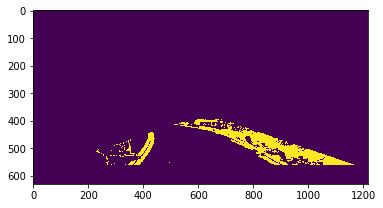

In [100]:
output = 'test_videos_output/harder_challenge_video.mp4'
## To speed up the testing process you may want to try your pipeline on a shorter subclip of the video
## To do so add .subclip(start_second,end_second) to the end of the line below
## Where start_second and end_second are integer values representing the start and end of the subclip
## You may also uncomment the following line for a subclip of the first 5 seconds
##clip1 = VideoFileClip("test_videos/solidWhiteRight.mp4").subclip(0,5)
clip1 = VideoFileClip("harder_challenge_video.mp4")
clip = clip1.fl_image(final_pipeline) #NOTE: this function expects color images!!
%time clip.write_videofile(output, audio=False)

In [ ]:
HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format(output))